In [1]:
import pandas as pd
import sqlite3
import datetime
import numpy as np
import matplotlib as mpl
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import PercentFormatter
import math
from urllib.parse import urlparse, parse_qs
mpl.rcParams['figure.dpi'] = 200
okabe_ito = ["#000000", "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7"]
sns.set_context('paper')
sns.set_palette(sns.color_palette(okabe_ito))
#https://stackoverflow.com/a/45846841
def human_format(num):
    num = float('{:.3g}'.format(num))
    magnitude = 0
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    return '{}{}'.format('{:f}'.format(num).rstrip('0').rstrip('.'), ['', 'K', 'M', 'B', 'T'][magnitude])
def make_cdf(series):
    return series.value_counts(normalize=True).sort_index().cumsum()
def make_pdf(series):
    return series.value_counts(normalize=True).sort_index()

In [2]:
conn = sqlite3.connect('web-performance-2022-06-14.db')
#conn = sqlite3.connect('web-performance-wikipedia-still-weird.db')
measurements = pd.read_sql_query("SELECT * FROM measurements", conn)
measurements

,msm_id,timestamp,experiment_type,error,website
0,d31444a1-777c-45ae-bb04-f67fbcf67716,2022-06-08_15_01_00,dsl,,www.example.org
1,ec2d9a45-57d7-46ec-a505-26427fb1aa48,2022-06-08_15_01_54,cable,,www.example.org
2,a43c51c9-7361-47e7-8b05-95c7d2105c7f,2022-06-08_15_02_48,fiber,,www.example.org
3,4d5392b4-2eda-438c-b2d3-233007fecf79,2022-06-08_15_03_42,4g,,www.example.org
4,00dc53ef-e9fa-45e6-af88-2804ef7f2a57,2022-06-08_15_04_36,4g-medium,,www.example.org
...,...,...,...,...,...
8846,2e4ac083-072f-4171-be31-e4cab5cfb9ad,2022-06-14_10_11_14,4g,,www.instagram.com
8847,43536617-7849-4070-940d-8784b0b4de63,2022-06-14_10_12_11,4g-medium,,www.instagram.com
8848,7a574ff4-9956-461d-ada9-10490281a69d,2022-06-14_10_13_13,dsl,,www.example.org
8849,e1056630-be7e-4c24-ba19-b7d04854dbc6,2022-06-14_10_14_07,cable,,www.example.org


In [3]:
measurements.error.value_counts()

    8851
Name: error, dtype: int64

In [4]:
df_web_perf = pd.read_sql_query("SELECT * FROM web_performance_metrics", conn)
df_dns_perf = pd.read_sql_query("SELECT * FROM dns_metrics", conn)
df_lookups = pd.read_sql_query("SELECT * FROM lookups", conn)
conn.close()

In [5]:
df_web_perf = pd.merge(df_web_perf, measurements, on='msm_id')

In [6]:
df_web_perf.groupby(['website','experiment_type', 'is_warmup']).agg(plt=('loadEventStart', 'median'),fcp=('firstContentfulPaint', 'median'))

plt     fcp
website           experiment_type is_warmup                 
www.example.org   4g              0           106.70  116.40
                                  1           266.70  272.30
                  4g-medium       0           121.50  131.50
                                  1           294.80  300.40
                  cable           0            40.20   50.80
                                  1           132.70  138.30
                  dsl             0            72.20   82.50
                                  1           186.60  192.40
                  fiber           0            29.20   39.00
                                  1           103.90  116.10
www.instagram.com 4g              0           326.80  148.15
                                  1          1694.35  280.10
                  4g-medium       0           359.10  161.60
                                  1          2396.05  310.05
                  cable           0           189.40   81.00
                                  1           742.70  146.50
                  dsl             0           315.65  103.10
                                  1          4554.55  200.50
                  fiber           0           171.10   70.30
                                  1           837.60  117.65
www.wikipedia.org 4g              0           135.60  122.50
                                  1           595.55  468.45
                  4g-medium       0           149.80  137.20
                                  1           623.05  480.90
                  cable           0            68.00   55.70
                                  1           354.30  330.95
                  dsl             0            99.70   87.80
                                  1           419.85  290.90
                  fiber           0            57.30   44.90
                                  1           320.10  228.80

In [7]:
df_dns_perf_metrics = df_dns_perf.copy()

In [8]:
df_dns_perf_metrics['metric'] = df_dns_perf_metrics['metric'].replace({'metrics:DoUDP UDP setup duration from': 'metrics:DoUDP UDP setup duration from '}, regex=True)

df_dns_perf_metrics['metric_type'] = "none"
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("setup duration"), "handshake", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("exchange duration"), "exchange", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("query duration"), "query", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("handshake duration"), "handshake", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("DoH query"), "lazy-init-handshake-and-query", df_dns_perf_metrics['metric_type'])

df_dns_perf_metrics['duration'] = df_dns_perf_metrics.metric.str.split(' ').str[-1]
df_dns_perf_metrics['duration'] = df_dns_perf_metrics['duration'].str[:-2]

df_dns_perf_metrics['base'] = 1000
df_dns_perf_metrics['base'] = np.where(df_dns_perf_metrics.duration.str[-1] == 'm', 1, df_dns_perf_metrics['base'])
df_dns_perf_metrics['base'] = np.where(df_dns_perf_metrics.duration.str[-1] == 'µ', 1/1000, df_dns_perf_metrics['base'])

df_dns_perf_metrics['duration'] = np.where((df_dns_perf_metrics.duration.str[-1] != 'm') & (df_dns_perf_metrics.duration.str[-1] != 'µ'), df_dns_perf_metrics['duration']+'s', df_dns_perf_metrics['duration'])

df_dns_perf_metrics['duration'] = df_dns_perf_metrics['duration'].str[:-1]
df_dns_perf_metrics['duration'] = df_dns_perf_metrics['duration'].astype(float) * df_dns_perf_metrics['base']

df_dns_perf_metrics['metric'] = df_dns_perf_metrics['metric'].str[8:]

df_dns_perf_metrics['metric_start'] = df_dns_perf_metrics['metric'].str.extract(r'\sfrom\s(.*?)\sto\s')

df_dns_perf_metrics['metric_end'] = df_dns_perf_metrics['metric'].str.extract(r'\sto\s(.*?)\:\s')

df_dns_perf_metrics['protocol'] = df_dns_perf_metrics.metric.str.split(' ').str[0]

df_dns_perf_metrics['domain'] = df_dns_perf_metrics['metric'].str.extract(r'\sfor\s\[\;(.*?)\]\s')

df_dns_perf_metrics.metric_start = "2022 "+df_dns_perf_metrics.metric_start
df_dns_perf_metrics.metric_end = "2022 "+df_dns_perf_metrics.metric_end

df_dns_perf_metrics.metric_start = pd.to_datetime(df_dns_perf_metrics.metric_start, format="%Y %b %d %H:%M:%S.%f")

df_dns_perf_metrics.metric_end = pd.to_datetime(df_dns_perf_metrics.metric_end, format="%Y %b %d %H:%M:%S.%f")

df_dns_perf_metrics.domain = df_dns_perf_metrics.domain.str[:-7]

In [9]:
df_dns_perf_metrics[df_dns_perf_metrics.metric_type=='exchange'].groupby(['transport_protocol', 'is_warmup']).agg(lookup_dur=('duration','median'))

,,lookup_dur
transport_protocol,is_warmup,
DoH,0,148.582297
DoQ,0,124.318977
DoUDP,0,44.127819


In [10]:
df_exchange_times = df_dns_perf_metrics[df_dns_perf_metrics.metric_type=='exchange'].copy()
df_exchange_times['elapsed'] = df_exchange_times['duration']

In [11]:
df_dns_and_h3 = pd.merge(df_web_perf, df_exchange_times[['msm_id', 'elapsed', 'transport_protocol']], on='msm_id')


In [12]:
df_dns_and_h3['full_plt'] = df_dns_and_h3['elapsed'] + df_dns_and_h3['loadEventStart']
df_dns_and_h3['full_fp'] = df_dns_and_h3['elapsed'] + df_dns_and_h3['firstPaint']
df_dns_and_h3['full_fcp'] = df_dns_and_h3['elapsed'] + df_dns_and_h3['firstContentfulPaint']

In [13]:
df_dns_and_h3['h3_description'] = 'H3 1-RTT'
df_dns_and_h3['h3_description'] = np.where(df_dns_and_h3['is_warmup'] == 0, 'H3 0-RTT', df_dns_and_h3['h3_description'])

In [14]:
df_dns_and_h3.h3_description.value_counts() #thrice the actual value because of join

H3 1-RTT    26553
H3 0-RTT    26553
Name: h3_description, dtype: int64

In [15]:
df_dns_and_h3.transport_protocol.value_counts() #twice the actual value because of join

DoQ      17702
DoH      17702
DoUDP    17702
Name: transport_protocol, dtype: int64

In [16]:
df_dns_and_h3.website.value_counts()

www.instagram.com    19080
www.example.org      17046
www.wikipedia.org    16980
Name: website, dtype: int64

In [17]:
df_dns_and_h3.experiment_type.value_counts()

dsl          10626
cable        10626
fiber        10626
4g           10614
4g-medium    10614
Name: experiment_type, dtype: int64

In [18]:
df_dns_and_h3['experiment_description'] = df_dns_and_h3.transport_protocol + ' + ' + df_dns_and_h3.h3_description

In [19]:
df_dns_and_h3['experiment_description'].value_counts()

DoQ + H3 1-RTT      8851
DoH + H3 1-RTT      8851
DoUDP + H3 1-RTT    8851
DoQ + H3 0-RTT      8851
DoH + H3 0-RTT      8851
DoUDP + H3 0-RTT    8851
Name: experiment_description, dtype: int64

count    8851.000000
mean     1074.813885
std      1198.524984
min       130.541638
10%       195.933376
20%       329.370389
25%       376.798692
30%       424.964513
40%       516.875402
50%       560.988792
60%       805.075411
70%       866.499546
75%       880.751958
80%      1884.518122
90%      2624.183814
100%     4709.950834
max      4709.950834
Name: full_plt, dtype: float64
count    8851.000000
mean      290.082092
std       151.586373
min        65.106910
10%        99.436017
20%       131.092057
25%       185.441543
30%       197.418273
40%       220.763337
50%       260.641894
60%       326.232191
70%       368.110243
75%       381.351839
80%       435.679366
90%       524.141915
100%      606.727058
max       606.727058
Name: full_plt, dtype: float64
count    8851.000000
mean     1125.491691
std      1204.130206
min       145.883457
10%       219.455538
20%       347.517007
25%       391.614229
30%       448.710685
40%       556.540090
50%       622.870690
60%       849.

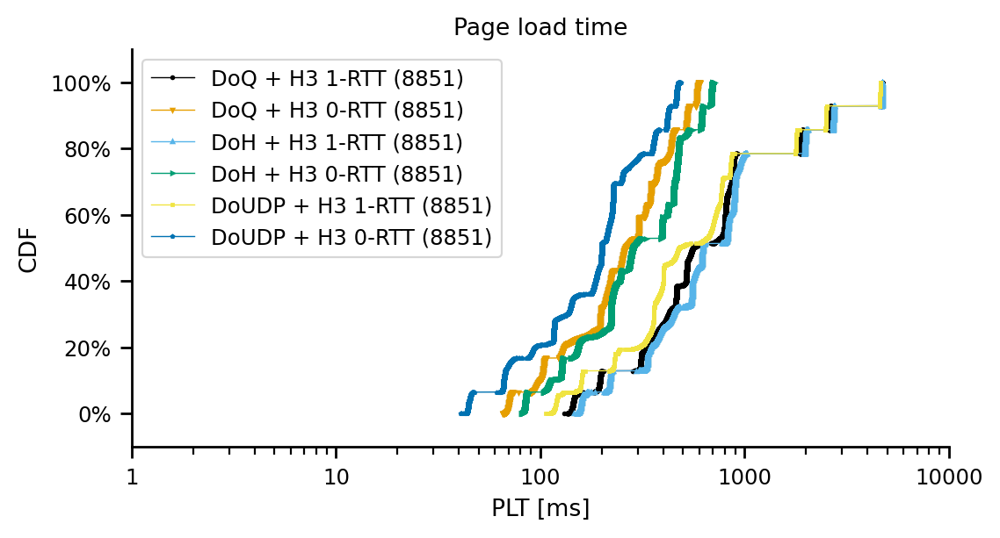

In [20]:
df_plt = df_dns_and_h3
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=True
for experiment in line_order:
        df_tmp = df_plt[(df_plt.experiment_description == experiment)]
        if len(df_tmp['full_plt']) == 0:
            continue
        print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['full_plt'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Page load time')

ax.set_xlabel('PLT [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,10000)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    2841.000000
mean      326.599764
std       145.659656
min       130.541638
10%       144.861115
20%       170.151301
25%       193.776980
30%       195.628325
40%       201.845615
50%       311.081857
60%       325.560366
70%       462.681590
75%       463.965108
80%       472.202682
90%       520.176005
100%      531.854327
max       531.854327
Name: full_plt, dtype: float64
count    2841.000000
mean      203.986071
std       108.030941
min        65.106910
10%        70.333778
20%        77.902761
25%       102.656240
30%       103.452208
40%       106.427144
50%       196.941477
60%       199.951632
70%       303.008069
75%       303.581829
80%       306.041771
90%       347.211962
100%      350.429995
max       350.429995
Name: full_plt, dtype: float64
count    2841.000000
mean      377.192995
std       181.409695
min       145.883457
10%       158.757464
20%       184.151268
25%       217.535314
30%       219.166589
40%       224.006390
50%       335.119695
60%       349.

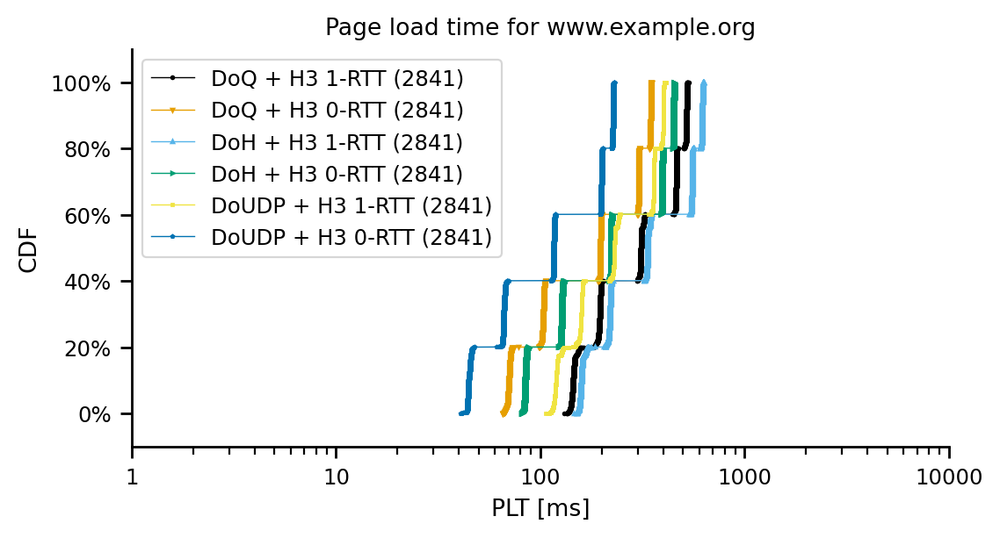

count    2830.000000
mean      588.732902
std       196.424192
min       283.875762
10%       358.699764
20%       382.478024
25%       403.428532
30%       417.130458
40%       474.735684
50%       544.402924
60%       646.518030
70%       788.538220
75%       800.895149
80%       812.857911
90%       848.485048
100%      922.278684
max       922.278684
Name: full_plt, dtype: float64
count    2830.000000
mean      249.358061
std       110.927396
min        86.954136
10%        98.503981
20%       129.432921
25%       134.105931
30%       150.505717
40%       212.336433
50%       224.144443
60%       310.726353
70%       331.509182
75%       369.609458
80%       372.576820
90%       383.647768
100%      454.401893
max       454.401893
Name: full_plt, dtype: float64
count    2830.000000
mean      639.447300
std       232.433763
min       294.770966
10%       374.179942
20%       398.200237
25%       427.113088
30%       440.647147
40%       498.128938
50%       568.478796
60%       697.

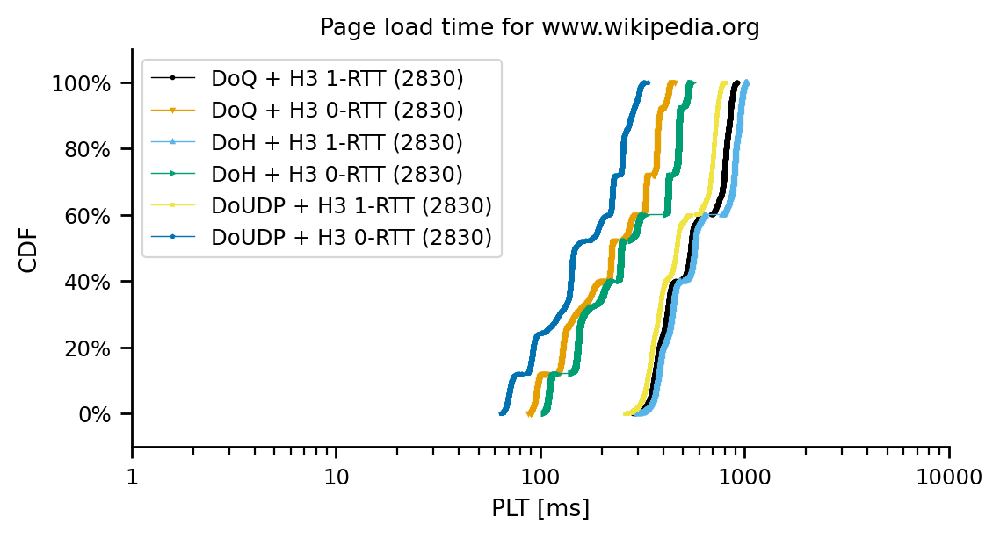

count    3180.000000
mean     2175.847061
std      1422.102812
min       777.021518
10%       805.642602
20%       856.560520
25%       873.694618
30%       878.343933
40%      1483.720898
50%      1890.452428
60%      2213.418255
70%      2621.566481
75%      2627.750387
80%      3054.482974
90%      4679.266678
100%     4709.950834
max      4709.950834
Name: full_plt, dtype: float64
count    3180.000000
mean      403.241778
std       147.252463
min       201.653230
10%       211.937024
20%       240.583523
25%       249.374413
30%       252.550557
40%       368.736588
50%       440.066470
60%       484.414362
70%       522.819341
75%       526.883651
80%       549.713361
90%       584.601342
100%      606.727058
max       606.727058
Name: full_plt, dtype: float64
count    3180.000000
mean     2226.567861
std      1426.710729
min       802.112044
10%       829.179697
20%       873.902033
25%       887.766150
30%       892.302467
40%      1543.176629
50%      1981.566976
60%      2309.

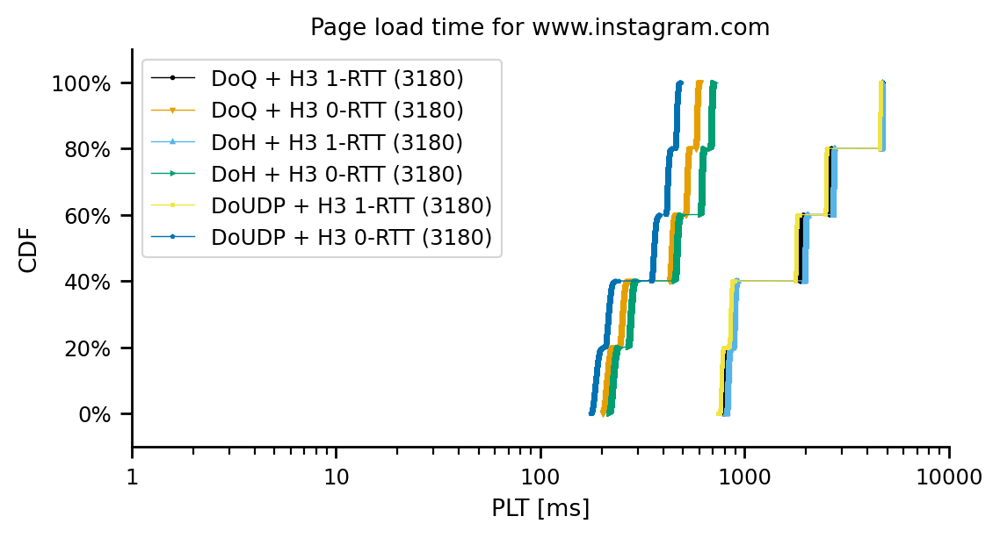

In [21]:
df_plt = df_dns_and_h3
for website in df_plt['website'].unique():
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

    lnwidth = 0.5
    mrksize = 1
    log=True
    for experiment in line_order:
            df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
            if len(df_tmp['full_plt']) == 0:
                continue
            print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

            dfplt = make_cdf(df_tmp['full_plt'])
            dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Page load time for '+website)

    ax.set_xlabel('PLT [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(1,10000)


    ax.legend()

    #if log:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
    #else:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
    plt.show()

dsl
count    569.000000
mean     312.115834
std        5.441000
min      297.248899
10%      307.224697
20%      308.931396
25%      309.347025
30%      309.763541
40%      310.377892
50%      311.092984
60%      311.718211
70%      312.436486
75%      313.041512
80%      314.614496
90%      321.394718
100%     326.253237
max      326.253237
Name: full_plt, dtype: float64
count    569.000000
mean     196.938330
std        1.089641
min      191.384091
10%      195.821729
20%      196.096633
25%      196.198974
30%      196.276324
40%      196.582351
50%      196.944188
60%      197.239983
70%      197.433456
75%      197.588813
80%      197.753914
90%      198.350674
100%     200.243854
max      200.243854
Name: full_plt, dtype: float64
count    569.000000
mean     336.192529
std        5.439006
min      321.542713
10%      331.056181
20%      333.126902
25%      333.493832
30%      333.795730
40%      334.460502
50%      335.143830
60%      335.776243
70%      336.515209
75%      337.0

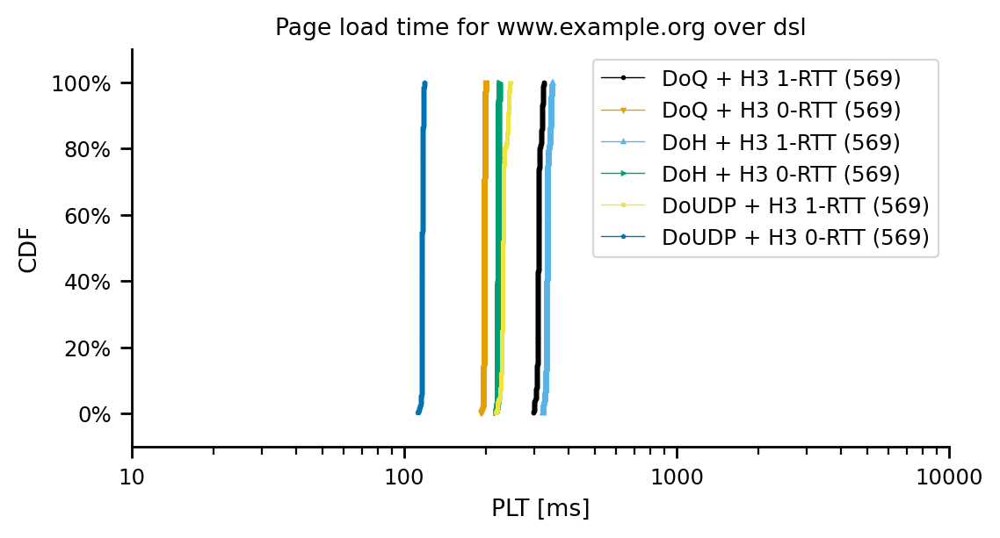

count    566.000000
mean     545.558366
std       25.592570
min      474.771217
10%      515.711944
20%      527.179689
25%      531.158814
30%      534.317278
40%      540.626839
50%      544.402924
60%      549.064312
70%      553.647382
75%      556.026576
80%      560.988792
90%      584.490249
100%     622.779649
max      622.779649
Name: full_plt, dtype: float64
count    566.000000
mean     242.326917
std       25.900421
min      216.399522
10%      219.800696
20%      220.857623
25%      221.337795
30%      221.991660
40%      222.808482
50%      224.144443
60%      229.551510
70%      268.078476
75%      270.531090
80%      273.473719
90%      279.331028
100%     304.379689
max      304.379689
Name: full_plt, dtype: float64
count    566.000000
mean     569.663446
std       25.533288
min      497.988179
10%      539.916557
20%      551.320482
25%      555.562037
30%      558.346359
40%      564.398481
50%      568.478796
60%      573.116720
70%      577.701923
75%      579.99355

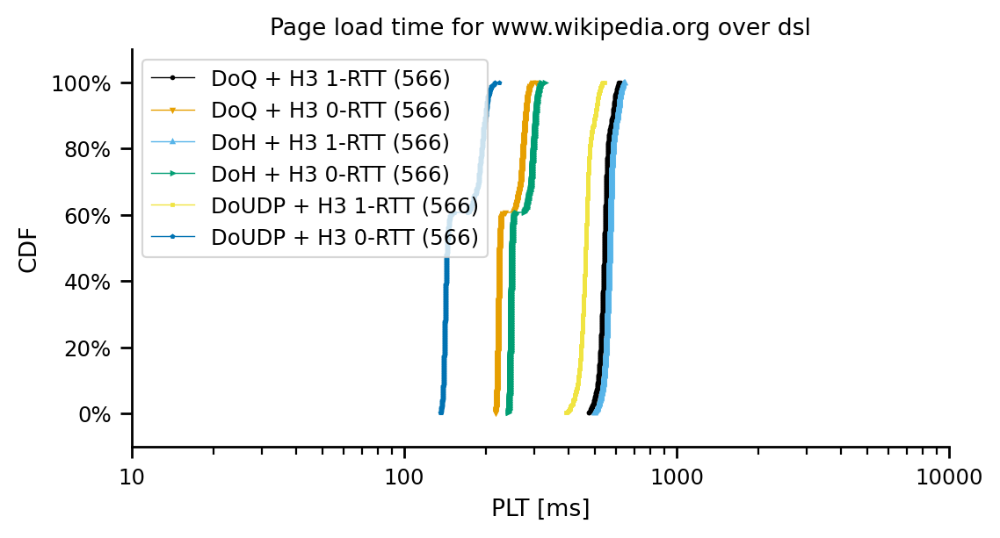

count     636.000000
mean     4680.288150
std         7.671565
min      4663.850140
10%      4671.212496
20%      4673.656666
25%      4674.622604
30%      4675.409775
40%      4676.957792
50%      4679.282286
60%      4681.894759
70%      4684.040287
75%      4685.245696
80%      4686.514848
90%      4690.230855
100%     4709.950834
max      4709.950834
Name: full_plt, dtype: float64
count    636.000000
mean     440.880603
std        6.452428
min      428.189611
10%      433.669326
20%      435.152424
25%      435.830756
30%      436.602658
40%      438.325107
50%      440.066470
60%      441.682469
70%      443.596036
75%      444.687776
80%      445.887692
90%      449.568581
100%     465.496043
max      465.496043
Name: full_plt, dtype: float64
count     636.000000
mean     4704.458826
std         7.694838
min      4686.799056
10%      4695.415488
20%      4697.830459
25%      4698.689828
30%      4699.557934
40%      4701.109971
50%      4703.481869
60%      4706.166896
70%      4

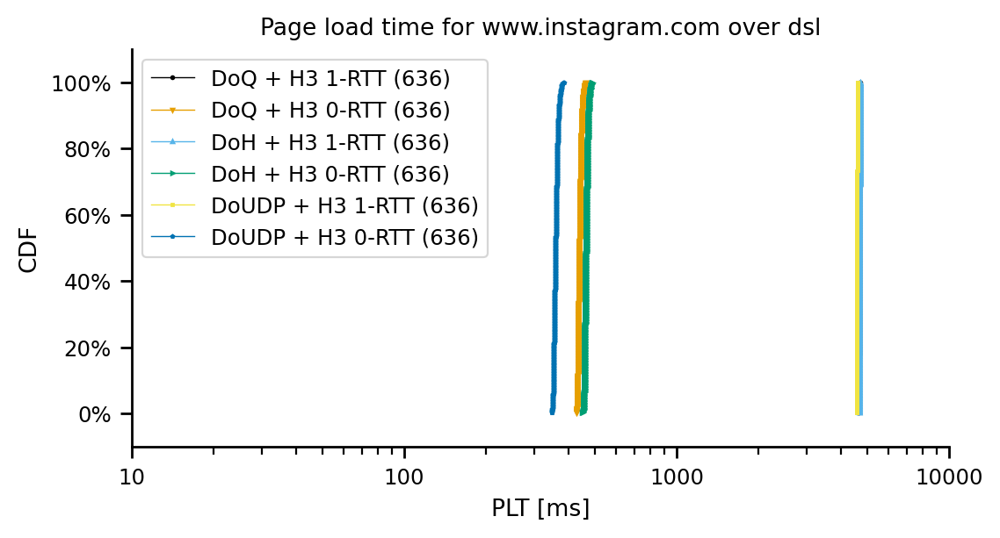

cable
count    569.000000
mean     194.963255
std        3.214415
min      181.320756
10%      191.005510
20%      193.144191
25%      193.823654
30%      194.282879
40%      195.085586
50%      195.646543
60%      196.113140
70%      196.783350
75%      197.032142
80%      197.329533
90%      198.062612
100%     203.253754
max      203.253754
Name: full_plt, dtype: float64
count    569.000000
mean     103.387157
std        1.206406
min       97.993928
10%      102.223764
20%      102.551201
25%      102.661492
30%      102.800263
40%      103.113680
50%      103.454012
60%      103.760738
70%      104.026543
75%      104.116154
80%      104.292882
90%      104.777106
100%     106.501252
max      106.501252
Name: full_plt, dtype: float64
count    569.000000
mean     218.481635
std        3.152002
min      205.148920
10%      214.759131
20%      216.887102
25%      217.543456
30%      217.796709
40%      218.562567
50%      219.172144
60%      219.701235
70%      220.315928
75%      220

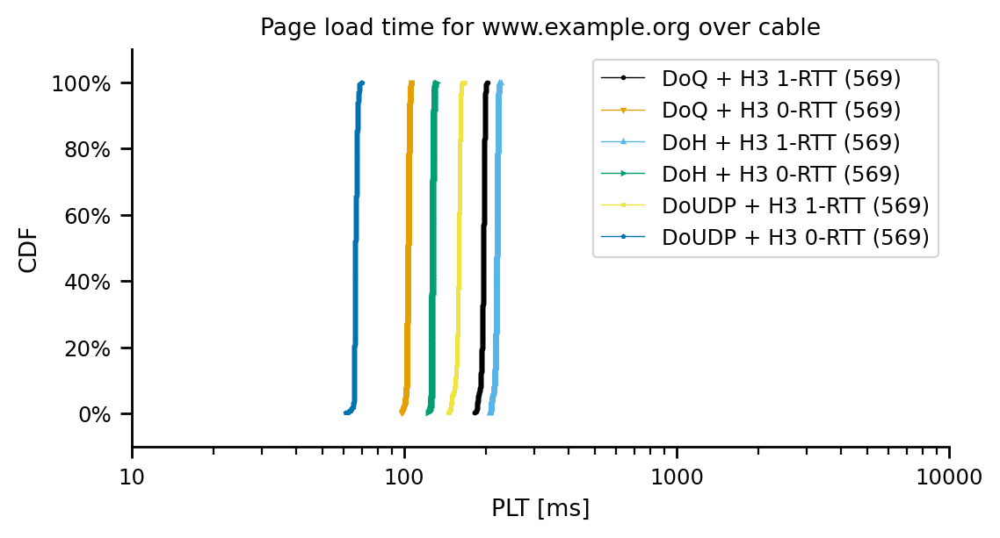

count    566.000000
mean     413.778693
std       21.232350
min      335.840576
10%      387.965163
20%      398.224595
25%      403.428532
30%      407.153359
40%      412.579453
50%      417.117434
60%      421.260934
70%      426.005268
75%      427.617580
80%      429.994386
90%      436.893549
100%     474.682385
max      474.682385
Name: full_plt, dtype: float64
count    566.000000
mean     148.635937
std       25.589027
min      122.625688
10%      126.091503
20%      127.437750
25%      128.099678
30%      128.595129
40%      129.621644
50%      131.214820
60%      135.528221
70%      172.877434
75%      176.728377
80%      179.509017
90%      185.441543
100%     206.241799
max      206.241799
Name: full_plt, dtype: float64
count    566.000000
mean     437.262232
std       21.198003
min      359.286418
10%      411.264047
20%      422.290469
25%      427.113088
30%      430.520597
40%      435.789082
50%      440.639506
60%      444.703067
70%      449.524116
75%      450.87802

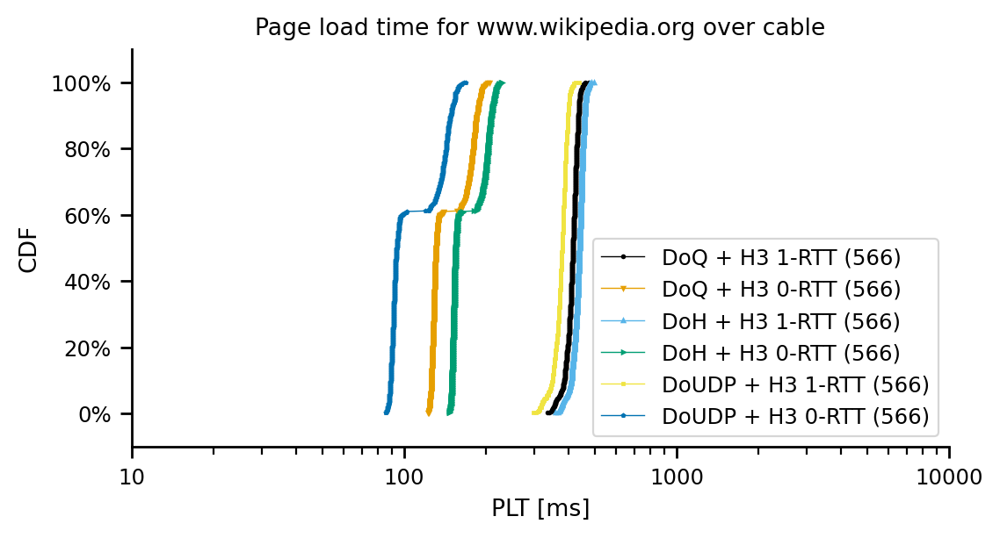

count    636.000000
mean     806.725838
std        8.218480
min      777.021518
10%      797.577829
20%      800.183039
25%      801.180105
30%      802.148795
40%      803.951493
50%      805.640837
60%      808.023447
70%      810.184223
75%      811.363089
80%      813.144926
90%      816.885133
100%     859.369072
max      859.369072
Name: full_plt, dtype: float64
count    636.000000
mean     253.158543
std        5.030635
min      243.403592
10%      247.217686
20%      248.704906
25%      249.374413
30%      250.050929
40%      251.229130
50%      252.550038
60%      253.702998
70%      255.587389
75%      256.299210
80%      257.245462
90%      259.874223
100%     279.557053
max      279.557053
Name: full_plt, dtype: float64
count    636.000000
mean     830.242083
std        8.206113
min      802.112044
10%      820.997670
20%      823.615605
25%      824.562125
30%      825.548400
40%      827.365180
50%      829.129866
60%      831.712723
70%      833.600321
75%      835.07138

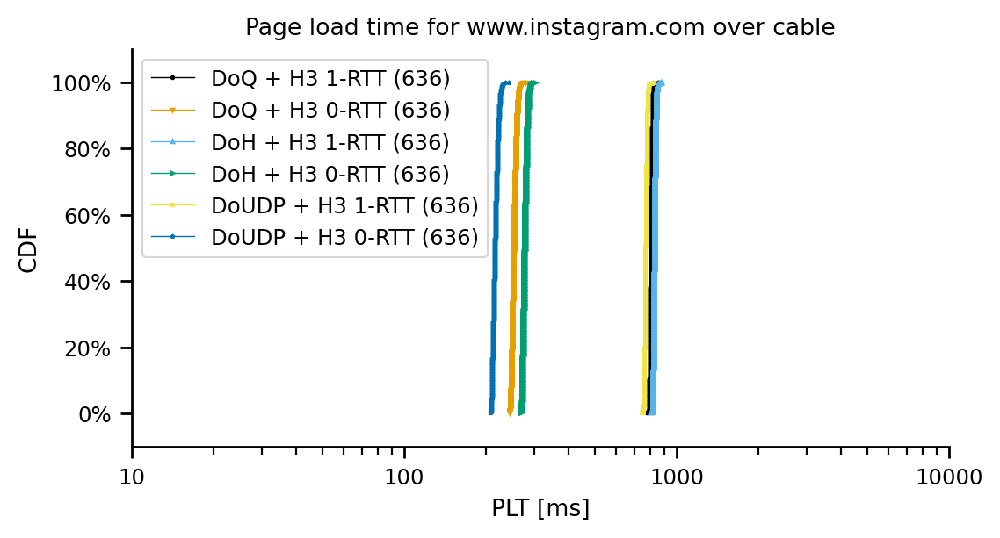

fiber
count    569.000000
mean     145.319181
std        4.234120
min      130.541638
10%      140.892158
20%      142.412767
25%      143.023488
30%      143.512973
40%      144.313680
50%      144.861115
60%      145.456018
70%      146.235462
75%      146.815968
80%      147.217414
90%      151.792898
100%     170.151301
max      170.151301
Name: full_plt, dtype: float64
count    569.000000
mean      70.284207
std        1.352255
min       65.106910
10%       68.880131
20%       69.435730
25%       69.614595
30%       69.726317
40%       70.076226
50%       70.333778
60%       70.661527
70%       70.934292
75%       71.067805
80%       71.230126
90%       71.797743
100%      77.902761
max       77.902761
Name: full_plt, dtype: float64
count    569.000000
mean     159.227133
std        4.118723
min      145.883457
10%      155.206924
20%      156.432506
25%      156.996655
30%      157.424098
40%      158.140419
50%      158.757464
60%      159.330648
70%      160.022414
75%      160

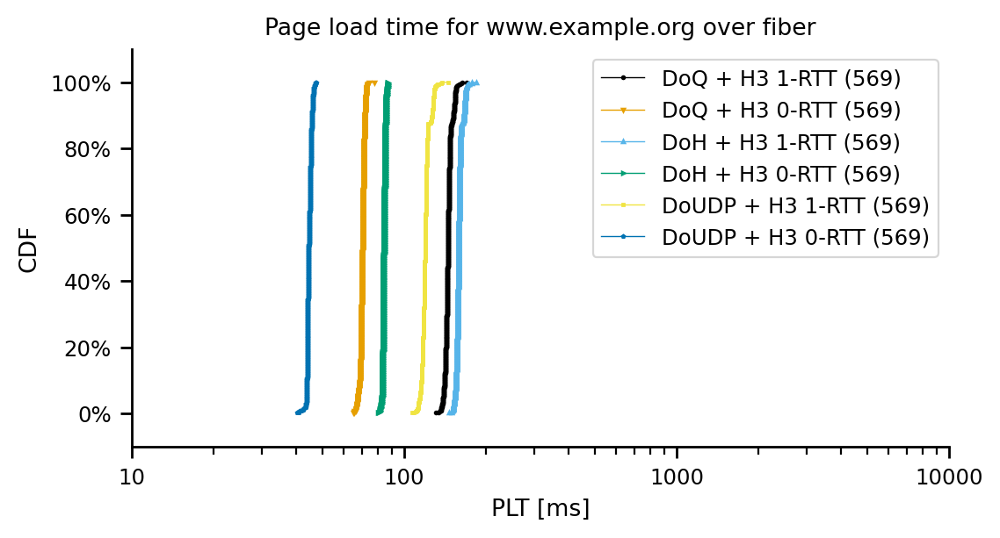

count    566.000000
mean     357.327970
std       21.184037
min      283.875762
10%      326.369242
20%      341.573170
25%      346.630333
30%      350.179141
40%      355.977957
50%      360.626217
60%      366.334725
70%      370.394347
75%      373.070258
80%      375.158685
90%      380.411601
100%     397.453895
max      397.453895
Name: full_plt, dtype: float64
count    566.000000
mean     115.354825
std       24.893860
min       86.954136
10%       93.157166
20%       94.603042
25%       95.277107
30%       95.692718
40%       96.908856
50%       98.501370
60%      106.260486
70%      136.930875
75%      141.128044
80%      144.549959
90%      151.351772
100%     171.838528
max      171.838528
Name: full_plt, dtype: float64
count    566.000000
mean     371.276608
std       21.221209
min      294.770966
10%      340.942668
20%      355.800308
25%      360.456864
30%      364.571821
40%      369.733500
50%      374.936672
60%      379.935377
70%      384.501528
75%      387.07175

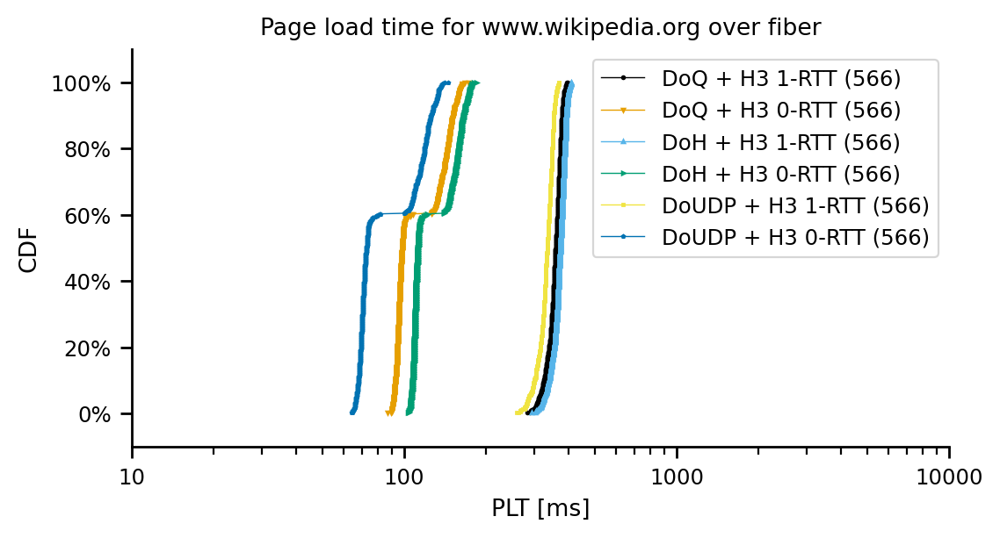

count    636.000000
mean     879.011030
std        7.812077
min      855.160015
10%      869.857522
20%      872.725366
25%      873.694618
30%      874.619193
40%      876.380367
50%      878.339083
60%      880.381807
70%      882.762006
75%      883.991304
80%      885.671830
90%      889.856400
100%     914.758978
max      914.758978
Name: full_plt, dtype: float64
count    636.000000
mean     212.440904
std        5.172525
min      201.653230
10%      206.272121
20%      207.881042
25%      208.599167
30%      209.109174
40%      210.578664
50%      211.926498
60%      213.723832
70%      215.005395
75%      215.824026
80%      216.887926
90%      219.431103
100%     229.303249
max      229.303249
Name: full_plt, dtype: float64
count    636.000000
mean     893.020850
std        7.622158
min      869.575672
10%      883.889212
20%      886.799401
25%      887.766150
30%      888.744302
40%      890.753117
50%      892.285375
60%      894.279904
70%      896.610635
75%      897.65925

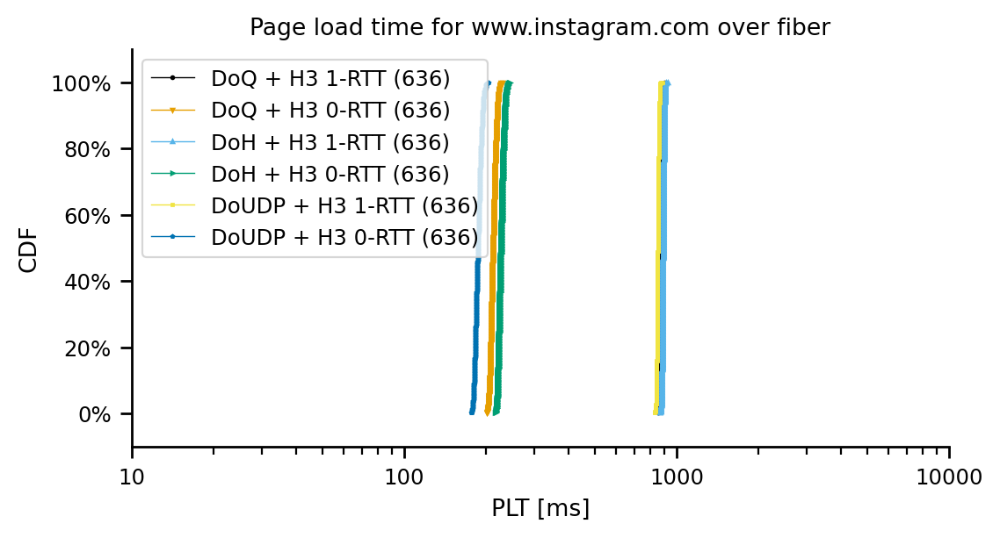

4g
count    567.000000
mean     462.246140
std        3.013840
min      442.345245
10%      459.345126
20%      460.715829
25%      461.276851
30%      461.639882
40%      462.206748
50%      462.708861
60%      463.127170
70%      463.667509
75%      464.002957
80%      464.382992
90%      465.001876
100%     475.913031
max      475.913031
Name: full_plt, dtype: float64
count    567.000000
mean     303.015981
std        1.069395
min      298.184987
10%      301.903246
20%      302.153789
25%      302.276896
30%      302.387417
40%      302.684478
50%      303.017473
60%      303.286099
70%      303.500138
75%      303.618730
80%      303.818717
90%      304.355333
100%     306.191711
max      306.191711
Name: full_plt, dtype: float64
count    567.000000
mean     553.040759
std        2.996318
min      532.959794
10%      550.179946
20%      551.599721
25%      552.060669
30%      552.386641
40%      553.093163
50%      553.648989
60%      554.042882
70%      554.445014
75%      554.66

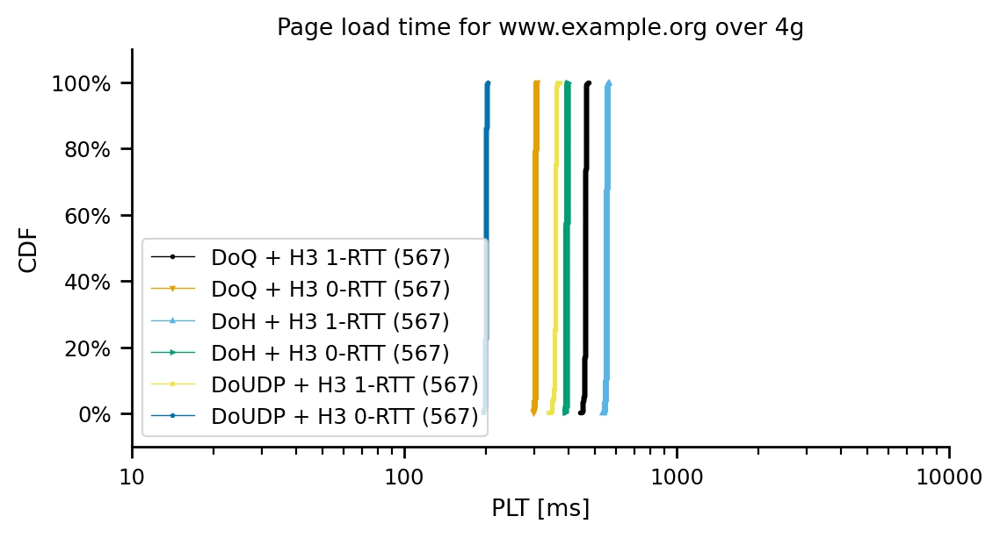

count    566.000000
mean     780.710843
std       34.621597
min      682.125601
10%      723.166197
20%      748.224023
25%      757.225578
30%      769.203403
40%      781.324388
50%      791.713057
60%      798.188195
70%      804.391882
75%      806.883826
80%      809.981914
90%      816.572733
100%     849.265302
max      849.265302
Name: full_plt, dtype: float64
count    566.000000
mean     348.562787
std       25.118728
min      320.246350
10%      325.885088
20%      327.362841
25%      327.844220
30%      328.263408
40%      329.681143
50%      331.514593
60%      360.553809
70%      372.432833
75%      375.298149
80%      378.410394
90%      384.111120
100%     407.037490
max      407.037490
Name: full_plt, dtype: float64
count    566.000000
mean     871.707323
std       34.638582
min      772.871368
10%      814.669133
20%      838.991059
25%      848.153889
30%      860.155876
40%      872.366458
50%      882.436812
60%      889.203304
70%      895.647725
75%      897.93954

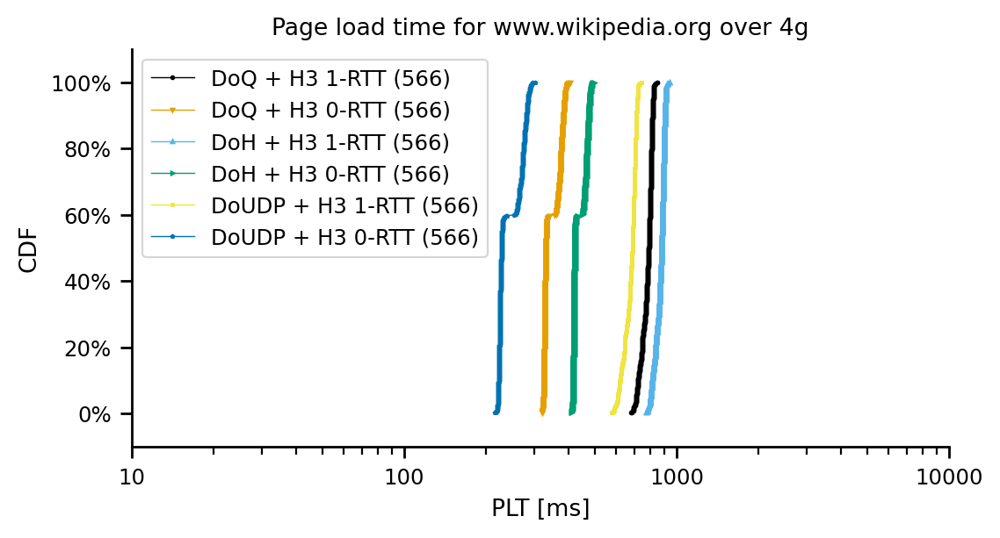

count     636.000000
mean     1891.365279
std         9.678460
min      1863.028844
10%      1880.364820
20%      1883.903191
25%      1885.440771
30%      1886.535825
40%      1888.523841
50%      1890.452428
60%      1892.639008
70%      1895.529203
75%      1896.698020
80%      1897.939601
90%      1902.097202
100%     1955.819145
max      1955.819145
Name: full_plt, dtype: float64
count    636.000000
mean     523.928015
std        5.011434
min      512.791841
10%      518.509476
20%      519.674887
25%      520.124596
30%      520.715506
40%      521.805032
50%      522.819471
60%      524.048991
70%      526.001682
75%      526.883651
80%      528.208399
90%      531.125495
100%     543.286594
max      543.286594
Name: full_plt, dtype: float64
count     636.000000
mean     1982.289754
std         9.717037
min      1954.657838
10%      1971.260706
20%      1974.775343
25%      1976.204441
30%      1977.430843
40%      1979.397392
50%      1981.566976
60%      1983.685266
70%      1

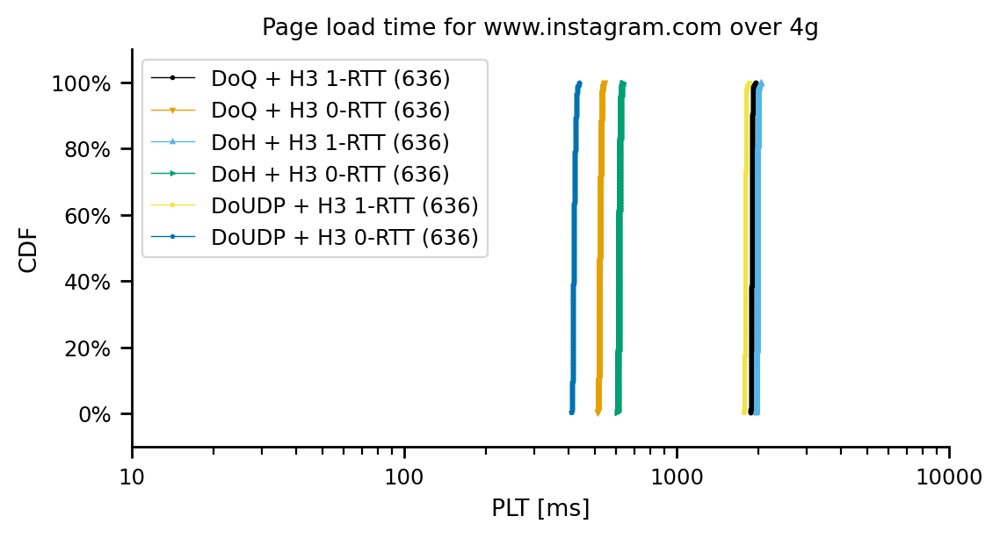

4g-medium
count    567.000000
mean     519.509262
std        3.370663
min      503.219141
10%      515.835716
20%      518.071565
25%      518.596208
30%      519.026456
40%      519.779055
50%      520.177416
60%      520.622436
70%      521.093546
75%      521.373144
80%      521.729081
90%      522.455801
100%     531.854327
max      531.854327
Name: full_plt, dtype: float64
count    567.000000
mean     347.155999
std        1.112852
min      341.582664
10%      346.069815
20%      346.275068
25%      346.394802
30%      346.507089
40%      346.834696
50%      347.217365
60%      347.417315
70%      347.676745
75%      347.802250
80%      347.984829
90%      348.621056
100%     350.429995
max      350.429995
Name: full_plt, dtype: float64
count    567.000000
mean     620.496209
std        3.371672
min      604.201542
10%      616.708759
20%      618.941221
25%      619.564836
30%      620.049135
40%      620.701030
50%      621.260360
60%      621.695910
70%      622.164146
75%     

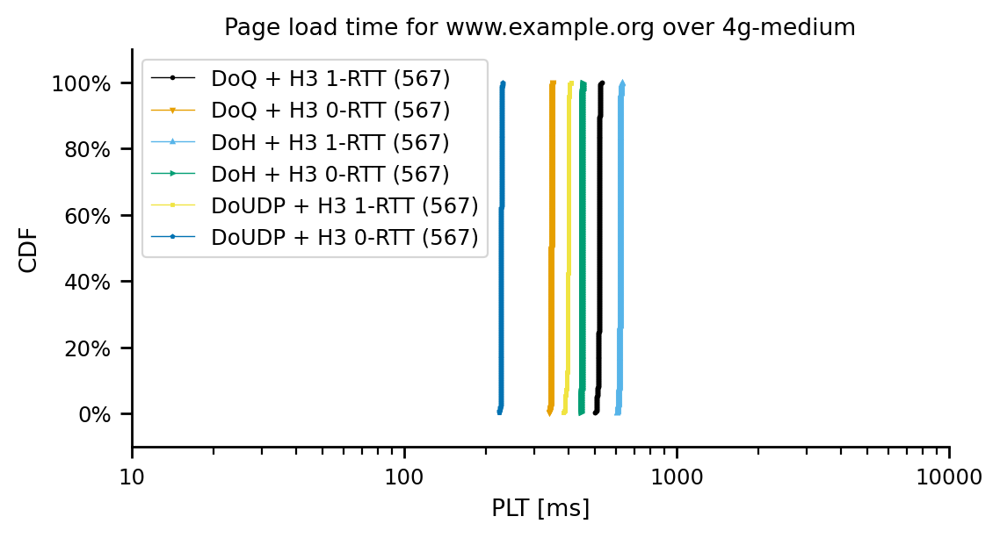

count    566.000000
mean     846.288636
std       29.759431
min      773.119001
10%      799.995059
20%      821.575944
25%      829.209859
30%      833.664328
40%      842.923601
50%      848.451911
60%      853.673566
70%      861.423324
75%      865.571727
80%      872.828009
90%      883.551395
100%     922.278684
max      922.278684
Name: full_plt, dtype: float64
count    566.000000
mean     391.909837
std       24.863986
min      363.823146
10%      370.037247
20%      371.464029
25%      371.973579
30%      372.586107
40%      373.704212
50%      375.372069
60%      380.941550
70%      415.432271
75%      419.639718
80%      422.977433
90%      427.389905
100%     454.401893
max      454.401893
Name: full_plt, dtype: float64
count     566.000000
mean      947.326892
std        29.801105
min       874.479306
10%       901.289368
20%       922.524348
25%       930.157636
30%       934.895800
40%       944.066906
50%       949.539903
60%       954.574242
70%       962.645447
75%   

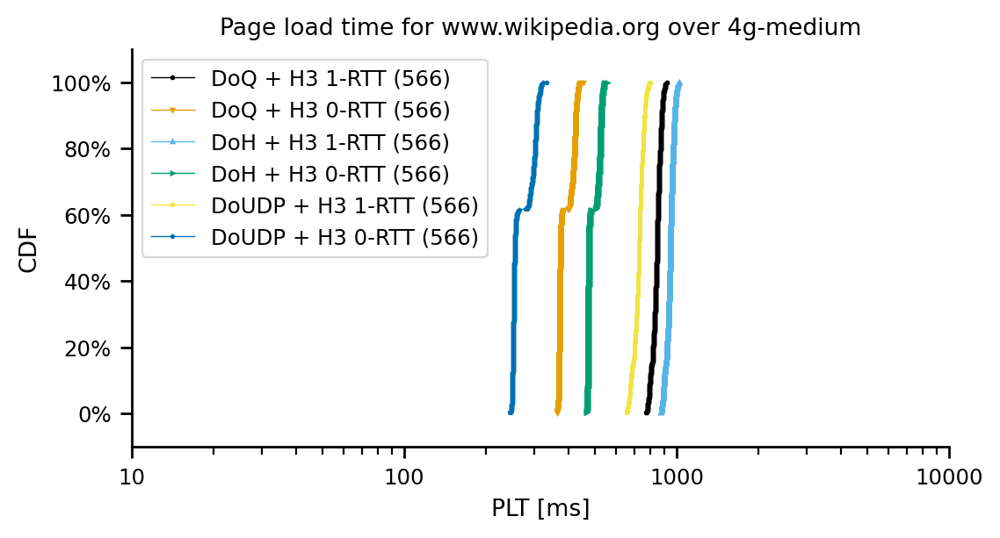

count     636.000000
mean     2621.845009
std         8.707945
min      2599.816920
10%      2610.416853
20%      2613.937034
25%      2615.464948
30%      2616.888599
40%      2619.568623
50%      2621.572062
60%      2624.010237
70%      2626.456514
75%      2627.750387
80%      2629.200517
90%      2633.345590
100%     2652.141183
max      2652.141183
Name: full_plt, dtype: float64
count    636.000000
mean     585.800827
std        4.914732
min      575.420431
10%      580.435077
20%      581.744905
25%      582.227496
30%      582.731170
40%      583.729024
50%      584.601432
60%      585.930683
70%      587.703995
75%      589.078809
80%      590.247704
90%      592.731343
100%     606.727058
max      606.727058
Name: full_plt, dtype: float64
count     636.000000
mean     2722.827789
std         8.711124
min      2700.645313
10%      2711.324173
20%      2715.145673
25%      2716.272558
30%      2717.913644
40%      2720.673171
50%      2722.452581
60%      2725.098224
70%      2

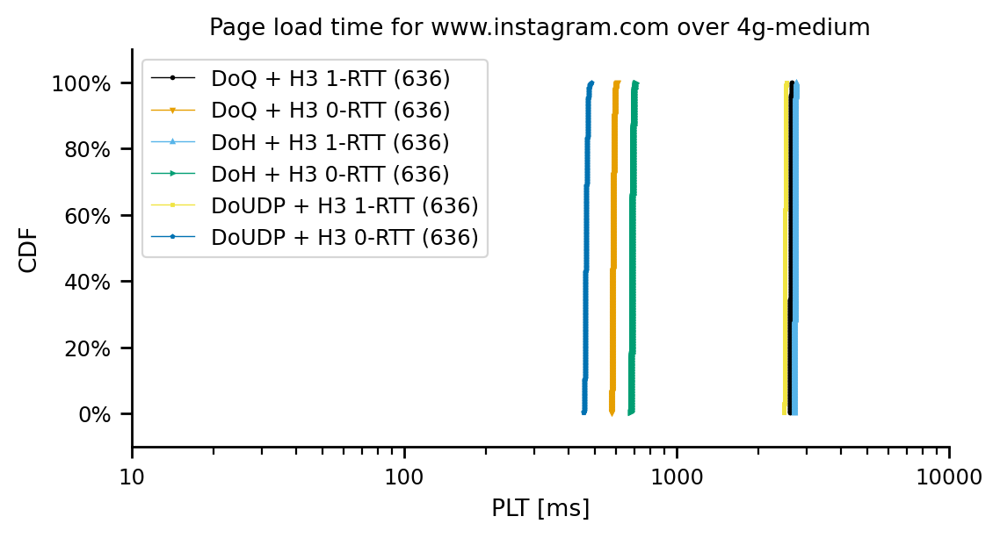

In [23]:
for access_technology in df_dns_and_h3.experiment_type.unique():
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_plt', 'experiment_description', 'website']].copy()
    for website in df_plt['website'].unique():
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=True
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_plt']) == 0:
                    continue
                print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_plt'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('Page load time for '+website+' over '+access_technology)

        ax.set_xlabel('PLT [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(10,10000)


        ax.legend()

        #if log:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
        #else:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
        plt.show()

fiber


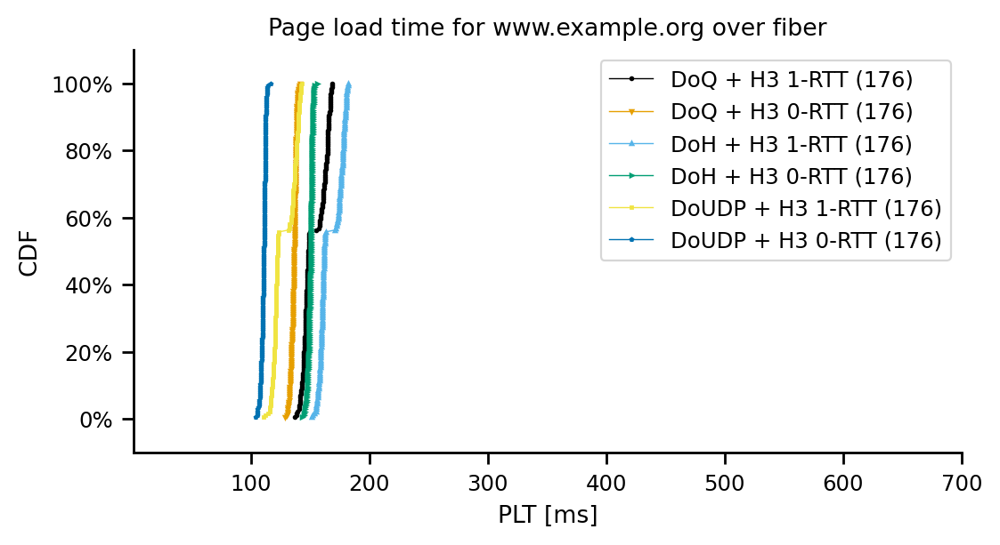

cable


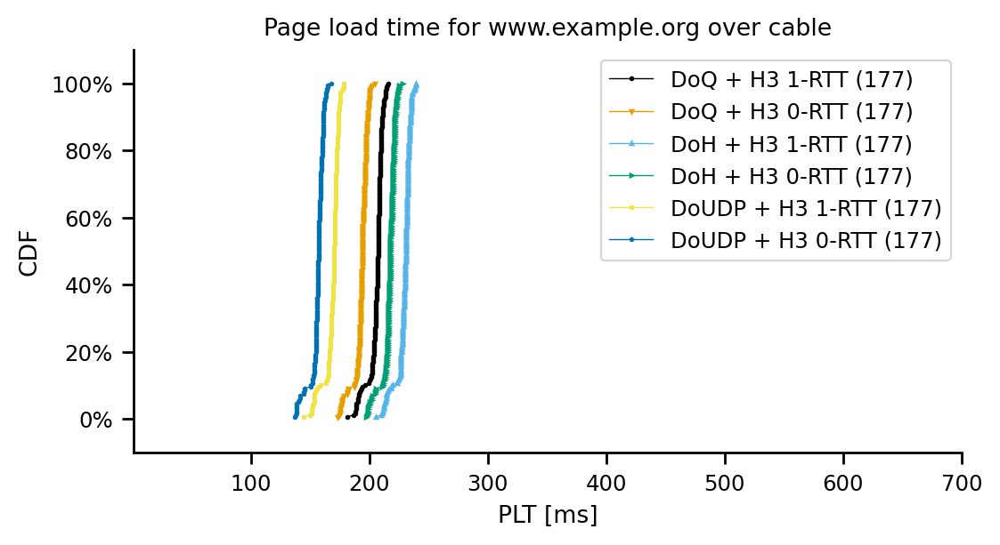

dsl


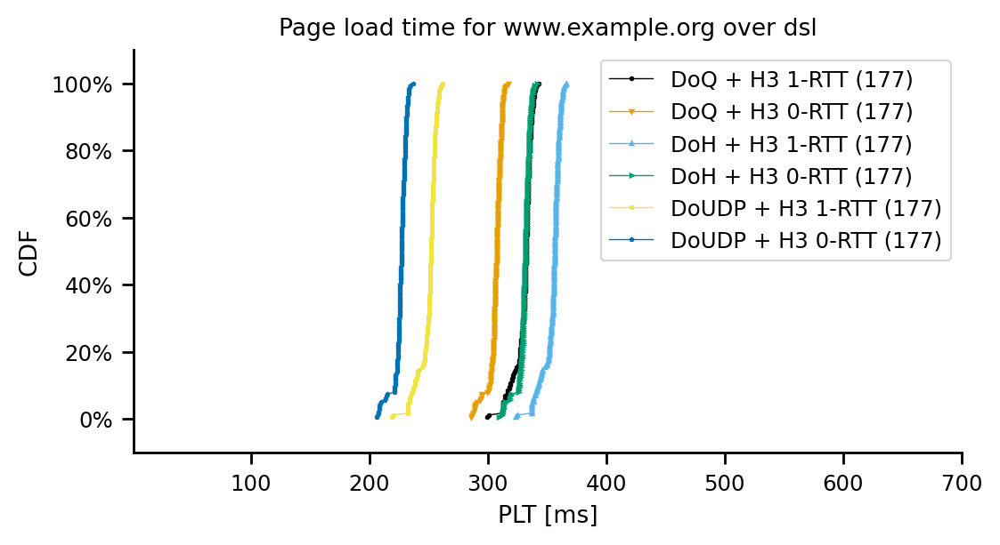

4g


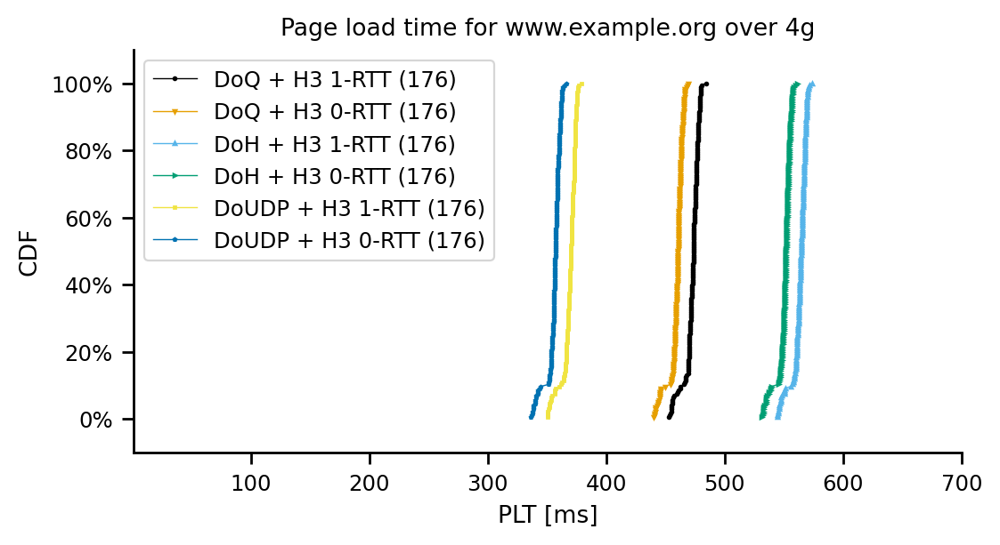

4g-medium


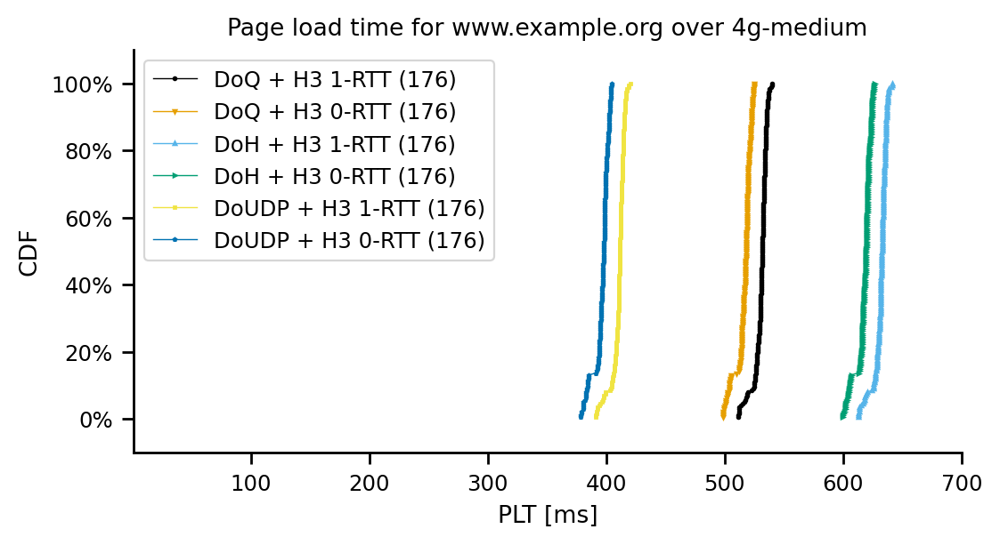

In [853]:
for access_technology in ['fiber', 'cable', 'dsl', '4g', '4g-medium']:
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_plt', 'experiment_description', 'website']].copy()
    for website in ['www.example.org']:
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=False
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_plt']) == 0:
                    continue
                #print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_plt'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('Page load time for '+website+' over '+access_technology)

        ax.set_xlabel('PLT [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(1,700)


        ax.legend()

        #if log:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
        #else:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
        plt.show()

fiber


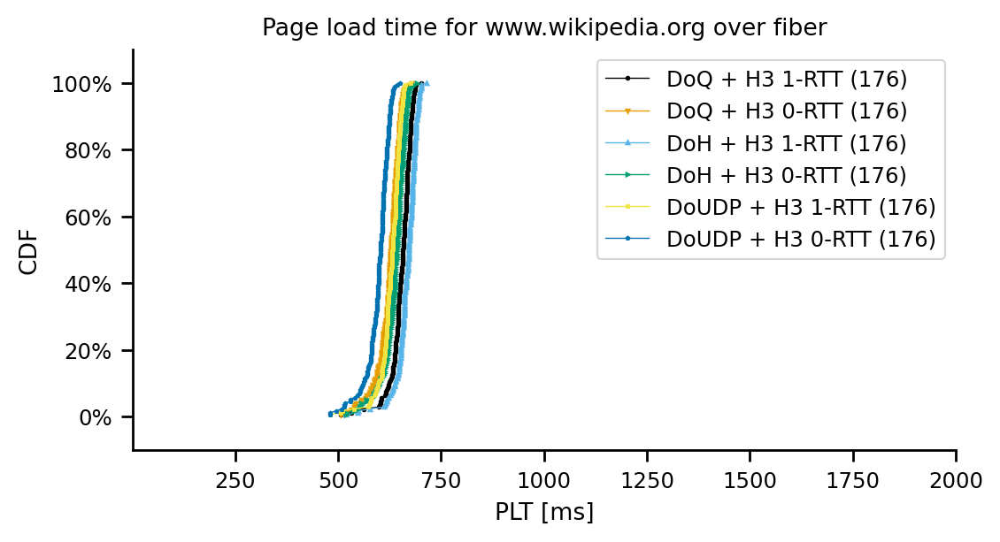

cable


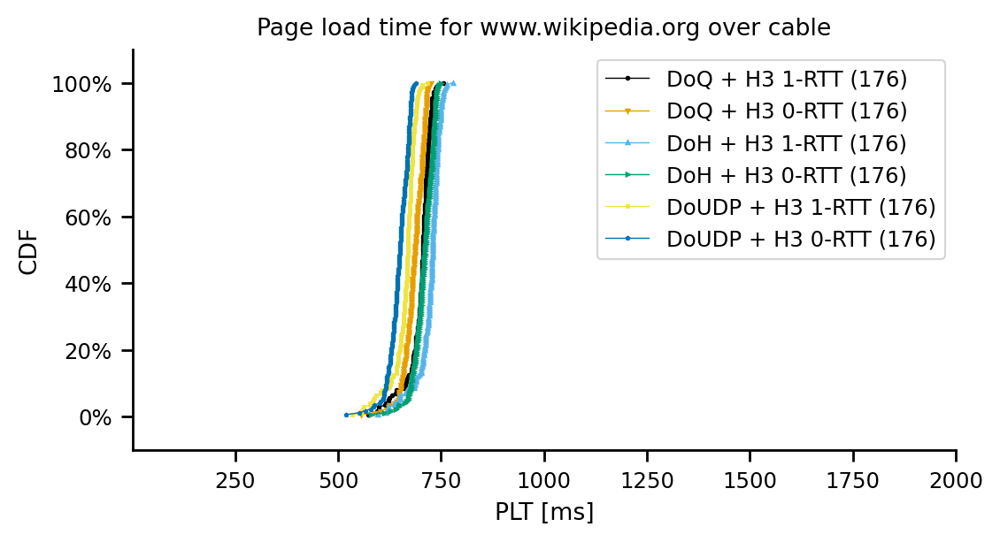

dsl


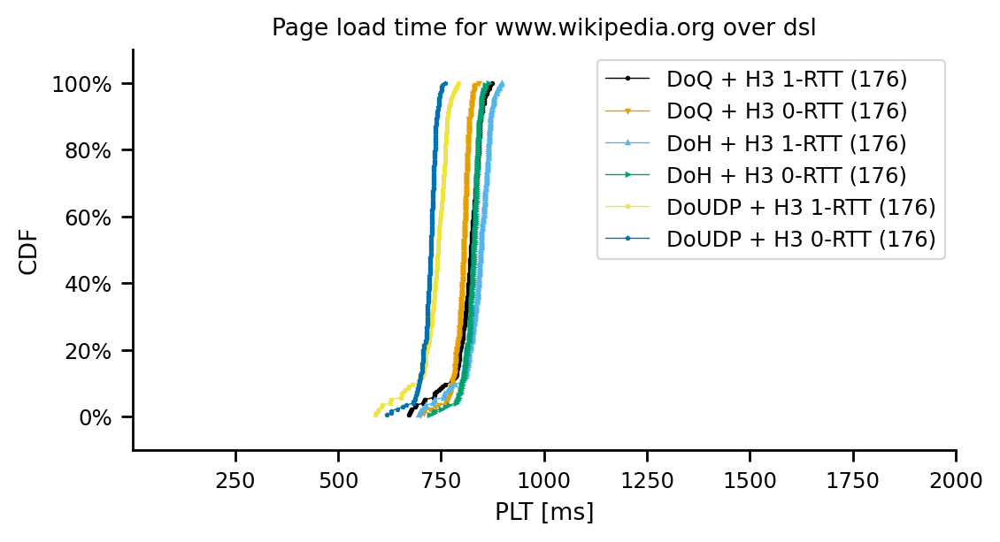

4g


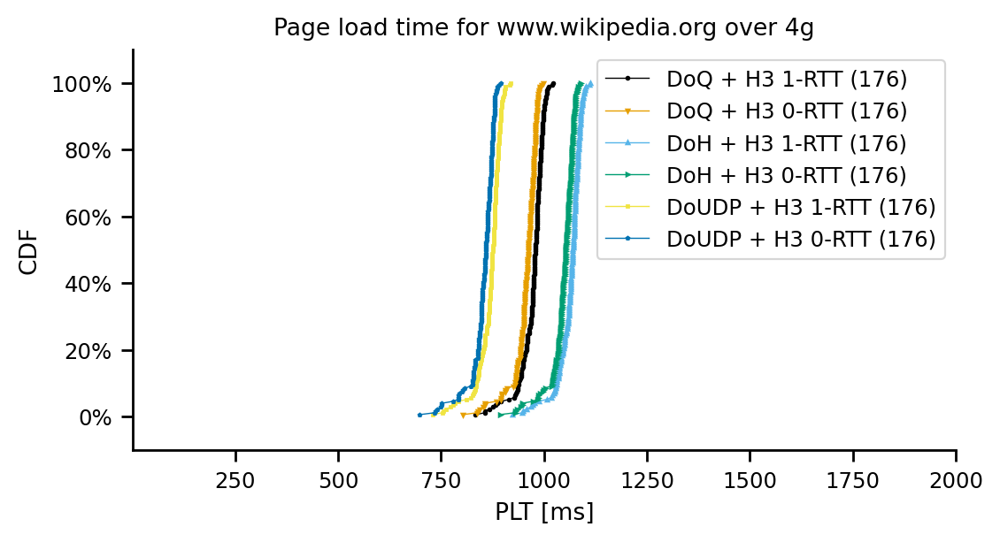

4g-medium


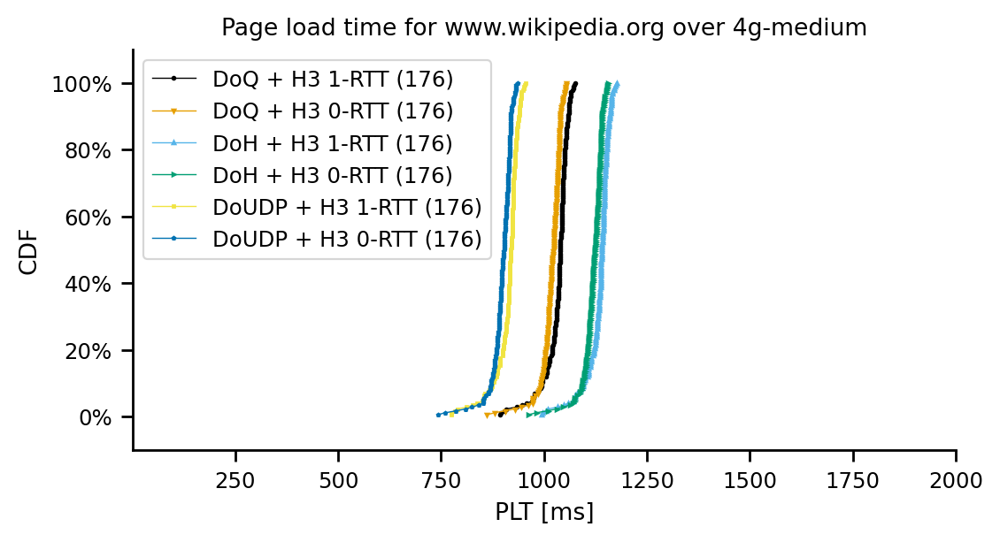

In [854]:
for access_technology in ['fiber', 'cable', 'dsl', '4g', '4g-medium']:
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_plt', 'experiment_description', 'website']].copy()
    for website in ['www.wikipedia.org']:
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=False
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_plt']) == 0:
                    continue
                #print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_plt'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('Page load time for '+website+' over '+access_technology)

        ax.set_xlabel('PLT [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(1,2000)


        ax.legend()

        #if log:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
        #else:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
        plt.show()

fiber


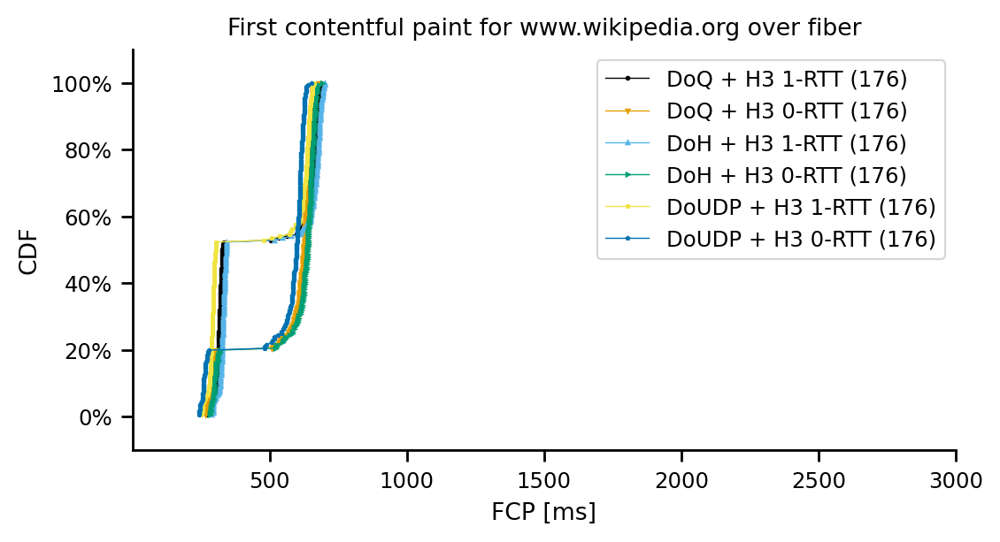

cable


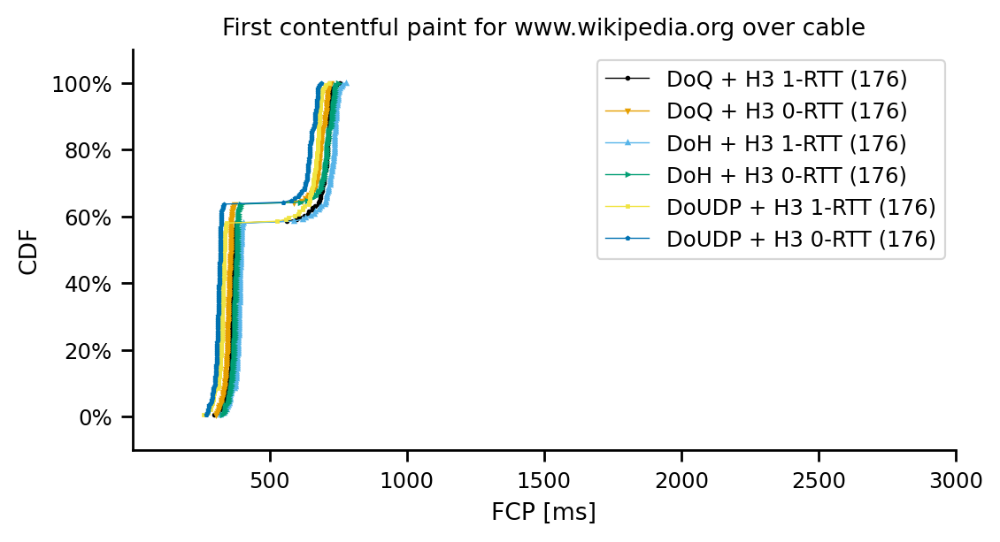

dsl


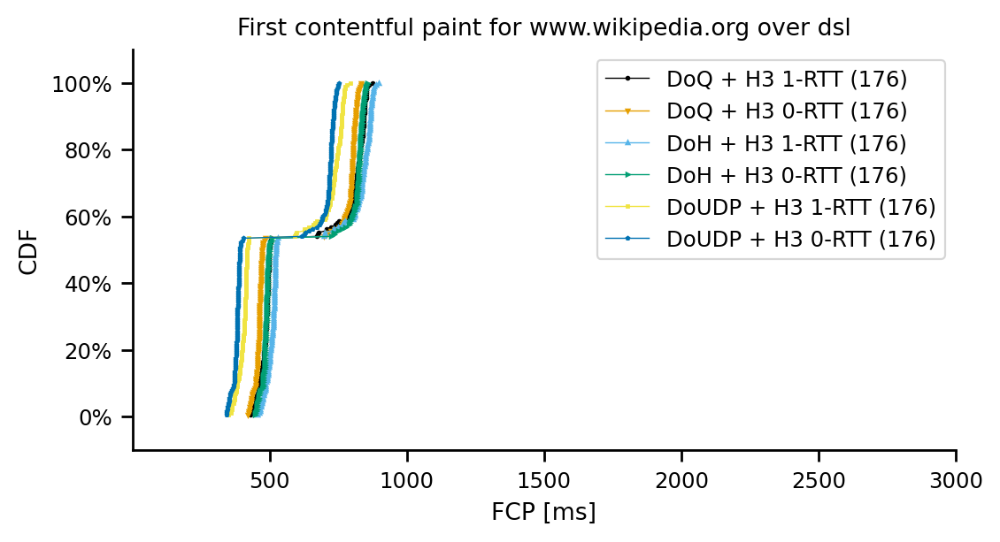

4g


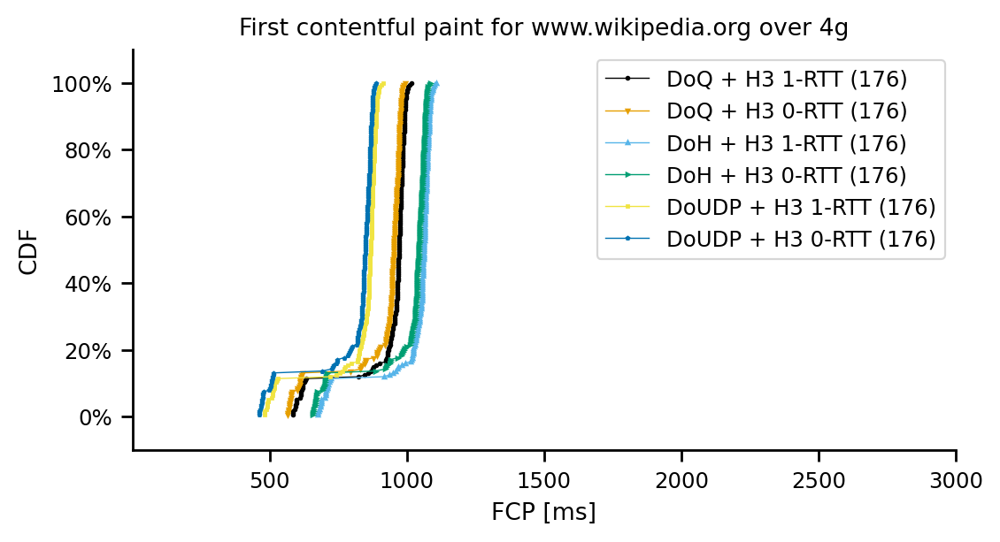

4g-medium


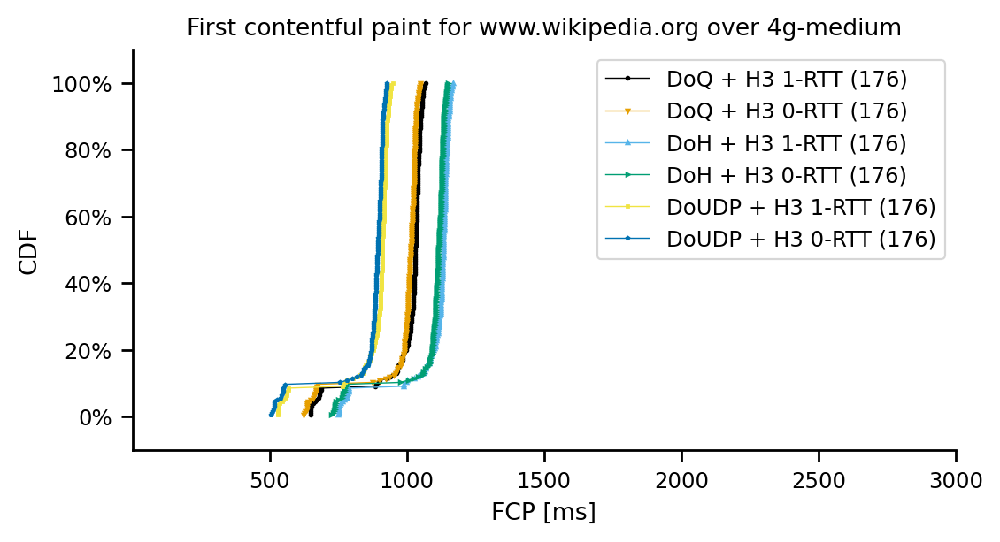

In [855]:
for access_technology in ['fiber', 'cable', 'dsl', '4g', '4g-medium']:
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_fcp', 'experiment_description', 'website']].copy()
    for website in ['www.wikipedia.org']:
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=False
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_fcp']) == 0:
                    continue
                #print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_fcp'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('First contentful paint for '+website+' over '+access_technology)

        ax.set_xlabel('FCP [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(1,3000)


        ax.legend()

        #if log:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
        #else:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
        plt.show()

In [856]:
df_dns_and_h3.dtypes

msm_id                         object
connectEnd                    float64
connectStart                  float64
domComplete                   float64
domContentLoadedEventEnd      float64
domContentLoadedEventStart    float64
domInteractive                float64
domainLookupEnd               float64
domainLookupStart             float64
duration                      float64
encodedBodySize                 int64
decodedBodySize                 int64
transferSize                    int64
fetchStart                    float64
loadEventEnd                  float64
loadEventStart                float64
requestStart                  float64
responseEnd                   float64
responseStart                 float64
secureConnectionStart         float64
startTime                     float64
firstPaint                    float64
firstContentfulPaint          float64
nextHopProtocol                object
redirectStart                 float64
redirectEnd                   float64
redirectCoun

<AxesSubplot:xlabel='timestamp'>

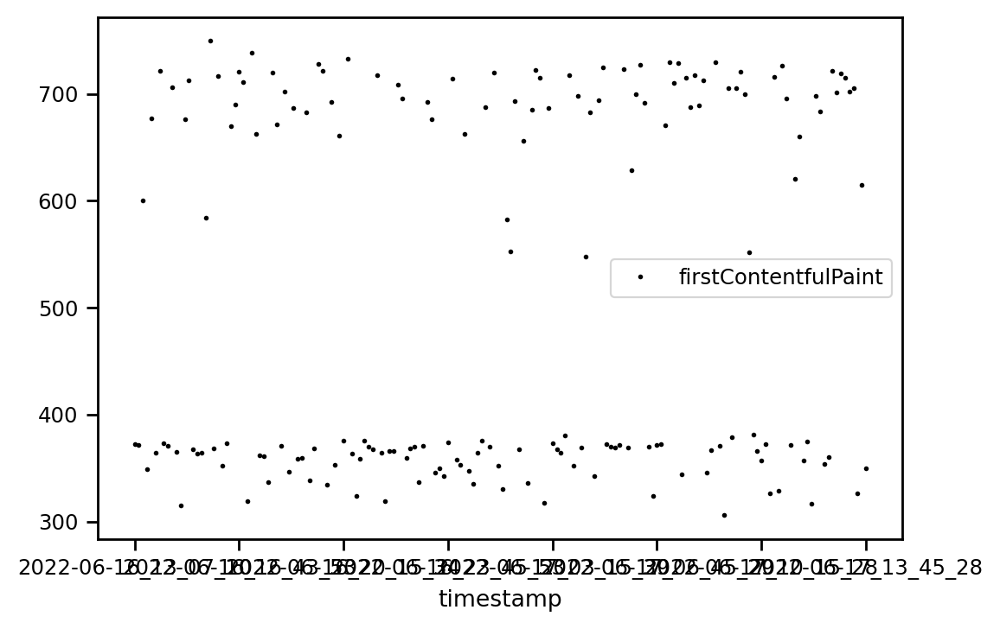

In [857]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstContentfulPaint', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

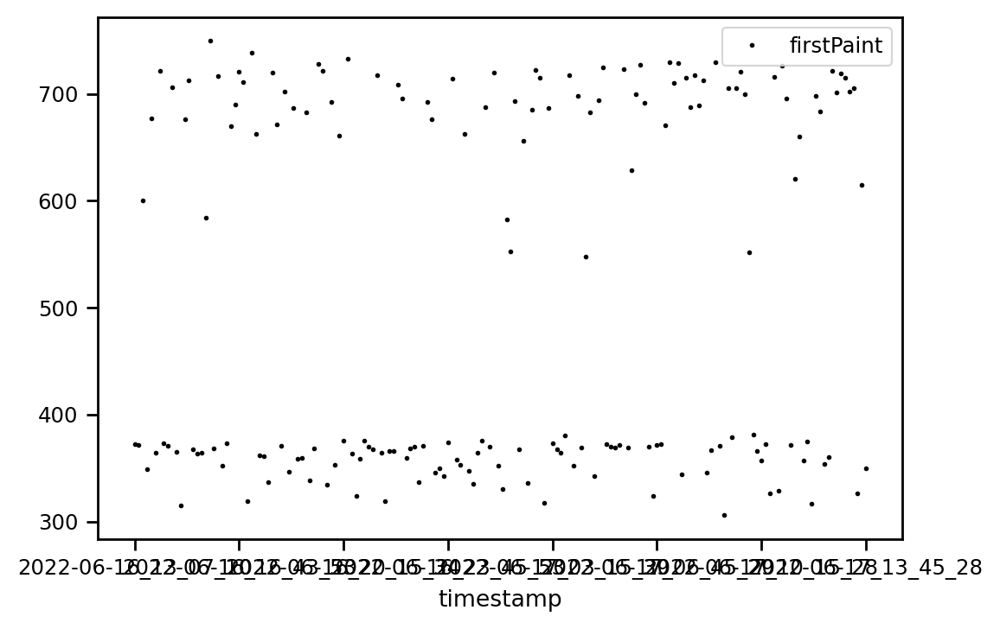

In [858]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstPaint', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

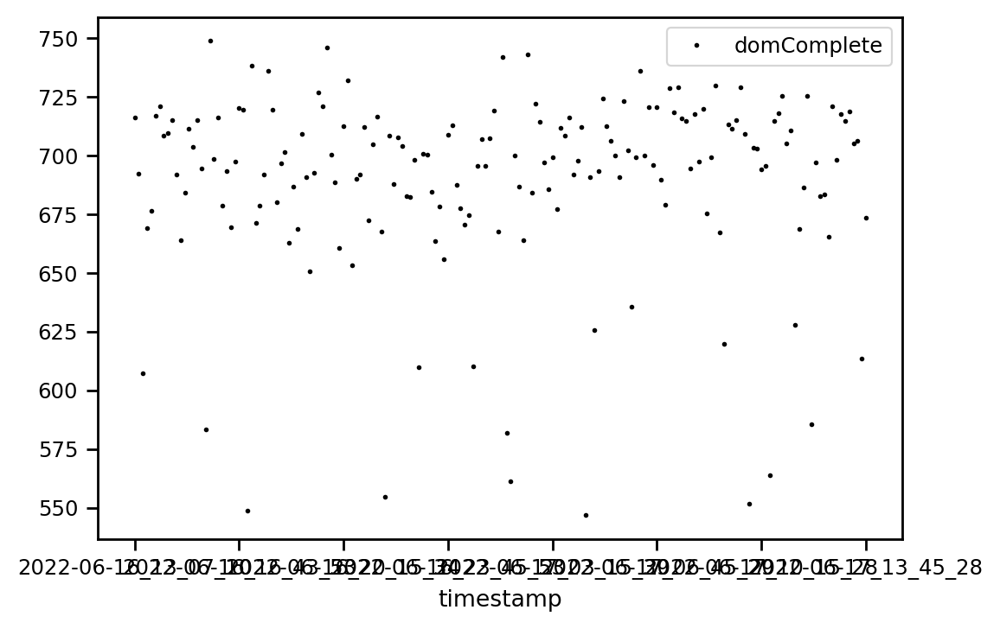

In [859]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='domComplete', linewidth=0, markersize=2, color='C0', marker=".")

fiber


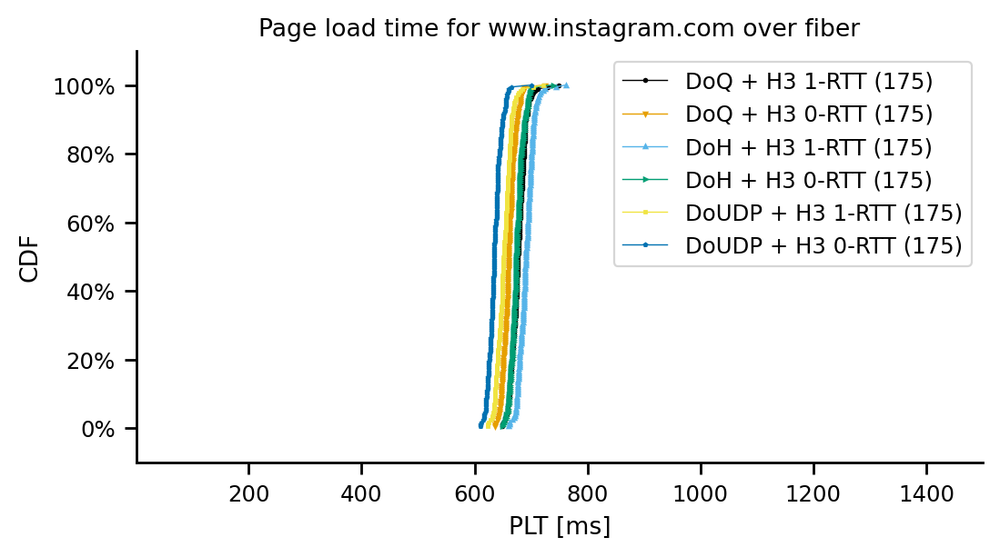

cable


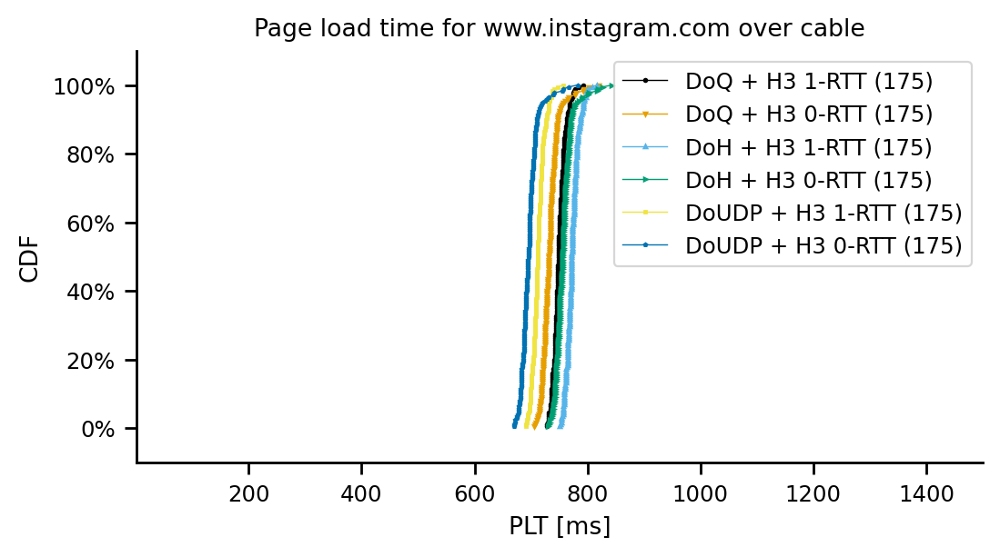

dsl


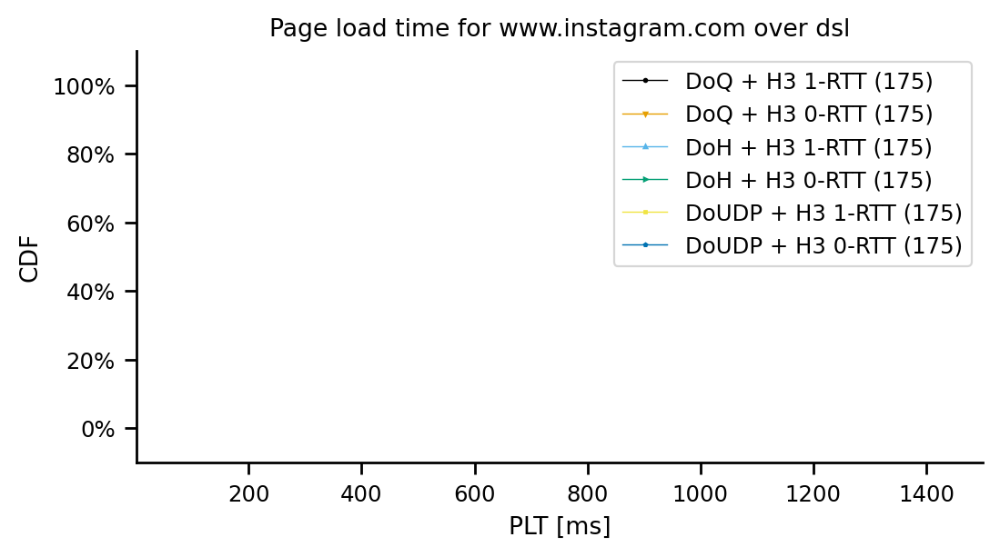

4g


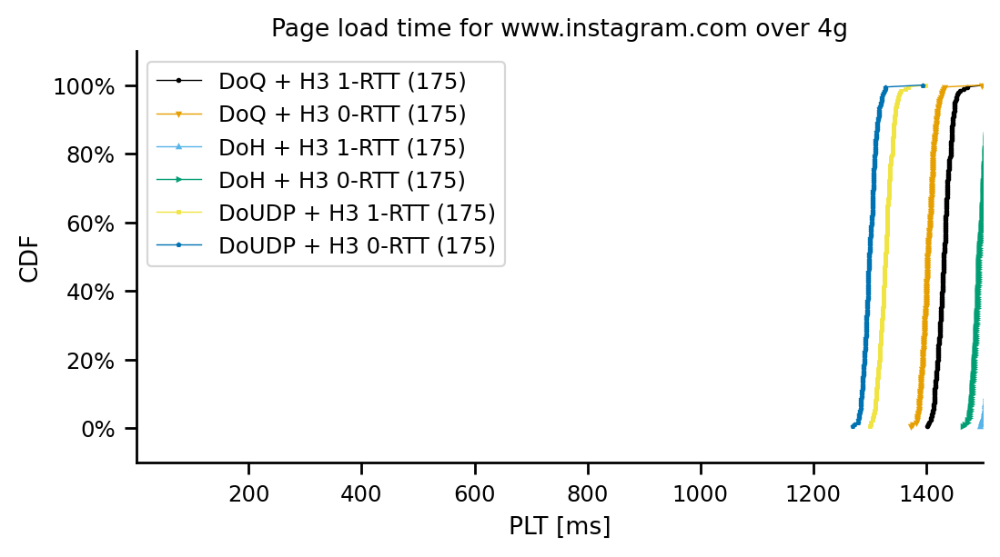

4g-medium


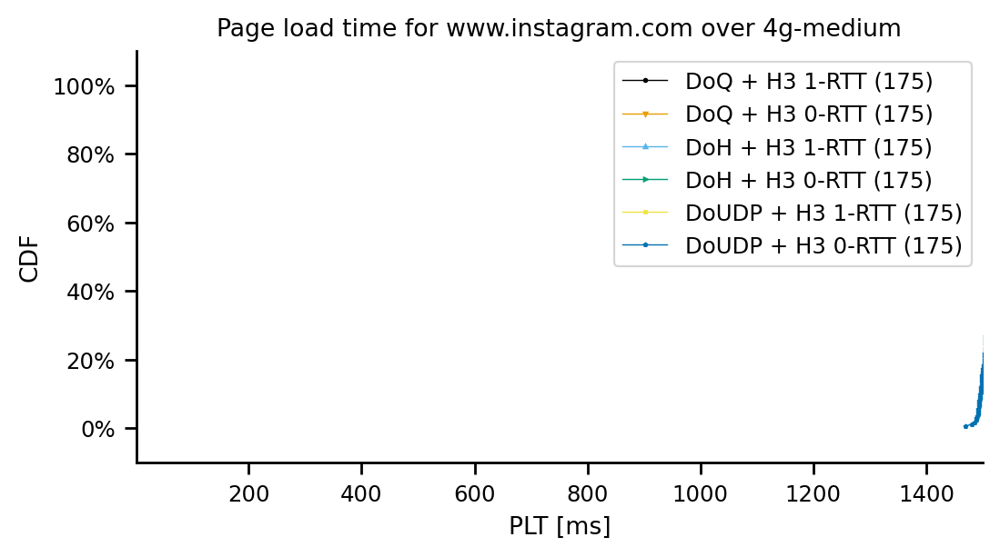

In [860]:
for access_technology in ['fiber', 'cable', 'dsl', '4g', '4g-medium']:
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_plt', 'experiment_description', 'website']].copy()
    for website in ['www.instagram.com']:
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=False
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_plt']) == 0:
                    continue
                #print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_plt'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('Page load time for '+website+' over '+access_technology)

        ax.set_xlabel('PLT [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(1,1500)


        ax.legend()

        #if log:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
        #else:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
        plt.show()

In [861]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT')].full_plt.describe(percentiles=[0.5, 0.6, 0.65])

count    176.000000
mean     801.017163
std       21.523375
min      698.806290
50%      805.220845
60%      808.683127
65%      810.379283
max      840.630927
Name: full_plt, dtype: float64

In [862]:
df_dns_and_h3.timestamp

0        2022-06-16_13_04_31
1        2022-06-16_13_04_31
2        2022-06-16_13_04_31
3        2022-06-16_13_04_31
4        2022-06-16_13_04_31
                ...         
15817    2022-06-17_13_47_44
15818    2022-06-17_13_47_44
15819    2022-06-17_13_47_44
15820    2022-06-17_13_47_44
15821    2022-06-17_13_47_44
Name: timestamp, Length: 15822, dtype: object

In [863]:
df_dns_and_h3.timestamp = pd.to_datetime(df_dns_and_h3.timestamp, format="%Y-%m-%d_%H_%M_%S")

In [864]:
#print(df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt < 250)].loadEventStart.describe())
#print(df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt < 250)].elapsed.describe())
#df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt < 250)].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

In [865]:
#print(df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt >= 250)].loadEventStart.describe())
#print(df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt >= 250)].elapsed.describe())
#df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt >= 250)].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

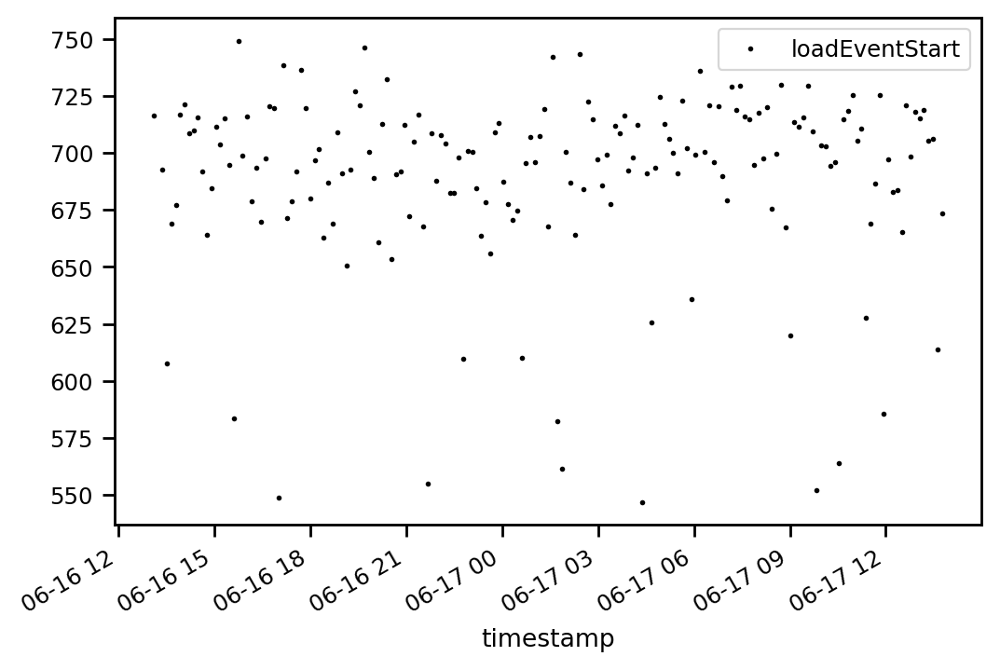

In [866]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

In [867]:
dsl_msms=['ea7f2f67-49aa-4b24-bbdb-2f579e93ae2d',
          '0db34220-adc4-47ca-98ef-b477b4546c70',
          '1a594a4d-7229-4b33-996a-86ac8ee8e87f',
          'a5bdf51b-6cf3-4b39-af48-7b3588b8fa32',
          '72f14b6a-778c-4aaa-ae6b-081b55eb1a3e',
          'd5c12acb-6c08-4aed-a30d-fe5177353e9a']
dsl_msms = ['40226da6-4e2e-41da-be00-ea3d8568b8ac',
           '0996f426-0b60-40bc-844b-59642efb5e88', 
           '834c4ab5-fffe-438b-9eba-ec294fca29e1']
df_dns_and_h3[(df_dns_and_h3.msm_id.isin(dsl_msms)) & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT')][['msm_id', 'loadEventStart']]

,msm_id,loadEventStart


<AxesSubplot:xlabel='timestamp'>

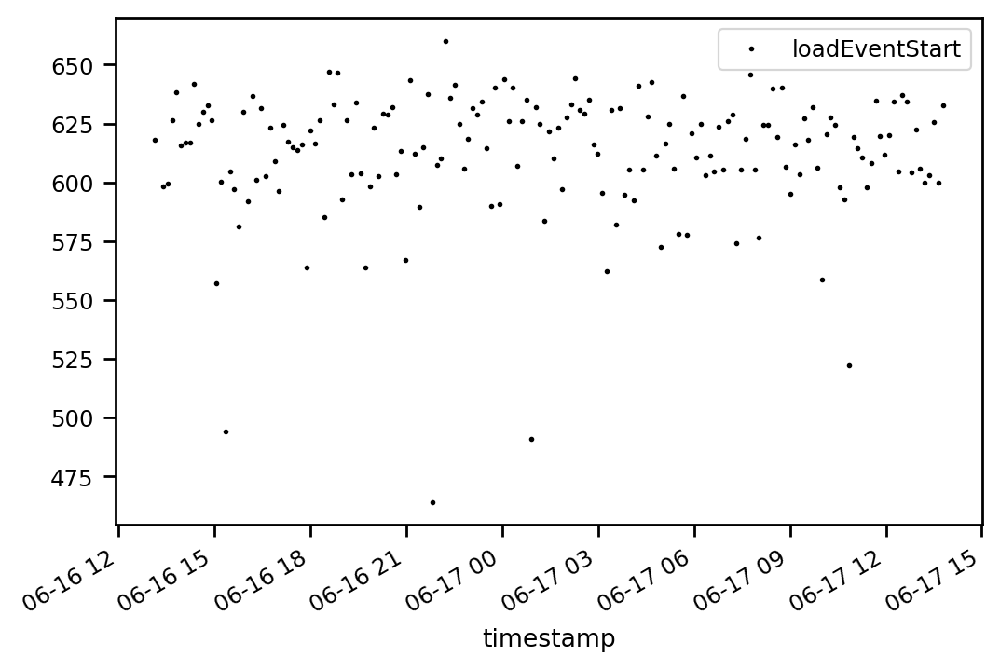

In [868]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'fiber') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

In [869]:
fiber_msms=['097f5c5a-70d2-4d49-9403-a8bcce09aac9', 
           '91f26e10-53cc-4c85-8e4c-401f37fbcb5b',
           '11893d09-c545-48eb-84cd-69336faf5ea1',
           '25cab733-fee7-4e82-af9c-8993f827f499',
           '6f4abddc-4822-4cfe-8019-ad1058cb8177',
           '52ad18c8-2f93-45fc-b6e0-ea6c6a589478']
fiber_msms=['80ffb3af-c2c9-4567-ba4a-7bcca408dff4',
           'b6131e76-734f-4ded-b907-006d00d19e6b',
           '8831ce97-936c-46b7-94bb-0199d9a53f00',
           '9e1ed825-d333-4bd9-9053-584d7079c31a']
df_dns_and_h3[(df_dns_and_h3.msm_id.isin(fiber_msms)) & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT')][['msm_id', 'loadEventStart']]

,msm_id,loadEventStart


<AxesSubplot:xlabel='timestamp'>

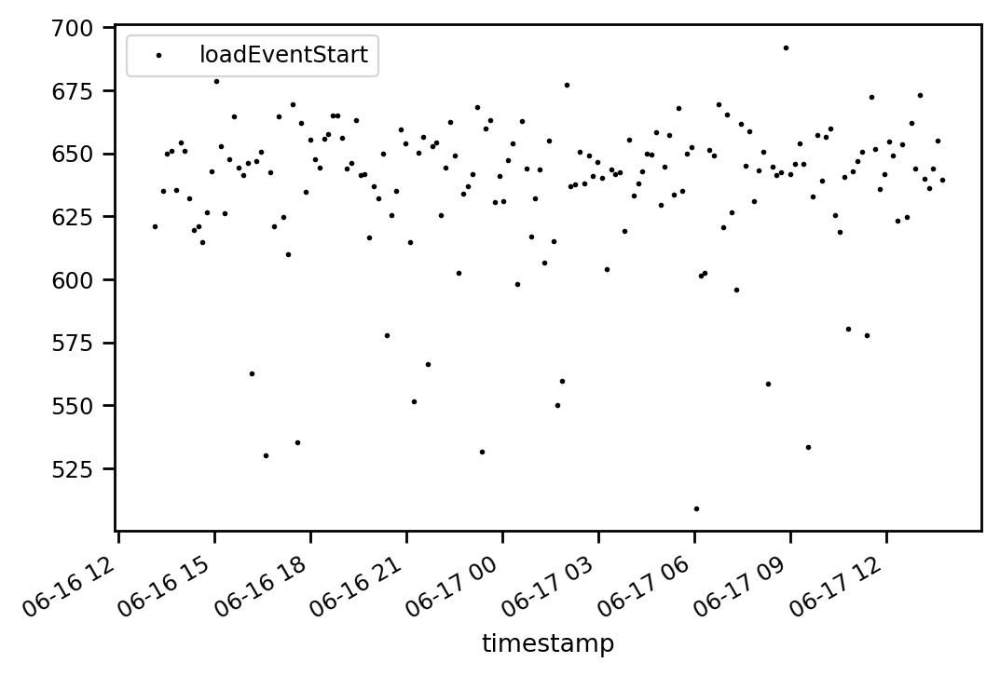

In [870]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'cable') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

In [871]:
cable_msms=['25043c95-126c-4a50-91f2-3a248f2840a1', 
           '1a674496-67b0-4f9b-953e-8753f95b0dc5',
           '39485fb3-aba4-4530-9069-c1aa2194c36d',
           'c0d8523a-aa0a-4df5-9889-5aa0c4db4b40',
           '37b9ac16-7359-4fa5-9e15-22a7bd8fa85a',
           '7e3fafbf-e74b-4365-9de0-553a276057ce']
df_dns_and_h3[(df_dns_and_h3.msm_id.isin(cable_msms)) & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT')][['msm_id', 'loadEventStart']]

,msm_id,loadEventStart


<AxesSubplot:xlabel='timestamp'>

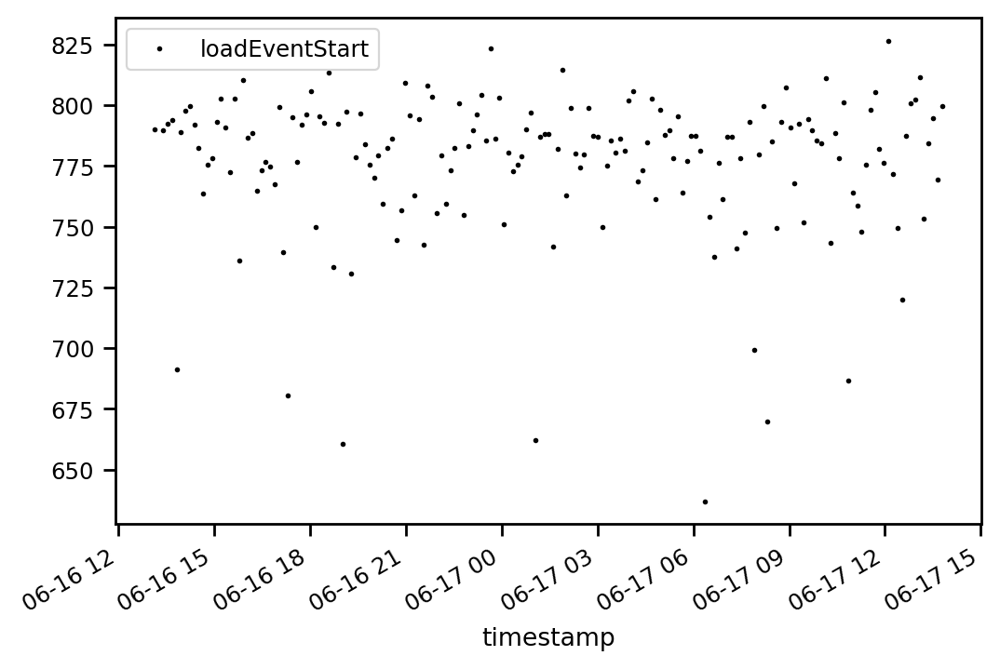

In [872]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == '4g') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

In [873]:
lte_msms=['76f85d7f-927c-47fd-a72a-f2f9bb36e393', 
           '494500df-6fa3-4ec1-8d0e-d86479dbfcc2',
           'd66574f5-2ef4-479c-9a53-d1e520c40e3b',
           '6462d64e-715f-41f8-8bf1-cbaae877b8ee',
           'c628eb84-a78a-401e-b29b-08f358592902',
           'cb5fe4a3-1fe7-4443-aa45-b598ba2ba0e3']
df_dns_and_h3[(df_dns_and_h3.msm_id.isin(lte_msms)) & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT')][['msm_id', 'loadEventStart']]

,msm_id,loadEventStart


<AxesSubplot:xlabel='timestamp'>

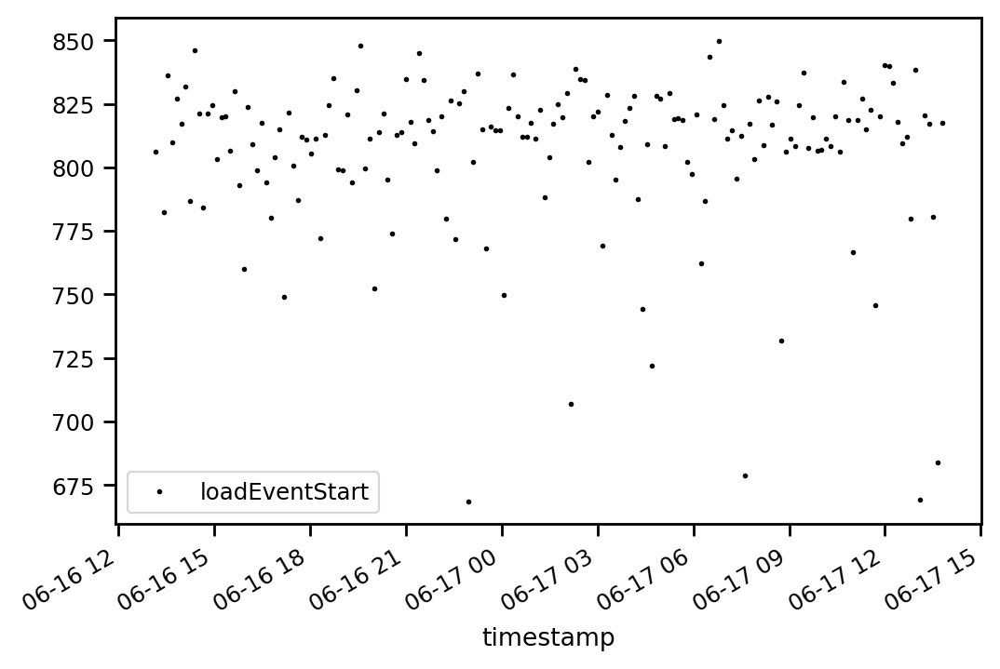

In [874]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == '4g-medium') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

dsl
count    177.000000
mean     338.027315
std        4.960602
min      320.647864
10%      332.370871
20%      335.531651
25%      336.407298
30%      336.708233
40%      337.567976
50%      338.657049
60%      339.460291
70%      340.472554
75%      340.683475
80%      341.310233
90%      343.649238
100%     349.176176
max      349.176176
Name: full_fcp, dtype: float64
count    177.000000
mean     313.654433
std        3.526936
min      304.219302
10%      309.339841
20%      310.907581
25%      311.408594
30%      311.784009
40%      312.580660
50%      313.447982
60%      314.374338
70%      315.706701
75%      316.056878
80%      316.834729
90%      318.179470
100%     322.967450
max      322.967450
Name: full_fcp, dtype: float64
count    177.000000
mean     362.177638
std        4.946460
min      344.685499
10%      356.939659
20%      359.697349
25%      360.442375
30%      360.947696
40%      361.927130
50%      362.862012
60%      363.531820
70%      364.574997
75%      365.0

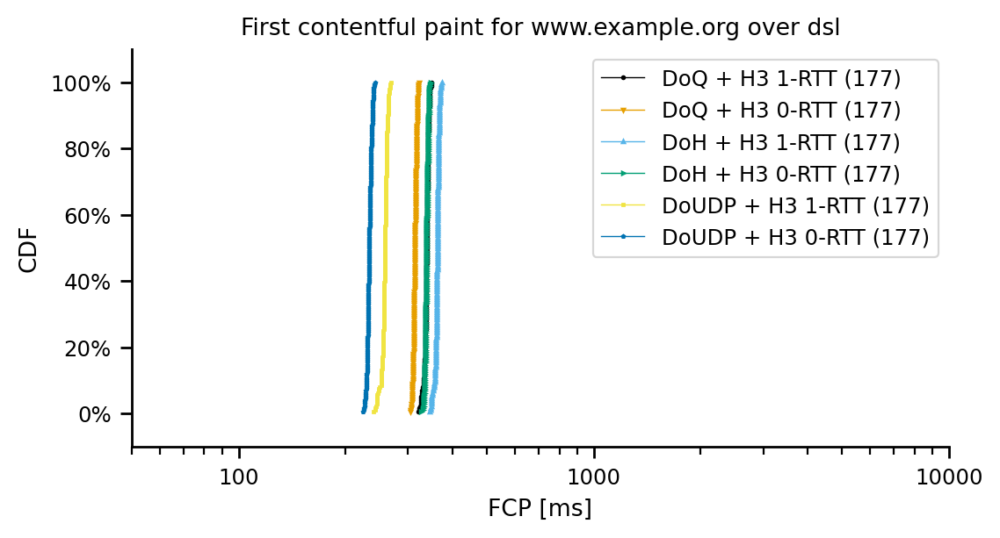

count    176.000000
mean     636.599549
std      169.788070
min      430.553680
10%      464.846349
20%      482.288414
25%      486.227132
30%      489.657731
40%      494.583127
50%      499.250064
60%      786.415425
70%      813.932421
75%      822.256152
80%      829.848447
90%      844.209647
100%     875.004150
max      875.004150
Name: full_fcp, dtype: float64
count    176.000000
mean     616.268868
std      170.556345
min      419.287179
10%      450.603131
20%      458.441271
25%      461.648414
30%      463.270662
40%      467.790914
50%      473.682254
60%      776.134437
70%      798.246235
75%      801.607345
80%      804.676553
90%      813.269280
100%     832.135059
max      832.135059
Name: full_fcp, dtype: float64
count    176.000000
mean     660.693372
std      169.730071
min      454.400785
10%      488.817798
20%      505.477544
25%      511.704719
30%      514.143010
40%      519.337595
50%      523.876033
60%      809.493404
70%      837.982089
75%      846.54350

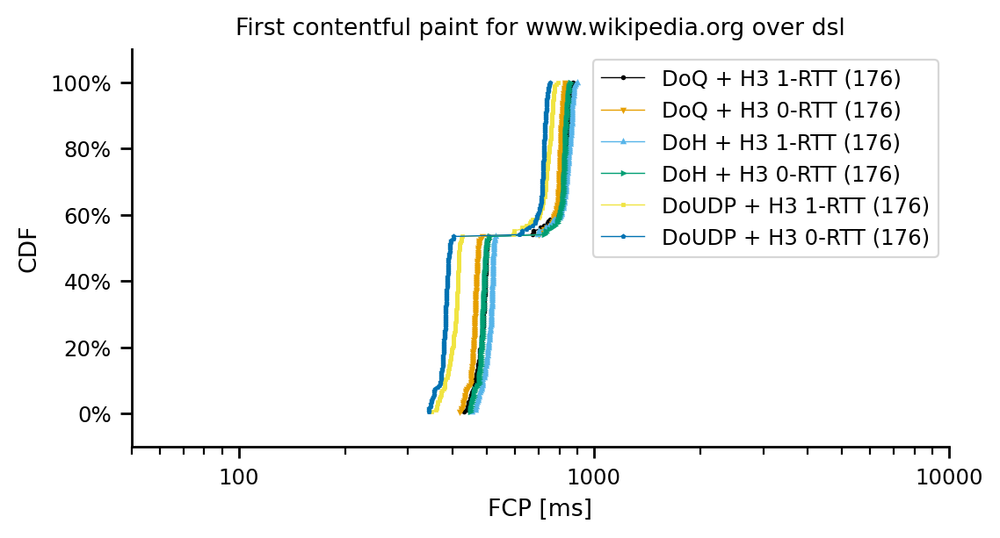

count    175.000000
mean     344.365118
std        6.470238
min      329.270260
10%      336.385776
20%      338.466226
25%      339.327810
30%      340.095039
40%      342.305173
50%      344.267185
60%      345.737629
70%      347.558669
75%      348.623229
80%      349.882756
90%      353.637615
100%     361.432701
max      361.432701
Name: full_fcp, dtype: float64
count    175.000000
mean     317.423975
std        6.429257
min      305.900788
10%      308.789914
20%      311.631324
25%      312.797687
30%      313.173117
40%      314.784742
50%      317.428271
60%      318.654516
70%      321.086433
75%      323.082092
80%      324.260064
90%      326.831029
100%     331.629220
max      331.629220
Name: full_fcp, dtype: float64
count    175.000000
mean     368.487993
std        6.483263
min      353.734792
10%      360.545623
20%      362.688090
25%      363.313167
30%      364.320120
40%      366.537648
50%      368.540345
60%      370.037414
70%      371.704949
75%      372.80459

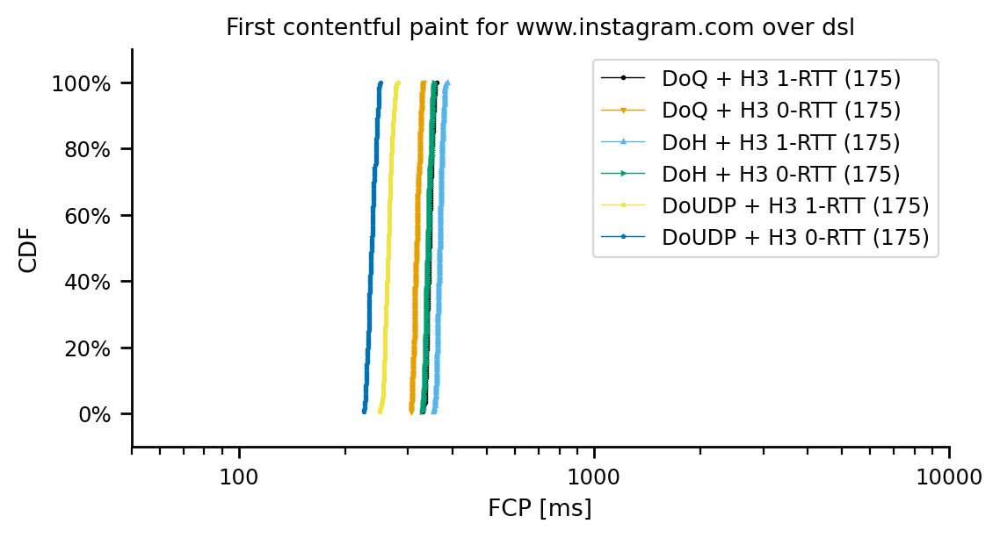

cable
count    177.000000
mean     213.270773
std        3.292221
min      204.148421
10%      208.850237
20%      210.625318
25%      211.117262
30%      211.864524
40%      212.617816
50%      213.349153
60%      214.283917
70%      214.988878
75%      215.360611
80%      215.791778
90%      217.348351
100%     221.378251
max      221.378251
Name: full_fcp, dtype: float64
count    177.000000
mean     200.487722
std        3.506023
min      190.271424
10%      196.638546
20%      197.589988
25%      198.045651
30%      198.582692
40%      199.446733
50%      200.109452
60%      201.019402
70%      202.212526
75%      202.751626
80%      203.151746
90%      204.990607
100%     211.596261
max      211.596261
Name: full_fcp, dtype: float64
count    177.000000
mean     236.806011
std        3.257028
min      228.254280
10%      232.569219
20%      234.012924
25%      234.537236
30%      235.310368
40%      236.113049
50%      236.969707
60%      237.642624
70%      238.510679
75%      239

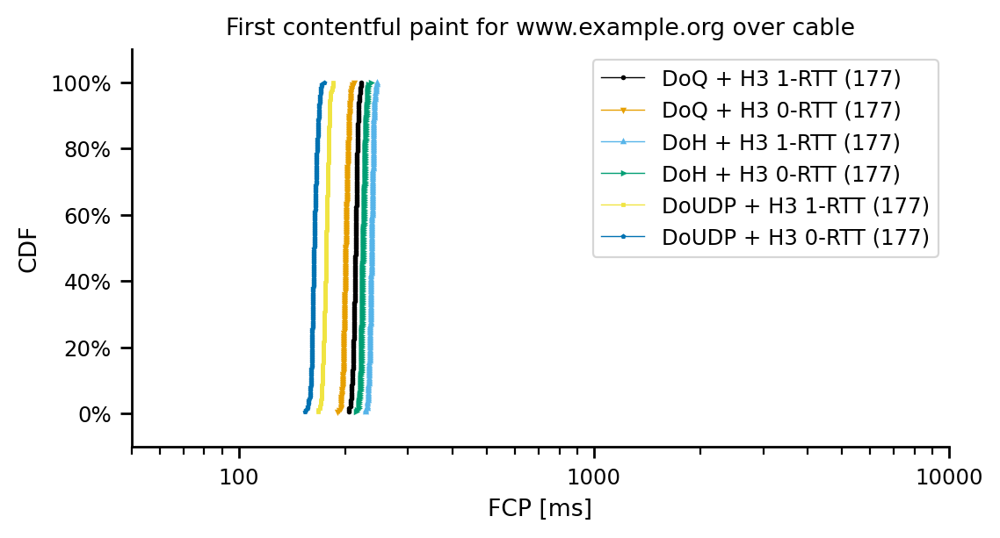

count    176.000000
mean     503.169466
std      170.125440
min      296.970038
10%      352.391026
20%      361.702335
25%      363.566090
30%      364.128977
40%      368.564404
50%      372.150209
60%      626.790559
70%      696.624755
75%      706.053242
80%      711.137699
90%      718.798873
100%     755.024952
max      755.024952
Name: full_fcp, dtype: float64
count    176.000000
mean     470.429125
std      164.019258
min      304.909295
10%      337.216339
20%      345.399083
25%      347.453364
30%      348.707897
40%      353.054485
50%      357.851116
60%      362.107143
70%      668.782082
75%      678.164451
80%      683.993006
90%      703.085654
100%     724.088454
max      724.088454
Name: full_fcp, dtype: float64
count    176.000000
mean     526.589483
std      170.310604
min      321.612899
10%      376.127992
20%      384.766439
25%      387.040628
30%      387.696699
40%      391.843616
50%      395.772053
60%      650.669600
70%      719.508233
75%      729.61128

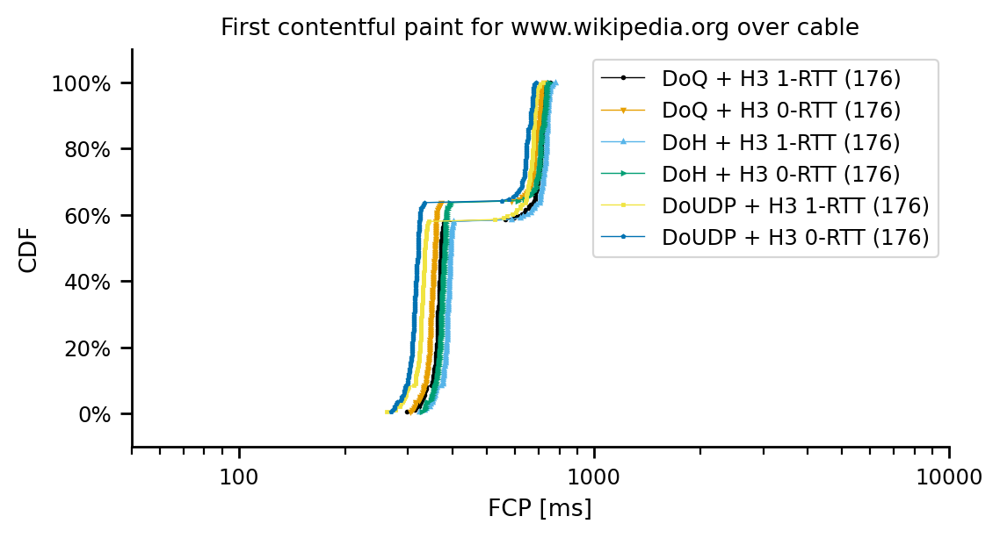

count    175.000000
mean     220.500704
std        5.758580
min      204.251742
10%      213.106215
20%      215.896412
25%      216.680600
30%      217.441819
40%      218.997550
50%      220.922864
60%      221.872557
70%      223.471060
75%      224.418304
80%      225.481223
90%      228.073195
100%     236.531821
max      236.531821
Name: full_fcp, dtype: float64
count    175.000000
mean     203.704704
std        5.842432
min      191.454691
10%      196.145594
20%      198.385725
25%      199.044154
30%      199.642884
40%      201.580161
50%      204.010127
60%      205.452304
70%      206.916060
75%      207.837474
80%      209.226127
90%      212.067445
100%     217.672156
max      217.672156
Name: full_fcp, dtype: float64
count    175.000000
mean     244.120747
std        5.651712
min      229.705411
10%      236.675525
20%      239.411506
25%      240.292943
30%      241.523867
40%      242.707504
50%      244.067299
60%      245.422585
70%      247.167886
75%      247.79578

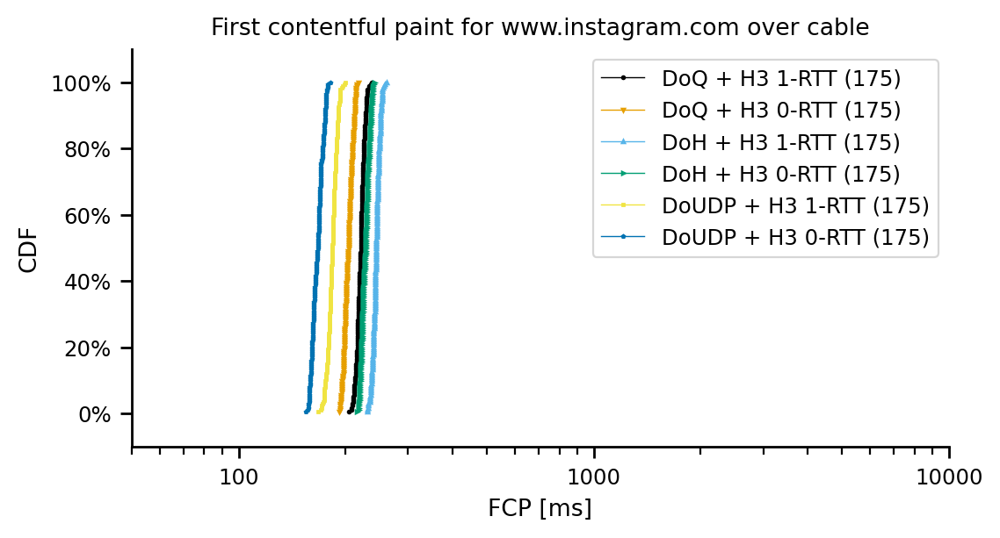

fiber
count    176.000000
mean     168.142487
std        3.607716
min      157.874717
10%      163.558583
20%      165.224550
25%      165.662750
30%      166.119796
40%      167.010642
50%      168.094525
60%      169.491516
70%      170.407712
75%      170.764008
80%      171.391748
90%      172.914200
100%     175.865778
max      175.865778
Name: full_fcp, dtype: float64
count    176.000000
mean     157.906692
std        3.688238
min      148.024344
10%      153.224243
20%      154.806309
25%      155.760396
30%      156.116756
40%      157.019371
50%      158.112970
60%      159.076201
70%      160.435163
75%      160.771998
80%      161.091748
90%      162.494557
100%     165.610756
max      165.610756
Name: full_fcp, dtype: float64
count    176.000000
mean     182.025820
std        3.390528
min      172.441354
10%      177.465858
20%      179.381816
25%      179.675952
30%      180.030127
40%      181.036235
50%      182.188712
60%      183.127908
70%      183.984566
75%      184

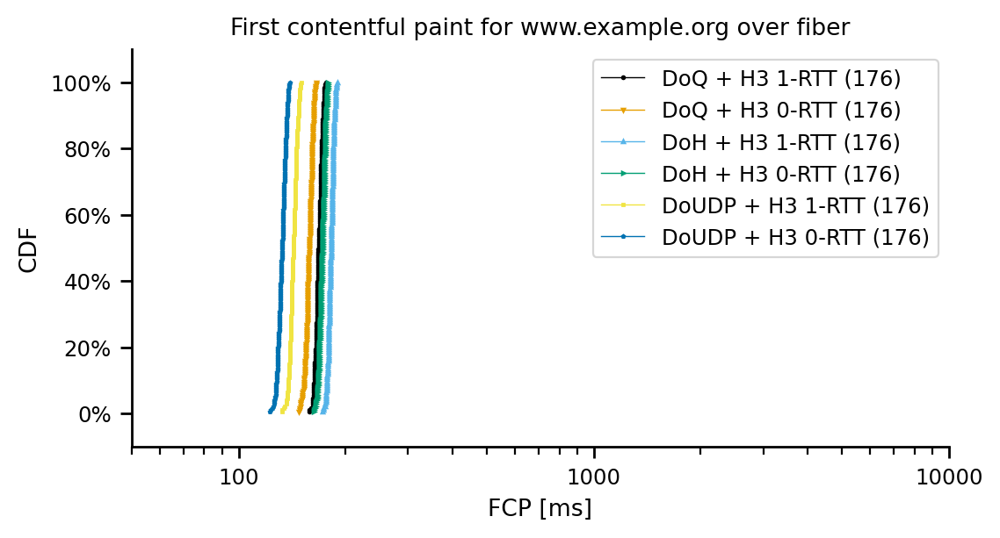

count    176.000000
mean     475.438963
std      171.831017
min      272.098234
10%      306.968412
20%      313.300052
25%      315.034310
30%      317.693176
40%      322.882396
50%      329.195351
60%      638.159455
70%      654.725763
75%      660.194609
80%      662.668716
90%      671.031470
100%     688.904056
max      688.904056
Name: full_fcp, dtype: float64
count    176.000000
mean     555.840667
std      137.986085
min      264.658396
10%      285.232820
20%      508.156025
25%      567.975703
30%      593.100535
40%      610.654023
50%      624.206785
60%      631.199333
70%      636.409358
75%      639.037645
80%      642.257303
90%      649.684706
100%     679.400325
max      679.400325
Name: full_fcp, dtype: float64
count    176.000000
mean     489.335564
std      171.677383
min      288.425791
10%      321.225089
20%      327.055308
25%      329.972139
30%      331.702084
40%      336.424453
50%      343.373132
60%      650.894416
70%      668.336041
75%      674.01815

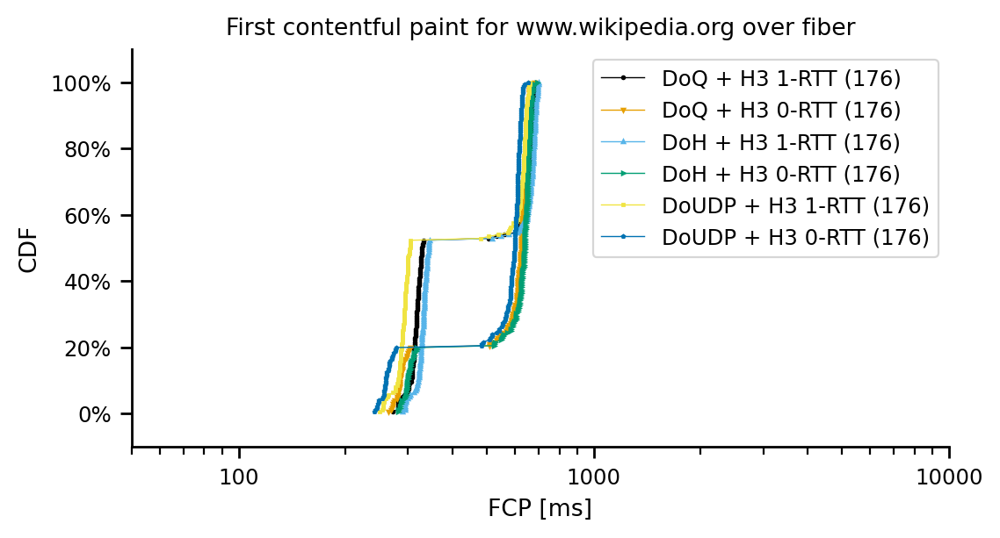

count    175.000000
mean     173.578143
std        6.883218
min      155.430190
10%      165.347687
20%      167.315472
25%      168.681005
30%      169.366417
40%      171.184090
50%      172.637796
60%      174.631059
70%      176.673408
75%      178.721386
80%      180.979030
90%      183.506231
100%     193.201250
max      193.201250
Name: full_fcp, dtype: float64
count    175.000000
mean     153.344429
std        2.530060
min      144.348571
10%      150.344640
20%      151.343084
25%      151.754480
30%      152.170451
40%      152.989223
50%      153.598249
60%      153.944033
70%      154.564764
75%      154.957627
80%      155.195690
90%      156.351669
100%     160.310676
max      160.310676
Name: full_fcp, dtype: float64
count    175.000000
mean     187.516790
std        6.935050
min      168.564757
10%      179.121550
20%      181.662579
25%      182.509190
30%      183.677543
40%      185.007625
50%      186.326982
60%      188.337175
70%      191.144880
75%      192.71223

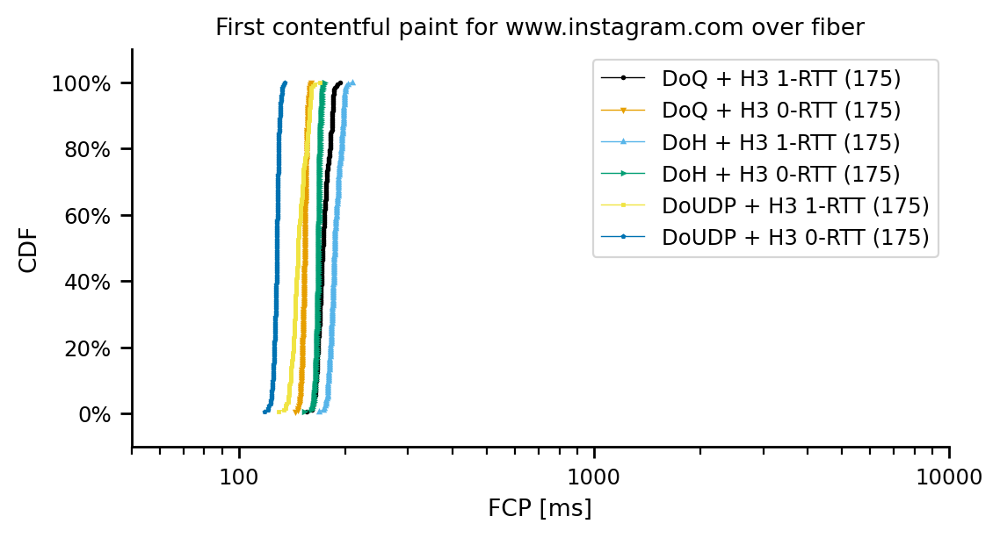

4g
count    176.000000
mean     479.867242
std        3.437910
min      468.368516
10%      475.534279
20%      476.624279
25%      477.677198
30%      478.048899
40%      479.011653
50%      480.013922
60%      480.565613
70%      481.898924
75%      482.367666
80%      483.015223
90%      484.165706
100%     490.170403
max      490.170403
Name: full_fcp, dtype: float64
count    176.000000
mean     466.830311
std        3.270383
min      458.076242
10%      462.788860
20%      464.328742
25%      464.713938
30%      465.032359
40%      466.045857
50%      466.730827
60%      467.743791
70%      468.582475
75%      468.976287
80%      469.540808
90%      471.019008
100%     474.890043
max      474.890043
Name: full_fcp, dtype: float64
count    176.000000
mean     570.799384
std        3.306977
min      561.340754
10%      566.575250
20%      567.604341
25%      568.672736
30%      568.952318
40%      569.812539
50%      570.746047
60%      572.010122
70%      573.004321
75%      573.34

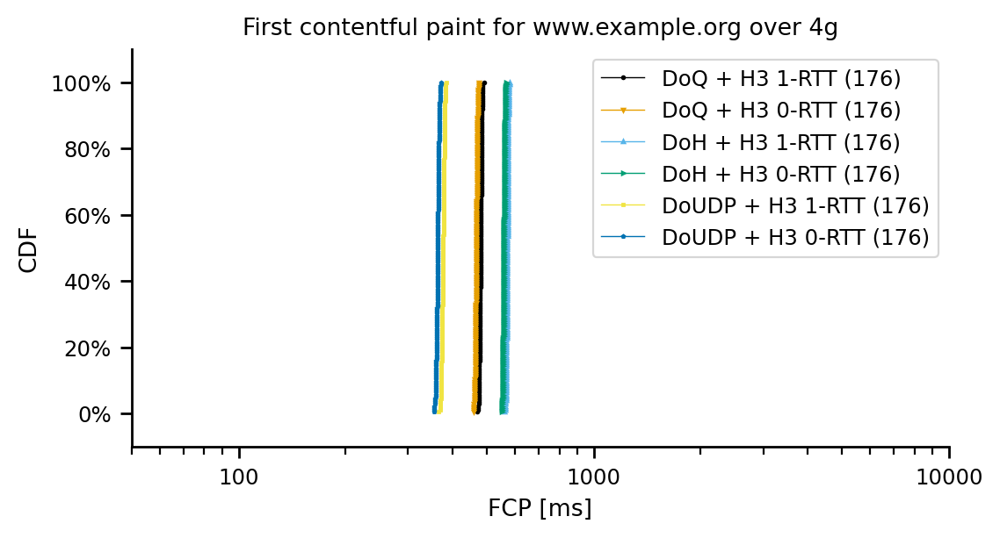

count     176.000000
mean      926.668263
std       118.102073
min       583.956938
10%       628.055653
20%       932.756440
25%       946.637815
30%       956.778027
40%       966.710592
50%       971.007666
60%       975.986794
70%       980.882042
75%       983.467074
80%       985.499196
90%       991.031674
100%     1016.246065
max      1016.246065
Name: full_fcp, dtype: float64
count    176.000000
mean     902.417695
std      125.539111
min      566.024940
10%      610.502516
20%      899.465186
25%      928.355051
30%      938.807757
40%      946.022799
50%      952.469498
60%      958.756383
70%      965.417935
75%      968.288501
80%      970.548823
90%      975.523883
100%     993.723739
max      993.723739
Name: full_fcp, dtype: float64
count     176.000000
mean     1017.506083
std       118.093843
min       675.337528
10%       718.588459
20%      1023.996028
25%      1037.811088
30%      1048.234462
40%      1057.019071
50%      1062.264087
60%      1066.879156
70%      1

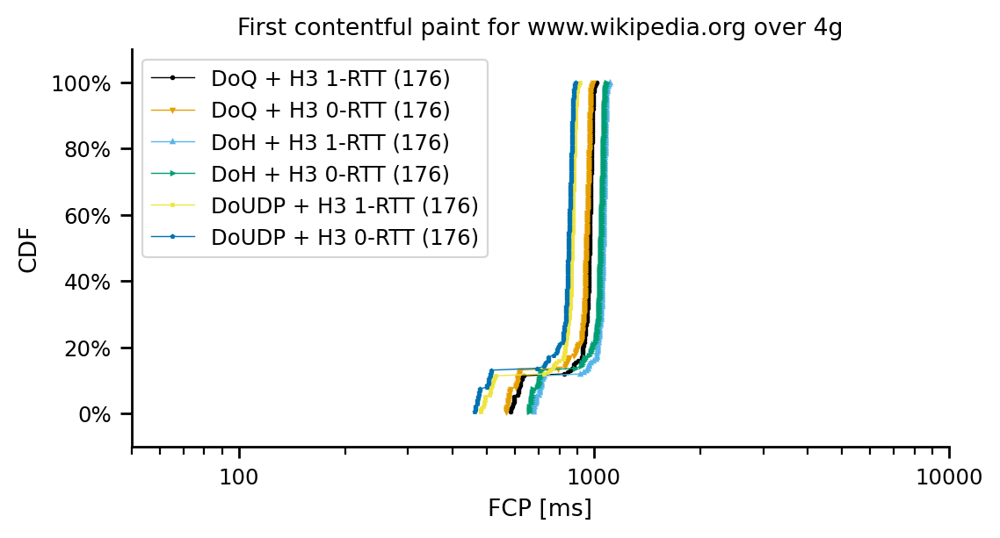

count    175.000000
mean     486.582003
std        6.245784
min      474.668181
10%      479.020621
20%      480.992171
25%      481.555458
30%      482.152713
40%      483.857942
50%      486.067776
60%      487.592580
70%      489.539628
75%      491.214431
80%      492.725454
90%      495.678181
100%     502.590645
max      502.590645
Name: full_fcp, dtype: float64
count    175.000000
mean     470.887146
std        6.440474
min      457.714979
10%      462.853615
20%      465.044487
25%      465.707480
30%      466.957189
40%      468.854559
50%      470.425877
60%      471.511147
70%      474.471679
75%      475.555922
80%      476.721406
90%      480.282728
100%     488.508145
max      488.508145
Name: full_fcp, dtype: float64
count    175.000000
mean     577.401336
std        6.184464
min      566.067246
10%      570.089539
20%      571.868648
25%      572.320943
30%      573.248666
40%      575.031712
50%      577.039086
60%      578.343681
70%      580.398731
75%      581.45099

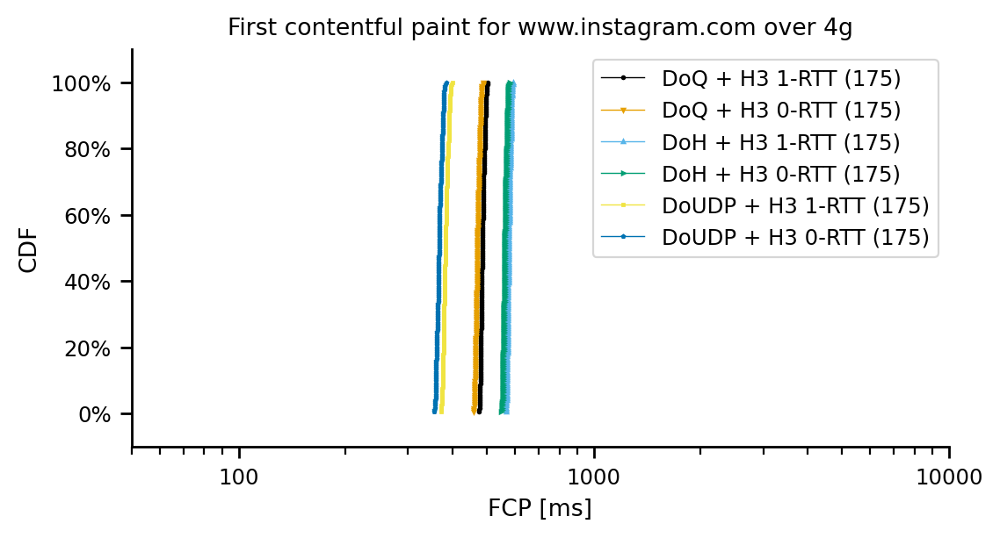

4g-medium
count    176.000000
mean     537.583934
std        3.654100
min      525.292465
10%      532.268878
20%      535.298966
25%      535.873847
30%      536.170736
40%      536.947685
50%      537.641906
60%      538.583281
70%      539.447531
75%      540.009706
80%      540.449476
90%      541.945165
100%     545.821182
max      545.821182
Name: full_fcp, dtype: float64
count    176.000000
mean     524.403821
std        3.382641
min      516.871339
10%      520.187422
20%      521.119424
25%      521.770885
30%      522.326346
40%      523.632990
50%      524.290749
60%      525.393905
70%      525.962230
75%      526.639017
80%      527.357073
90%      529.221945
100%     531.444335
max      531.444335
Name: full_fcp, dtype: float64
count    176.000000
mean     638.750841
std        3.550891
min      625.828282
10%      633.820679
20%      636.427520
25%      636.801133
30%      637.233803
40%      637.823126
50%      639.149486
60%      639.854042
70%      640.576321
75%     

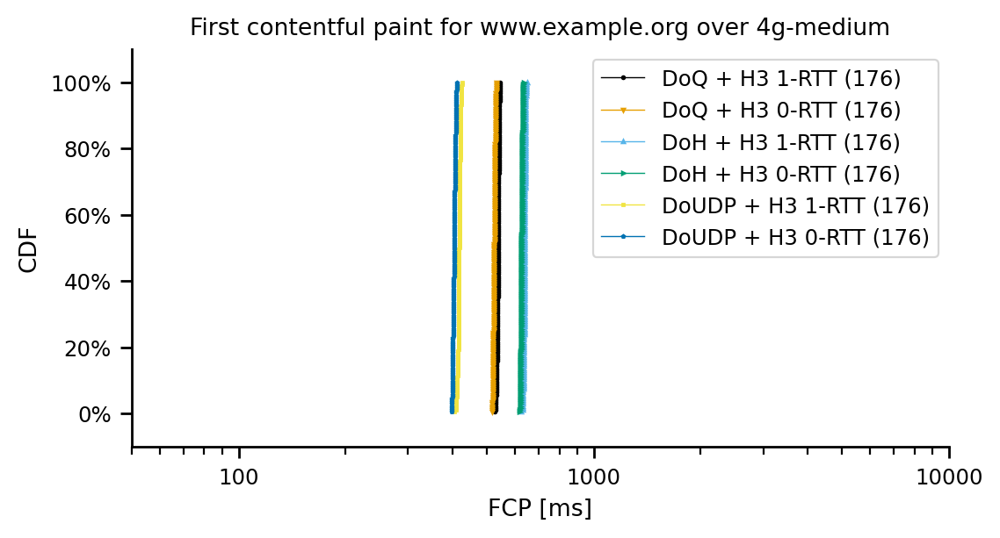

count     176.000000
mean      994.817660
std       105.018381
min       649.797402
10%       898.490946
20%       998.389518
25%      1012.298249
30%      1018.955519
40%      1027.271391
50%      1031.099902
60%      1036.784442
70%      1039.496133
75%      1041.277269
80%      1044.675341
90%      1051.648657
100%     1068.795213
max      1068.795213
Name: full_fcp, dtype: float64
count     176.000000
mean      977.386410
std       109.828501
min       623.897402
10%       887.168203
20%       990.810131
25%       996.804715
30%      1001.758253
40%      1007.975341
50%      1014.137658
60%      1020.449309
70%      1025.435190
75%      1027.086769
80%      1028.571005
90%      1033.111543
100%     1048.229710
max      1048.229710
Name: full_fcp, dtype: float64
count     176.000000
mean     1095.870509
std       104.900970
min       750.883050
10%       999.659610
20%      1100.357216
25%      1114.318502
30%      1120.690015
40%      1128.030737
50%      1132.271271
60%      1137.

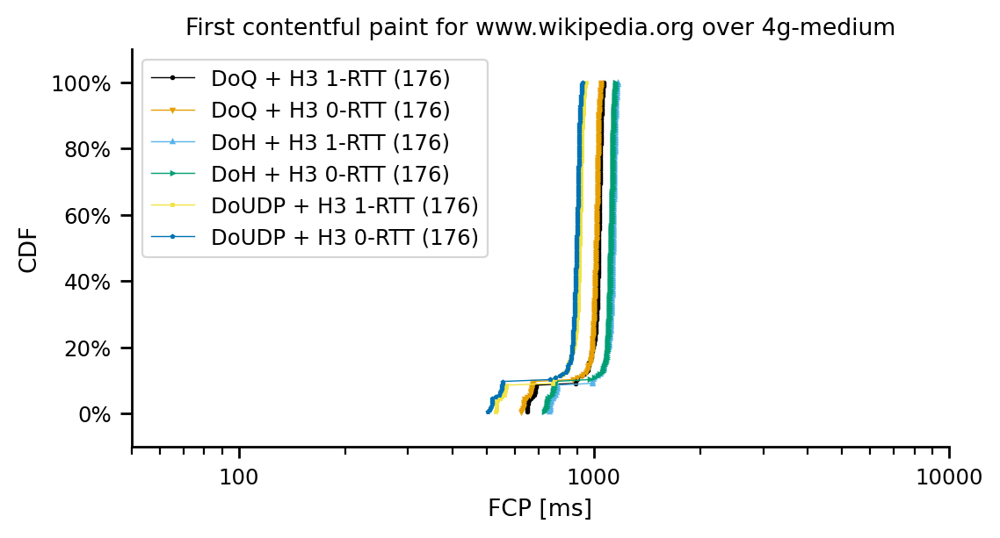

count    175.000000
mean     544.864590
std        6.466683
min      526.191782
10%      537.041323
20%      538.903751
25%      539.558878
30%      540.431311
40%      543.197403
50%      544.452594
60%      545.859048
70%      548.478934
75%      549.926861
80%      551.042574
90%      553.611182
100%     562.950392
max      562.950392
Name: full_fcp, dtype: float64
count    175.000000
mean     527.856018
std        6.181312
min      514.097680
10%      520.834665
20%      522.283181
25%      523.172193
30%      523.657064
40%      525.147654
50%      527.375288
60%      528.602804
70%      530.823296
75%      531.988497
80%      533.903374
90%      536.887704
100%     547.627697
max      547.627697
Name: full_fcp, dtype: float64
count    175.000000
mean     646.006413
std        6.466588
min      627.534298
10%      638.170276
20%      639.707275
25%      640.582048
30%      642.019904
40%      644.562174
50%      645.443668
60%      646.750661
70%      649.651328
75%      651.31401

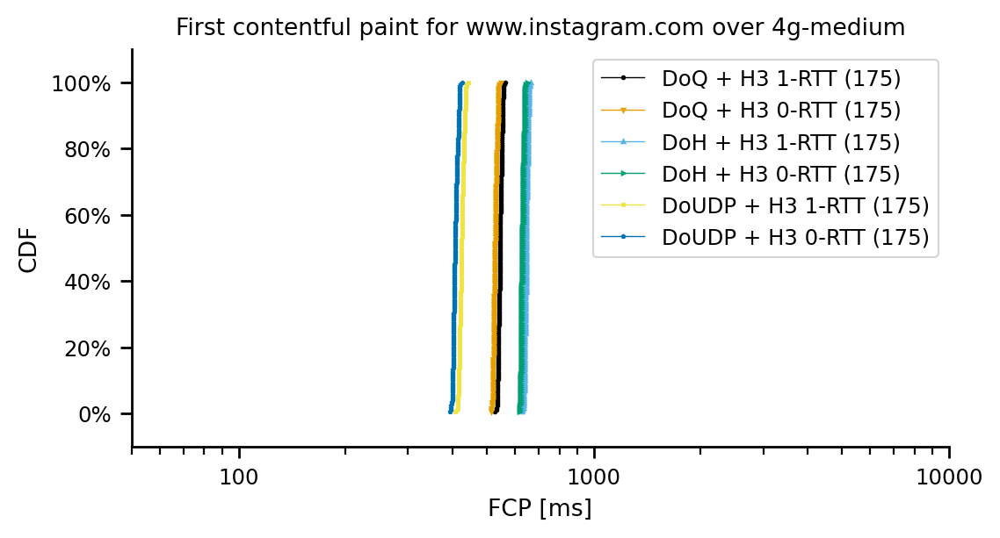

In [875]:
for access_technology in df_dns_and_h3.experiment_type.unique():
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_fcp', 'experiment_description', 'website']].copy()
    for website in df_plt['website'].unique():
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=True
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_fcp']) == 0:
                    continue
                print(df_tmp['full_fcp'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_fcp'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('First contentful paint for '+website+' over '+access_technology)

        ax.set_xlabel('FCP [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(50,10000)


        ax.legend()

        #if log:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
        #else:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
        plt.show()

In [876]:
df_dns_and_h3.experiment_description.unique()

array(['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoUDP + H3 1-RTT',
       'DoQ + H3 0-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 0-RTT'],
      dtype=object)

In [877]:
df_diff_plt_udp = pd.DataFrame(columns = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'experiment_type', 'website'])
for access_technology in df_dns_and_h3['experiment_type'].unique():
    df_access_tech = df_dns_and_h3[df_dns_and_h3['experiment_type'] == access_technology].copy()
    for website in df_access_tech['website'].unique():
        df_website = df_access_tech[df_access_tech['website'] == website].copy()
        df_udp = df_website[df_website['experiment_description'] == 'DoUDP + H3 1-RTT'].copy()
        median_udp = df_udp['full_plt'].median()
        if median_udp is not np.nan:
            next_df_row = []
            for protocol in ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']:
                df_protocol = df_website[df_website['experiment_description'] == protocol].copy()
                median_protocol = df_protocol['full_plt'].median()
                #minimize floating point errors I guess?
                increase = (median_protocol/(median_udp/100))-100
                if increase is np.nan:
                    increase = 0
                next_df_row.append(increase)
            next_df_row.append(access_technology)
            next_df_row.append(website)
            next_df_series = pd.Series(next_df_row, index = df_diff_plt_udp.columns)
            df_diff_plt_udp = df_diff_plt_udp.append(next_df_series, ignore_index=True)
df_diff_plt_udp

,DoQ + H3 0-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,21.998478,31.916384,41.420902,dsl,www.example.org
1,8.471736,10.808662,14.075897,dsl,www.wikipedia.org
2,2.930220,4.506664,5.824850,dsl,www.instagram.com
3,13.928484,21.693095,35.402513,cable,www.example.org
4,2.707800,5.544091,9.089579,cable,www.wikipedia.org
5,2.869205,5.252254,8.495559,cable,www.instagram.com
6,11.471922,21.315236,32.113114,fiber,www.example.org
7,-0.629210,4.057903,6.262584,fiber,www.wikipedia.org
8,1.362198,3.876716,6.033432,fiber,www.instagram.com
9,24.441289,27.988486,52.491481,4g,www.example.org


In [878]:
df_diff_plt_quic = pd.DataFrame(columns = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'experiment_type', 'website'])
for access_technology in df_dns_and_h3['experiment_type'].unique():
    df_access_tech = df_dns_and_h3[df_dns_and_h3['experiment_type'] == access_technology].copy()
    for website in df_access_tech['website'].unique():
        df_website = df_access_tech[df_access_tech['website'] == website].copy()
        df_baseline = df_website[df_website['experiment_description'] == 'DoQ + H3 0-RTT'].copy()
        median_baseline = df_baseline['full_plt'].median()
        if median_baseline is not np.nan:
            next_df_row = []
            for protocol in ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']:
                df_protocol = df_website[df_website['experiment_description'] == protocol].copy()
                median_protocol = df_protocol['full_plt'].median()
                #minimize floating point errors I guess?
                increase = (median_protocol/(median_baseline/100))-100
                if increase is np.nan:
                    increase = 0
                next_df_row.append(increase)
            next_df_row.append(access_technology)
            next_df_row.append(website)
            next_df_series = pd.Series(next_df_row, index = df_diff_plt_quic.columns)
            df_diff_plt_quic = df_diff_plt_quic.append(next_df_series, ignore_index=True)
df_diff_plt_quic

,DoUDP + H3 1-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,-18.031764,8.129532,15.920218,dsl,www.example.org
1,-7.810086,2.154410,5.166471,dsl,www.wikipedia.org
2,-2.846803,1.531565,2.812225,dsl,www.instagram.com
3,-12.225638,6.815338,18.848692,cable,www.example.org
4,-2.636412,2.761515,6.213529,cable,www.wikipedia.org
5,-2.789178,2.316581,5.469424,cable,www.instagram.com
6,-10.291311,8.830307,18.516943,fiber,www.example.org
7,0.633194,4.716792,6.935432,fiber,www.wikipedia.org
8,-1.343892,2.480725,4.608457,fiber,www.instagram.com
9,-19.640820,2.850498,22.540904,4g,www.example.org


In [879]:
df_diff_fcp_udp = pd.DataFrame(columns = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'experiment_type', 'website'])
for access_technology in df_dns_and_h3['experiment_type'].unique():
    df_access_tech = df_dns_and_h3[df_dns_and_h3['experiment_type'] == access_technology].copy()
    for website in df_access_tech['website'].unique():
        df_website = df_access_tech[df_access_tech['website'] == website].copy()
        df_udp = df_website[df_website['experiment_description'] == 'DoUDP + H3 1-RTT'].copy()
        median_udp = df_udp['full_fcp'].median()
        if median_udp is not np.nan:
            next_df_row = []
            for protocol in ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']:
                df_protocol = df_website[df_website['experiment_description'] == protocol].copy()
                median_protocol = df_protocol['full_fcp'].median()
                #minimize floating point errors I guess?
                increase = (median_protocol/(median_udp/100))-100
                if increase is np.nan:
                    increase = 0
                next_df_row.append(increase)
            next_df_row.append(access_technology)
            next_df_row.append(website)
            next_df_series = pd.Series(next_df_row, index = df_diff_fcp_udp.columns)
            df_diff_fcp_udp = df_diff_fcp_udp.append(next_df_series, ignore_index=True)
df_diff_fcp_udp

,DoQ + H3 0-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,21.307571,31.063737,40.431305,dsl,www.example.org
1,12.934624,19.030464,24.901751,dsl,www.wikipedia.org
2,20.265888,30.434503,39.631016,dsl,www.instagram.com
3,13.400909,20.903774,34.289410,cable,www.example.org
4,6.727350,10.991985,18.037084,cable,www.wikipedia.org
5,11.067106,20.274732,32.875015,cable,www.instagram.com
6,10.611266,17.594074,27.453960,fiber,www.example.org
7,105.169402,8.202626,12.862695,fiber,www.wikipedia.org
8,4.486591,17.438414,26.750606,fiber,www.instagram.com
9,24.008759,27.538031,51.645242,4g,www.example.org


In [880]:
df_diff_fcp_quic = pd.DataFrame(columns = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'experiment_type', 'website'])
for access_technology in df_dns_and_h3['experiment_type'].unique():
    df_access_tech = df_dns_and_h3[df_dns_and_h3['experiment_type'] == access_technology].copy()
    for website in df_access_tech['website'].unique():
        df_website = df_access_tech[df_access_tech['website'] == website].copy()
        df_baseline = df_website[df_website['experiment_description'] == 'DoQ + H3 0-RTT'].copy()
        median_baseline = df_baseline['full_fcp'].median()
        if median_baseline is not np.nan:
            next_df_row = []
            for protocol in ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']:
                df_protocol = df_website[df_website['experiment_description'] == protocol].copy()
                median_protocol = df_protocol['full_fcp'].median()
                #minimize floating point errors I guess?
                increase = (median_protocol/(median_baseline/100))-100
                if increase is np.nan:
                    increase = 0
                next_df_row.append(increase)
            next_df_row.append(access_technology)
            next_df_row.append(website)
            next_df_series = pd.Series(next_df_row, index = df_diff_fcp_quic.columns)
            df_diff_fcp_quic = df_diff_fcp_quic.append(next_df_series, ignore_index=True)
df_diff_fcp_quic

,DoUDP + H3 1-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,-17.564914,8.042504,15.764667,dsl,www.example.org
1,-11.453196,5.397671,10.596508,dsl,www.wikipedia.org
2,-16.850903,8.455111,16.101929,dsl,www.instagram.com
3,-11.817285,6.616230,18.420047,cable,www.example.org
4,-6.303304,3.995822,10.596848,cable,www.wikipedia.org
5,-9.964342,8.290146,19.634894,cable,www.instagram.com
6,-9.593296,6.312926,15.226924,fiber,www.example.org
7,-51.259789,-47.261812,-44.990484,fiber,www.wikipedia.org
8,-4.293939,12.395680,21.308012,fiber,www.instagram.com
9,-19.360535,2.845986,22.285912,4g,www.example.org


DoQ + H3 0-RTT
count    15.000000
mean      9.894757
std       8.457139
min      -0.629210
10%       1.900439
20%       2.836924
25%       2.899713
30%       3.469857
40%       6.024329
50%       8.471736
60%      10.376513
70%      11.430741
75%      12.700203
80%      15.542483
90%      23.464165
100%     25.903026
max      25.903026
Name: DoQ + H3 0-RTT, dtype: float64
DoQ + H3 1-RTT
count    15.000000
mean     13.764504
std       9.974958
min       3.876716
10%       4.237407
20%       5.103136
25%       5.398173
30%       5.989179
40%       7.795570
50%      10.808662
60%      12.228319
70%      19.650512
75%      21.504165
80%      22.952173
90%      28.724114
100%     31.916384
max      31.916384
Name: DoQ + H3 1-RTT, dtype: float64
DoH + H3 1-RTT
count    15.000000
mean     22.677997
std      16.652640
min       5.824850
10%       6.125093
20%       8.048964
25%       8.792569
30%      10.086843
40%      14.267928
50%      14.675539
60%      22.877894
70%      30.487492
75%    

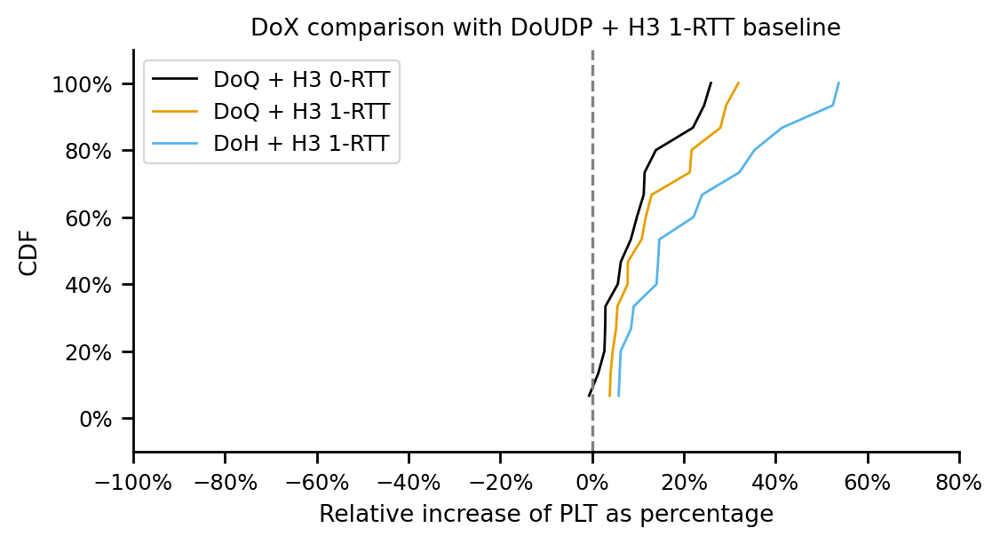

In [881]:
df_tmp = df_diff_plt_udp
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoUDP + H3 1-RTT baseline')

ax.set_xlabel('Relative increase of PLT as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-100, 80)
ax.legend()


if log:
    fig.savefig('figures/plt-rel-inc-doudp-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/plt-rel-inc-doudp-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoUDP + H3 1-RTT
count    15.000000
mean     -8.522545
std       6.715816
min     -20.573792
10%     -18.997198
20%     -13.386863
25%     -11.258475
30%     -10.258108
40%      -9.397103
50%      -7.810086
60%      -5.681147
70%      -3.343141
75%      -2.817990
80%      -2.758625
90%      -1.860900
100%      0.633194
max       0.633194
Name: DoUDP + H3 1-RTT, dtype: float64
DoQ + H3 1-RTT
count    15.000000
mean      3.466217
std       2.469805
min       1.434447
10%       1.539292
20%       1.720909
25%       1.895227
30%       2.052513
40%       2.251713
50%       2.480725
60%       2.682729
70%       2.832702
75%       3.783645
80%       5.136501
90%       7.603855
100%      8.830307
max       8.830307
Name: DoQ + H3 1-RTT, dtype: float64
DoH + H3 1-RTT
count    15.000000
mean     11.202691
std       6.698770
min       2.812225
10%       4.831663
20%       5.408834
25%       5.841477
30%       6.357910
40%       7.350972
50%       8.565062
60%      11.325557
70%      15.022405
75%

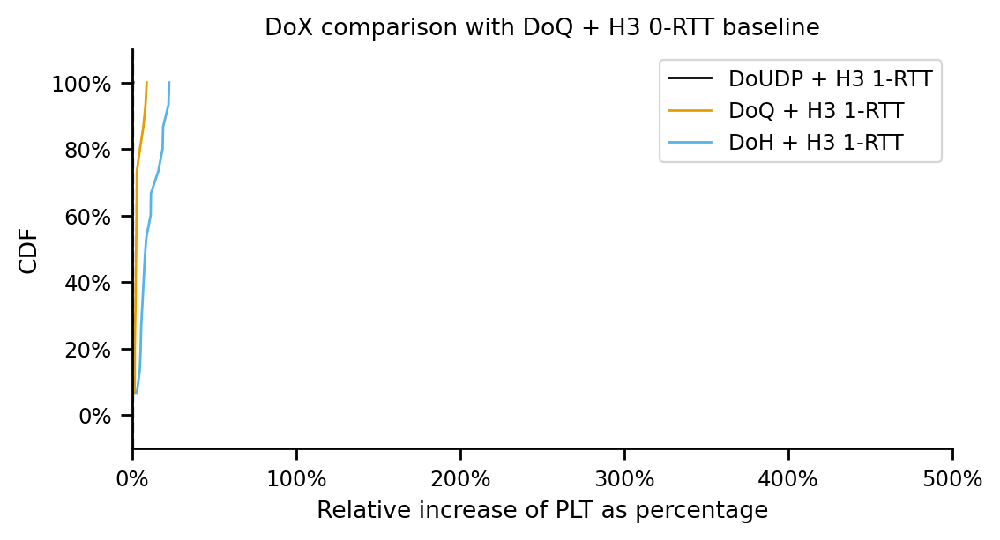

In [882]:
df_tmp = df_diff_plt_quic
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoQ + H3 0-RTT baseline')

ax.set_xlabel('Relative increase of PLT as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0, 500)
ax.legend()


if log:
    fig.savefig('figures/plt-rel-inc-doq-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/plt-rel-inc-doq-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoUDP + H3 1-RTT
count    15.000000
mean    -15.735069
std      11.104618
min     -51.259789
10%     -20.017589
20%     -19.401379
25%     -18.998289
30%     -18.421817
40%     -17.136507
50%     -11.817285
60%     -10.928728
70%      -9.999879
75%      -9.778819
80%      -9.455083
90%      -7.342875
100%     -4.293939
max      -4.293939
Name: DoUDP + H3 1-RTT, dtype: float64
DoQ + H3 1-RTT
count    15.000000
mean      1.854594
std      13.918326
min     -47.261812
10%       1.782077
20%       2.426480
25%       2.696252
30%       2.924423
40%       3.290298
50%       3.995822
60%       5.763773
70%       6.555569
75%       7.329367
80%       8.092032
90%       8.389125
100%     12.395680
max      12.395680
Name: DoQ + H3 1-RTT, dtype: float64
DoH + H3 1-RTT
count    15.000000
mean     13.005320
std      16.669409
min     -44.990484
10%      10.596644
20%      11.341258
25%      11.588018
30%      12.364326
40%      15.549570
50%      16.101929
60%      18.905986
70%      20.973388
75%

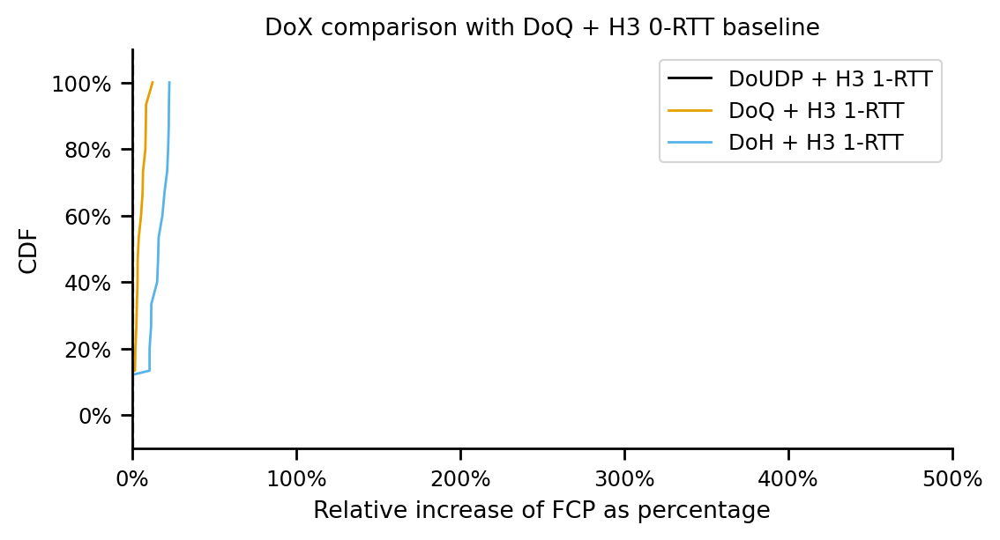

In [883]:
df_tmp = df_diff_fcp_quic
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoQ + H3 0-RTT baseline')

ax.set_xlabel('Relative increase of FCP as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0, 500)
ax.legend()


if log:
    fig.savefig('figures/fcp-rel-inc-doq-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/fcp-rel-inc-doq-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ + H3 0-RTT
count     15.000000
mean      21.584514
std       24.127905
min        4.486591
10%        7.945278
20%       10.443447
25%       10.839186
30%       11.111031
40%       12.275466
50%       13.400909
60%       20.682561
70%       22.585148
75%       23.456651
80%       24.071729
90%       25.030156
100%     105.169402
max      105.169402
Name: DoQ + H3 0-RTT, dtype: float64
DoQ + H3 1-RTT
count    15.000000
mean     20.837788
std       7.647270
min       8.202626
10%      11.358669
20%      12.900209
25%      15.293250
30%      17.469546
40%      18.455908
50%      20.274732
60%      23.338736
70%      27.428661
75%      27.943726
80%      28.418955
90%      29.739540
100%     31.063737
max      31.063737
Name: DoQ + H3 1-RTT, dtype: float64
DoH + H3 1-RTT
count    15.000000
mean     34.097679
std      13.271292
min      12.862695
10%      19.792652
20%      23.885329
25%      24.575956
30%      25.271522
40%      27.172618
50%      32.875015
60%      36.426052
70%      

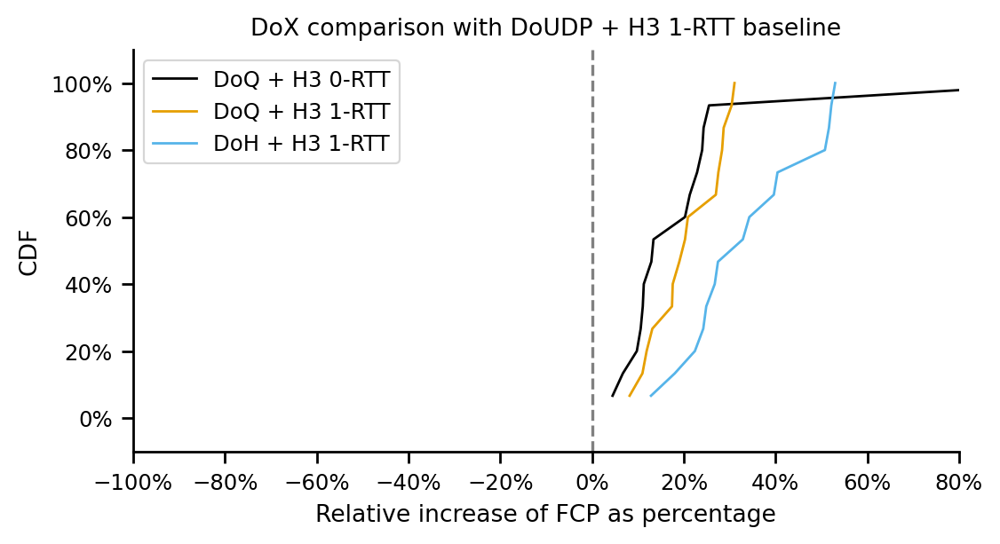

In [884]:
df_tmp = df_diff_fcp_udp
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoUDP + H3 1-RTT baseline')

ax.set_xlabel('Relative increase of FCP as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-100, 80)
ax.legend()


if log:
    fig.savefig('figures/fcp-rel-inc-doudp-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/fcp-rel-inc-doudp-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

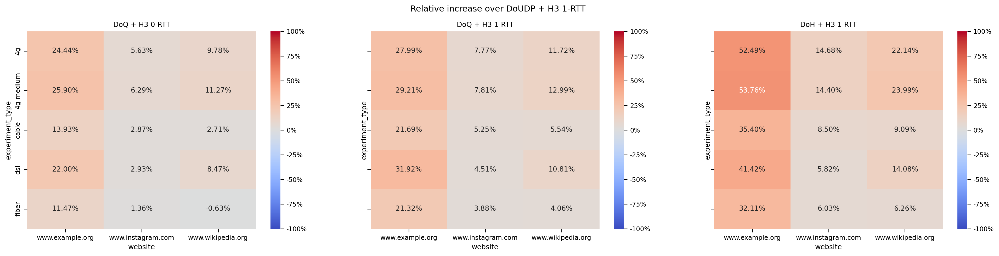

In [885]:
fig, axs = plt.subplots(1, 3, sharex='all', figsize=(24,5), sharey='all')
ax_hm1 =sns.heatmap(df_diff_plt_udp[['DoQ + H3 0-RTT', 'experiment_type', 'website']].pivot(index='experiment_type', columns='website', values='DoQ + H3 0-RTT'), ax=axs.flat[0], cmap="coolwarm", annot=True, fmt='.2f', cbar_kws={'format': '%.0f%%'}, vmin=-100, vmax=100)
ax_hm2 = sns.heatmap(df_diff_plt_udp[['DoQ + H3 1-RTT', 'experiment_type', 'website']].pivot(index='experiment_type', columns='website', values='DoQ + H3 1-RTT'), ax=axs.flat[1], cmap="coolwarm", annot=True, fmt='.2f', cbar_kws={'format': '%.0f%%'}, vmin=-100, vmax=100)
ax_hm3 = sns.heatmap(df_diff_plt_udp[['DoH + H3 1-RTT', 'experiment_type', 'website']].pivot(index='experiment_type', columns='website', values='DoH + H3 1-RTT'), ax=axs.flat[2], cmap="coolwarm", annot=True, fmt='.2f', cbar_kws={'format': '%.0f%%'}, vmin=-100, vmax=100)
axs.flat[0].set_title('DoQ + H3 0-RTT')
axs.flat[1].set_title('DoQ + H3 1-RTT')
axs.flat[2].set_title('DoH + H3 1-RTT')
fig.suptitle('Relative increase over DoUDP + H3 1-RTT')
ax_hm1.set_yticklabels(labels=ax_hm1.get_yticklabels(), va='center')
for t in ax_hm1.texts: t.set_text(t.get_text() + "%")
for t in ax_hm2.texts: t.set_text(t.get_text() + "%")
for t in ax_hm3.texts: t.set_text(t.get_text() + "%")
plt.show()

In [886]:
df_diff_plt_udp

,DoQ + H3 0-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,21.998478,31.916384,41.420902,dsl,www.example.org
1,8.471736,10.808662,14.075897,dsl,www.wikipedia.org
2,2.930220,4.506664,5.824850,dsl,www.instagram.com
3,13.928484,21.693095,35.402513,cable,www.example.org
4,2.707800,5.544091,9.089579,cable,www.wikipedia.org
5,2.869205,5.252254,8.495559,cable,www.instagram.com
6,11.471922,21.315236,32.113114,fiber,www.example.org
7,-0.629210,4.057903,6.262584,fiber,www.wikipedia.org
8,1.362198,3.876716,6.033432,fiber,www.instagram.com
9,24.441289,27.988486,52.491481,4g,www.example.org


In [887]:
df_diff_plt_udp

,DoQ + H3 0-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,21.998478,31.916384,41.420902,dsl,www.example.org
1,8.471736,10.808662,14.075897,dsl,www.wikipedia.org
2,2.930220,4.506664,5.824850,dsl,www.instagram.com
3,13.928484,21.693095,35.402513,cable,www.example.org
4,2.707800,5.544091,9.089579,cable,www.wikipedia.org
5,2.869205,5.252254,8.495559,cable,www.instagram.com
6,11.471922,21.315236,32.113114,fiber,www.example.org
7,-0.629210,4.057903,6.262584,fiber,www.wikipedia.org
8,1.362198,3.876716,6.033432,fiber,www.instagram.com
9,24.441289,27.988486,52.491481,4g,www.example.org


In [888]:
df_udp_baseline_medians = df_dns_and_h3[df_dns_and_h3.experiment_description == 'DoUDP + H3 1-RTT'].groupby(['website','experiment_type'], as_index=False).agg(full_plt_udp_med=('full_plt', 'median'), full_fcp_udp_med=('full_fcp', 'median'))

In [889]:
df_diff_all_data_udp_baseline_medians = pd.merge(df_dns_and_h3[df_dns_and_h3.experiment_description != 'DoUDP + H3 1-RTT'], df_udp_baseline_medians, on=['website', 'experiment_type'])
df_diff_all_data_udp_baseline_medians['relative_increase_plt'] = (df_diff_all_data_udp_baseline_medians['full_plt']/(df_diff_all_data_udp_baseline_medians['full_plt_udp_med']/100))-100
df_diff_all_data_udp_baseline_medians['relative_increase_fcp'] = (df_diff_all_data_udp_baseline_medians['full_fcp']/(df_diff_all_data_udp_baseline_medians['full_fcp_udp_med']/100))-100
df_diff_all_data_udp_baseline_medians

,msm_id,connectEnd,connectStart,domComplete,domContentLoadedEventEnd,domContentLoadedEventStart,domInteractive,domainLookupEnd,domainLookupStart,duration,...,transport_protocol,full_plt,full_fp,full_fcp,h3_description,experiment_description,full_plt_udp_med,full_fcp_udp_med,relative_increase_plt,relative_increase_fcp
0,8549aaee-cbed-42d1-be6e-601f53c03f40,112.3,46.8,217.4,217.4,217.4,217.4,46.8,46.8,217.4,...,DoQ,342.901293,348.601293,348.601293,H3 1-RTT,DoQ + H3 1-RTT,252.062158,258.391113,36.038387,34.912261
1,8549aaee-cbed-42d1-be6e-601f53c03f40,112.3,46.8,217.4,217.4,217.4,217.4,46.8,46.8,217.4,...,DoH,366.025383,371.725383,371.725383,H3 1-RTT,DoH + H3 1-RTT,252.062158,258.391113,45.212350,43.861520
2,8549aaee-cbed-42d1-be6e-601f53c03f40,106.2,47.2,188.4,188.4,188.4,188.4,47.2,47.1,188.4,...,DoQ,313.901293,319.001293,319.001293,H3 0-RTT,DoQ + H3 0-RTT,252.062158,258.391113,24.533288,23.456759
3,8549aaee-cbed-42d1-be6e-601f53c03f40,106.2,47.2,188.4,188.4,188.4,188.4,47.2,47.1,188.4,...,DoH,337.025383,342.125383,342.125383,H3 0-RTT,DoH + H3 0-RTT,252.062158,258.391113,33.707251,32.406018
4,8549aaee-cbed-42d1-be6e-601f53c03f40,106.2,47.2,188.4,188.4,188.4,188.4,47.2,47.1,188.4,...,DoUDP,232.522278,237.622278,237.622278,H3 0-RTT,DoUDP + H3 0-RTT,252.062158,258.391113,-7.752008,-8.037751
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13180,80365c3b-0405-4c17-a6da-21f844e82023,162.0,46.7,1431.7,1127.4,1127.4,1127.4,46.7,46.6,1432.6,...,DoQ,1657.793342,552.993342,552.993342,H3 1-RTT,DoQ + H3 1-RTT,1536.976271,424.195602,7.860699,30.362818
13181,80365c3b-0405-4c17-a6da-21f844e82023,162.0,46.7,1431.7,1127.4,1127.4,1127.4,46.7,46.6,1432.6,...,DoH,1758.913290,654.113290,654.113290,H3 1-RTT,DoH + H3 1-RTT,1536.976271,424.195602,14.439847,54.200866
13182,80365c3b-0405-4c17-a6da-21f844e82023,156.8,46.3,1395.8,1096.9,1096.9,1096.9,46.3,46.2,1396.4,...,DoQ,1621.693342,524.693342,524.693342,H3 0-RTT,DoQ + H3 0-RTT,1536.976271,424.195602,5.511931,23.691368
13183,80365c3b-0405-4c17-a6da-21f844e82023,156.8,46.3,1395.8,1096.9,1096.9,1096.9,46.3,46.2,1396.4,...,DoH,1722.813290,625.813290,625.813290,H3 0-RTT,DoH + H3 0-RTT,1536.976271,424.195602,12.091079,47.529415


In [890]:
df_diff_all_data_udp_baseline_medians.experiment_type.unique()

array(['dsl', 'cable', 'fiber', '4g', '4g-medium'], dtype=object)

In [891]:
df_diff_all_data_udp_baseline_medians.website.unique()

array(['www.example.org', 'www.wikipedia.org', 'www.instagram.com'],
      dtype=object)

In [892]:
df_diff_all_data_udp_baseline_medians.experiment_description.unique()

array(['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoQ + H3 0-RTT',
       'DoH + H3 0-RTT', 'DoUDP + H3 0-RTT'], dtype=object)

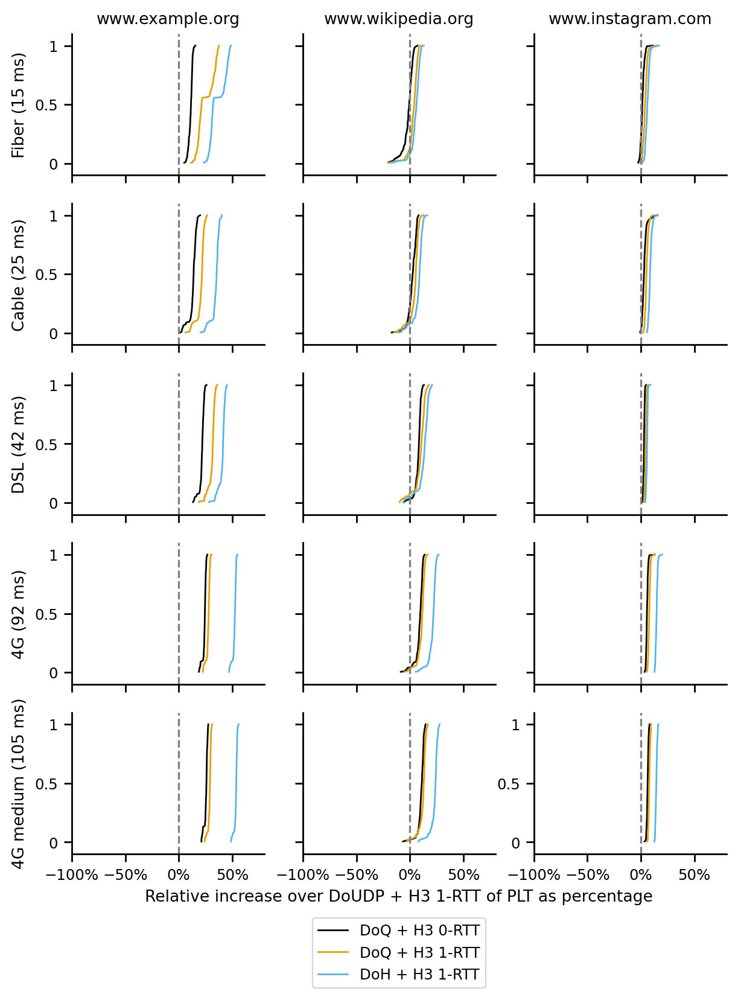

<Figure size 1200x800 with 0 Axes>

In [893]:
metrics_for_single_cdf = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(metrics_for_single_cdf, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(metrics_for_single_cdf, ['o','v','^','>','s','p','h','d','<','.']))
website_columns = ['www.example.org', 'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), sharex='all', figsize=(7,9), sharey='all')
#fig.suptitle('DoX comparison with DoUDP + H3 1-RTT baseline')
for i, website in enumerate(website_columns):
    for j, tech in enumerate(access_tech_rows):
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            s_plot = make_cdf(df_diff_all_data_udp_baseline_medians[(df_diff_all_data_udp_baseline_medians['website'] == website) & (df_diff_all_data_udp_baseline_medians['experiment_type'] == tech) & (df_diff_all_data_udp_baseline_medians['experiment_description'] == metric)]['relative_increase_plt'])
            s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == math.floor(len(website_columns)/2):
                ax.set_xlabel('Relative increase over DoUDP + H3 1-RTT of PLT as percentage')
                ax.legend(loc='center', bbox_to_anchor=(0.5, -0.7))
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(-100, 80)

plt.show()
plt.savefig("figures/plt-doudp-baseline-grid.pdf", bbox_inches='tight')

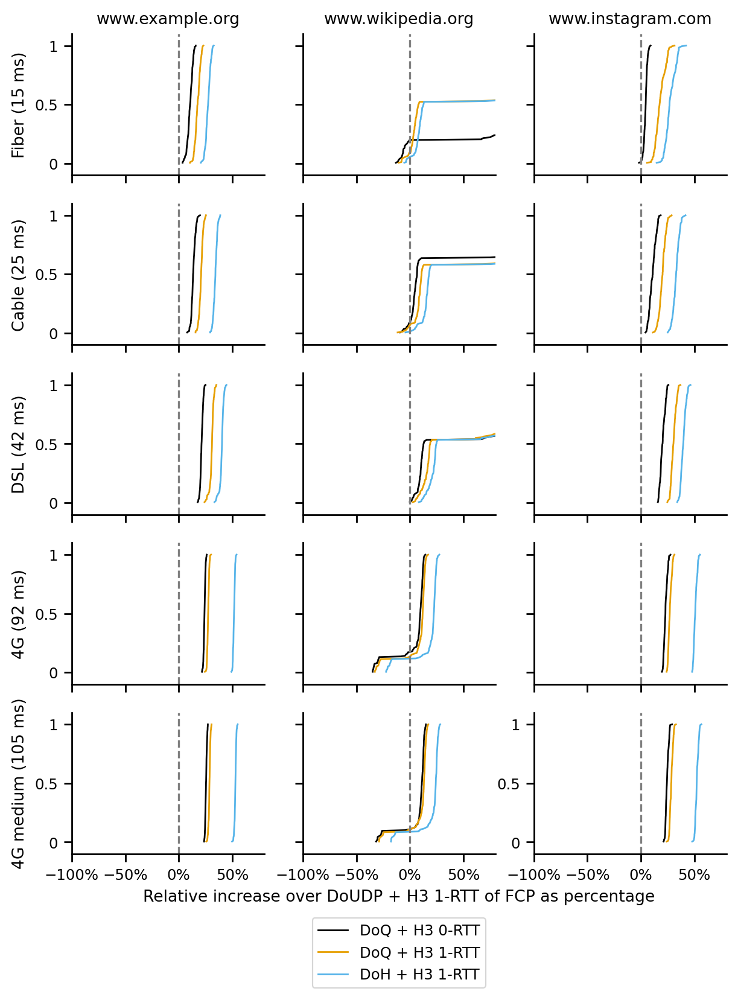

<Figure size 1200x800 with 0 Axes>

In [894]:
metrics_for_single_cdf = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(metrics_for_single_cdf, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(metrics_for_single_cdf, ['o','v','^','>','s','p','h','d','<','.']))
website_columns = ['www.example.org', 'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), sharex='all', figsize=(7,9), sharey='all')
#fig.suptitle('DoX comparison with DoUDP + H3 1-RTT baseline')
for i, website in enumerate(website_columns):
    for j, tech in enumerate(access_tech_rows):
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            s_plot = make_cdf(df_diff_all_data_udp_baseline_medians[(df_diff_all_data_udp_baseline_medians['website'] == website) & (df_diff_all_data_udp_baseline_medians['experiment_type'] == tech) & (df_diff_all_data_udp_baseline_medians['experiment_description'] == metric)]['relative_increase_fcp'])
            s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == math.floor(len(website_columns)/2):
                ax.set_xlabel('Relative increase over DoUDP + H3 1-RTT of FCP as percentage')
                ax.legend(loc='center', bbox_to_anchor=(0.5, -0.7))
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(-100, 80)

plt.show()
plt.savefig("figures/fcp-doudp-baseline-grid.pdf", bbox_inches='tight')

In [895]:
df_quic_baseline_medians = df_dns_and_h3[df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT'].groupby(['website','experiment_type'], as_index=False).agg(full_plt_udp_med=('full_plt', 'median'), full_fcp_udp_med=('full_fcp', 'median'))

In [896]:
df_diff_all_data_quic_baseline_medians = pd.merge(df_dns_and_h3[df_dns_and_h3.experiment_description != 'DoQ + H3 0-RTT'], df_quic_baseline_medians, on=['website', 'experiment_type'])
df_diff_all_data_quic_baseline_medians['relative_increase_plt'] = (df_diff_all_data_quic_baseline_medians['full_plt']/(df_diff_all_data_quic_baseline_medians['full_plt_udp_med']/100))-100
df_diff_all_data_quic_baseline_medians['relative_increase_fcp'] = (df_diff_all_data_quic_baseline_medians['full_fcp']/(df_diff_all_data_quic_baseline_medians['full_fcp_udp_med']/100))-100
df_diff_all_data_quic_baseline_medians

,msm_id,connectEnd,connectStart,domComplete,domContentLoadedEventEnd,domContentLoadedEventStart,domInteractive,domainLookupEnd,domainLookupStart,duration,...,transport_protocol,full_plt,full_fp,full_fcp,h3_description,experiment_description,full_plt_udp_med,full_fcp_udp_med,relative_increase_plt,relative_increase_fcp
0,8549aaee-cbed-42d1-be6e-601f53c03f40,112.3,46.8,217.4,217.4,217.4,217.4,46.8,46.8,217.4,...,DoQ,342.901293,348.601293,348.601293,H3 1-RTT,DoQ + H3 1-RTT,307.511997,313.447982,11.508265,11.215038
1,8549aaee-cbed-42d1-be6e-601f53c03f40,112.3,46.8,217.4,217.4,217.4,217.4,46.8,46.8,217.4,...,DoH,366.025383,371.725383,371.725383,H3 1-RTT,DoH + H3 1-RTT,307.511997,313.447982,19.028001,18.592368
2,8549aaee-cbed-42d1-be6e-601f53c03f40,112.3,46.8,217.4,217.4,217.4,217.4,46.8,46.8,217.4,...,DoUDP,261.522278,267.222278,267.222278,H3 1-RTT,DoUDP + H3 1-RTT,307.511997,313.447982,-14.955423,-14.747488
3,8549aaee-cbed-42d1-be6e-601f53c03f40,106.2,47.2,188.4,188.4,188.4,188.4,47.2,47.1,188.4,...,DoH,337.025383,342.125383,342.125383,H3 0-RTT,DoH + H3 0-RTT,307.511997,313.447982,9.597475,9.149014
4,8549aaee-cbed-42d1-be6e-601f53c03f40,106.2,47.2,188.4,188.4,188.4,188.4,47.2,47.1,188.4,...,DoUDP,232.522278,237.622278,237.622278,H3 0-RTT,DoUDP + H3 0-RTT,307.511997,313.447982,-24.385949,-24.190841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13180,80365c3b-0405-4c17-a6da-21f844e82023,162.0,46.7,1431.7,1127.4,1127.4,1127.4,46.7,46.6,1432.6,...,DoQ,1657.793342,552.993342,552.993342,H3 1-RTT,DoQ + H3 1-RTT,1633.625646,527.375288,1.479390,4.857652
13181,80365c3b-0405-4c17-a6da-21f844e82023,162.0,46.7,1431.7,1127.4,1127.4,1127.4,46.7,46.6,1432.6,...,DoH,1758.913290,654.113290,654.113290,H3 1-RTT,DoH + H3 1-RTT,1633.625646,527.375288,7.669300,24.031843
13182,80365c3b-0405-4c17-a6da-21f844e82023,162.0,46.7,1431.7,1127.4,1127.4,1127.4,46.7,46.6,1432.6,...,DoUDP,1537.668745,432.868745,432.868745,H3 1-RTT,DoUDP + H3 1-RTT,1633.625646,527.375288,-5.873861,-17.920169
13183,80365c3b-0405-4c17-a6da-21f844e82023,156.8,46.3,1395.8,1096.9,1096.9,1096.9,46.3,46.2,1396.4,...,DoH,1722.813290,625.813290,625.813290,H3 0-RTT,DoH + H3 0-RTT,1633.625646,527.375288,5.459491,18.665646


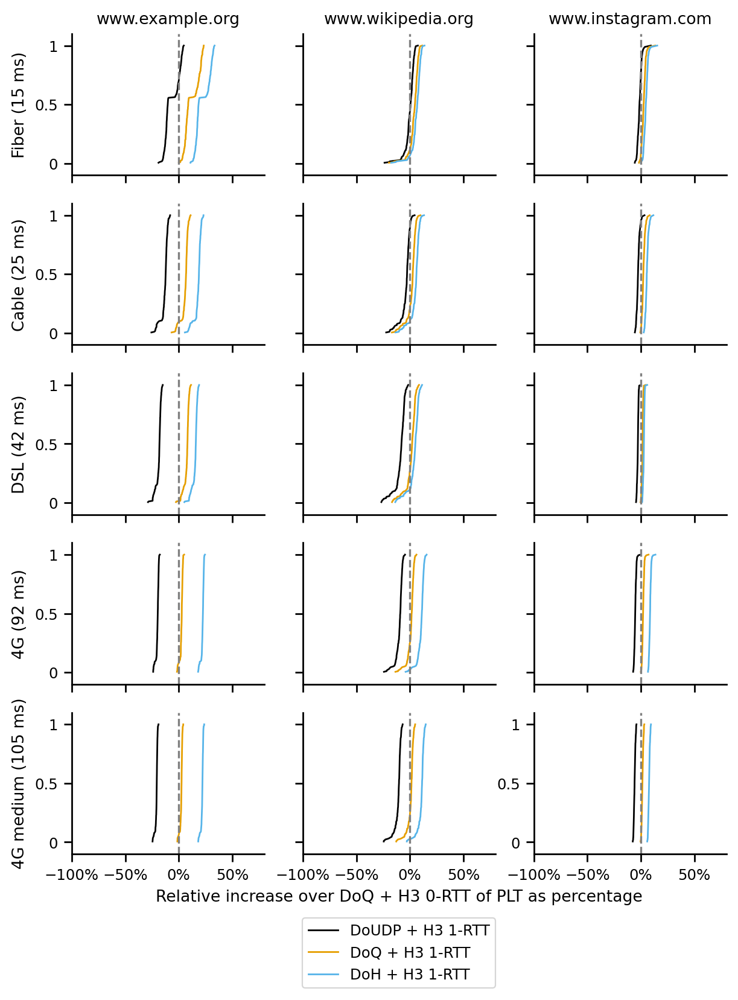

<Figure size 1200x800 with 0 Axes>

In [897]:
metrics_for_single_cdf = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(metrics_for_single_cdf, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(metrics_for_single_cdf, ['o','v','^','>','s','p','h','d','<','.']))
website_columns = ['www.example.org', 'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), sharex='all', figsize=(7,9), sharey='all')
#fig.suptitle('DoX comparison with DoUDP + H3 1-RTT baseline')
for i, website in enumerate(website_columns):
    for j, tech in enumerate(access_tech_rows):
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            s_plot = make_cdf(df_diff_all_data_quic_baseline_medians[(df_diff_all_data_quic_baseline_medians['website'] == website) & (df_diff_all_data_quic_baseline_medians['experiment_type'] == tech) & (df_diff_all_data_quic_baseline_medians['experiment_description'] == metric)]['relative_increase_plt'])
            s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == math.floor(len(website_columns)/2):
                ax.set_xlabel('Relative increase over DoQ + H3 0-RTT of PLT as percentage')
                ax.legend(loc='center', bbox_to_anchor=(0.5, -0.7))
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(-100, 80)

plt.show()
plt.savefig("figures/plt-doq-baseline-grid.pdf", bbox_inches='tight')

DoQ+0rtt -> 1-rtt handshake
DoUDP+1-rtt -> 1-rtt handshake
-> compare their relative increase in PLT from 4g to 4g medium for www.example.org (inflight should always be below BDP)

In [898]:
df_exchange_durations = df_dns_perf_metrics[df_dns_perf_metrics.metric_type == 'exchange'].copy()
df_exchange_durations = pd.merge(df_exchange_durations, measurements, on='msm_id')

In [899]:
df_exchange_durations.experiment_type.unique()

array(['dsl', 'cable', 'fiber', '4g', '4g-medium'], dtype=object)

In [900]:
df_exchange_durations['rtt'] = 0
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == 'dsl', 42.35979, df_exchange_durations['rtt'])
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == 'cable', 25.17665, df_exchange_durations['rtt'])
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == 'fiber', 14.767147, df_exchange_durations['rtt'])
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == '4g', 91.85231065904635, df_exchange_durations['rtt'])
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == '4g-medium', 104.5041425140391, df_exchange_durations['rtt'])

In [901]:
df_exchange_durations['duration_in_rtt'] = df_exchange_durations['duration'] / df_exchange_durations['rtt']

In [902]:
df_exchange_durations['handshake_round_trips'] = 0
df_exchange_durations['handshake_round_trips'] = np.where(df_exchange_durations['transport_protocol'] == 'DoQ', 1, df_exchange_durations['handshake_round_trips'])
df_exchange_durations['handshake_round_trips'] = np.where(df_exchange_durations['transport_protocol'] == 'DoH', 2, df_exchange_durations['handshake_round_trips'])

In [903]:
df_exchange_durations['theoretical_handshake_duration'] = df_exchange_durations['handshake_round_trips'] * df_exchange_durations['rtt']

In [904]:
df_exchange_durations['theoretical_exchange_without_handshake'] = df_exchange_durations['duration'] - df_exchange_durations['theoretical_handshake_duration']

In [905]:
df_exchange_durations['theoretical_query_in_rtt'] = df_exchange_durations['theoretical_exchange_without_handshake'] / df_exchange_durations['rtt']

In [906]:
df_exchange_durations['theoretical_processing_delay'] = df_exchange_durations['theoretical_exchange_without_handshake'] - df_exchange_durations['rtt']

In [907]:
df_exchange_durations.transport_protocol.unique()

array(['DoQ', 'DoH', 'DoUDP'], dtype=object)

DoQ
count    2637.000000
mean        2.500879
std         0.323765
min         2.074086
10%         2.133285
20%         2.149367
25%         2.154519
30%         2.156224
40%         2.290372
50%         2.497996
60%         2.562106
70%         2.776642
75%         2.810300
80%         2.880039
90%         2.936110
100%        2.989951
max         2.989951
Name: duration_in_rtt, dtype: float64
DoH
count    2637.000000
mean        3.381263
std         0.229283
min         3.075849
10%         3.122683
20%         3.124495
25%         3.125362
30%         3.126363
40%         3.283108
50%         3.433373
60%         3.494317
70%         3.507754
75%         3.510691
80%         3.547144
90%         3.712455
100%        3.846138
max         3.846138
Name: duration_in_rtt, dtype: float64
DoUDP
count    2637.000000
mean        1.027737
std         0.016716
min         1.004056
10%         1.008337
20%         1.008715
25%         1.008908
30%         1.009111
40%         1.015557
50%    

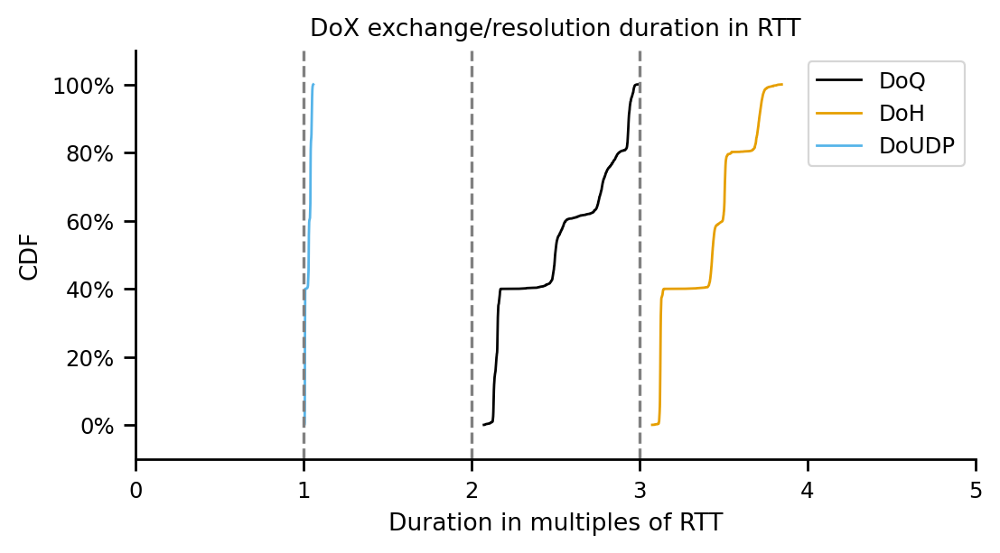

In [908]:
df_tmp = df_exchange_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=1, color='gray', linestyle='--')
plt.axvline(x=2, color='gray', linestyle='--')
plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX exchange/resolution duration in RTT')

ax.set_xlabel('Duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0, 5)
ax.legend()


if log:
    fig.savefig('figures/exchange-duration-in-rtt-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/exchange-duration-in-rtt.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    527.000000
mean       2.771578
std        0.074444
min        2.362922
10%        2.705543
20%        2.747022
25%        2.753505
30%        2.758153
40%        2.768466
50%        2.776599
60%        2.785842
70%        2.799922
75%        2.809608
80%        2.826742
90%        2.854800
100%       2.907455
max        2.907455
Name: duration_in_rtt, dtype: float64
DoH
count    527.000000
mean       3.713271
std        0.036808
min        3.341013
10%        3.687996
20%        3.695139
25%        3.699224
30%        3.702302
40%        3.708129
50%        3.712487
60%        3.718026
70%        3.723542
75%        3.726521
80%        3.730702
90%        3.742218
100%       3.846138
max        3.846138
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.048764
std        0.004078
min        1.022699
10%        1.043074
20%        1.046097
25%        1.047419
30%        1.047938
40%        1.048728
50%        1.049614
60%        1.050323
70%       

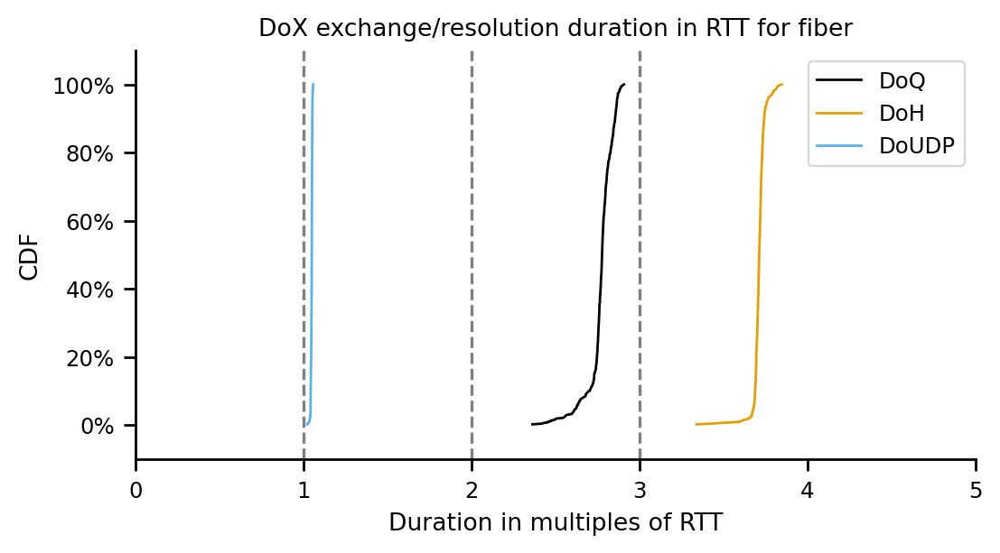

DoQ
count    528.000000
mean       2.500925
std        0.036603
min        2.283712
10%        2.474645
20%        2.486102
25%        2.489387
30%        2.491318
40%        2.495334
50%        2.498515
60%        2.503268
70%        2.510285
75%        2.516107
80%        2.527313
90%        2.546217
100%       2.585764
max        2.585764
Name: duration_in_rtt, dtype: float64
DoH
count    528.000000
mean       3.435320
std        0.022946
min        3.274151
10%        3.418730
20%        3.423729
25%        3.426002
30%        3.427636
40%        3.430755
50%        3.433598
60%        3.436428
70%        3.440062
75%        3.442049
80%        3.444261
90%        3.452273
100%       3.525003
max        3.525003
Name: duration_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.030900
std        0.002420
min        1.015056
10%        1.027714
20%        1.029740
25%        1.030297
30%        1.030604
40%        1.031039
50%        1.031352
60%        1.031713
70%       

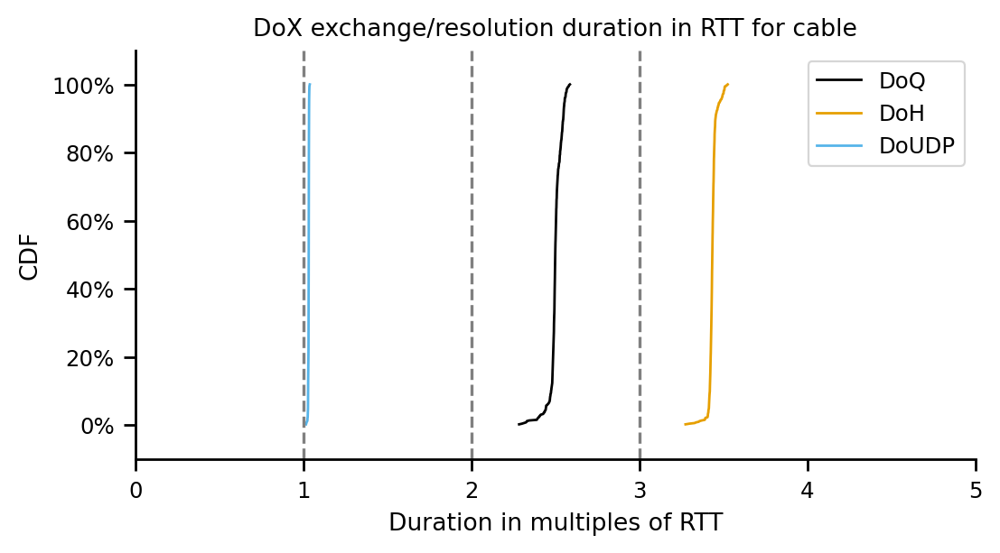

DoQ
count    528.000000
mean       2.938525
std        0.019168
min        2.825723
10%        2.926395
20%        2.929907
25%        2.930764
30%        2.932077
40%        2.934194
50%        2.936117
60%        2.939184
70%        2.944018
75%        2.947234
80%        2.951724
90%        2.963674
100%       2.989951
max        2.989951
Name: duration_in_rtt, dtype: float64
DoH
count    528.000000
mean       3.507989
std        0.010889
min        3.413520
10%        3.500350
20%        3.504137
25%        3.505076
30%        3.505813
40%        3.506743
50%        3.507743
60%        3.508810
70%        3.509946
75%        3.510696
80%        3.511843
90%        3.515237
100%       3.547767
max        3.547767
Name: duration_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.041637
std        0.001429
min        1.034841
10%        1.039697
20%        1.040966
25%        1.041231
30%        1.041384
40%        1.041565
50%        1.041794
60%        1.042007
70%       

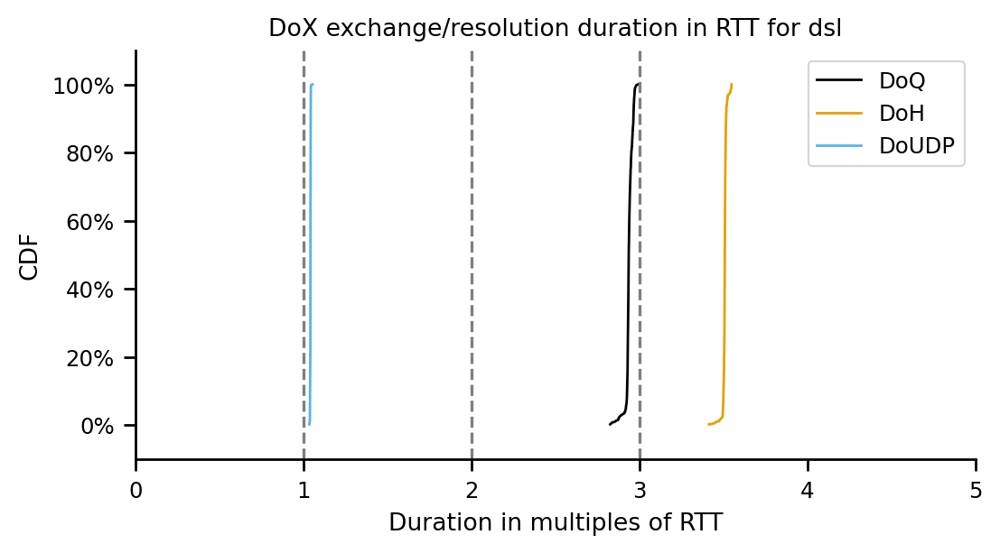

DoQ
count    527.000000
mean       2.134970
std        0.010184
min        2.074086
10%        2.128853
20%        2.130456
25%        2.130883
30%        2.131395
40%        2.132338
50%        2.133411
60%        2.135386
70%        2.138584
75%        2.141662
80%        2.143957
90%        2.146765
100%       2.156812
max        2.156812
Name: duration_in_rtt, dtype: float64
DoH
count    527.000000
mean       3.124201
std        0.005711
min        3.075849
10%        3.119179
20%        3.121764
25%        3.122249
30%        3.122684
40%        3.123402
50%        3.123989
60%        3.124803
70%        3.125769
75%        3.126275
80%        3.126713
90%        3.128457
100%       3.146403
max        3.146403
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.008318
std        0.000562
min        1.004056
10%        1.007496
20%        1.007983
25%        1.008136
30%        1.008208
40%        1.008341
50%        1.008440
60%        1.008501
70%       

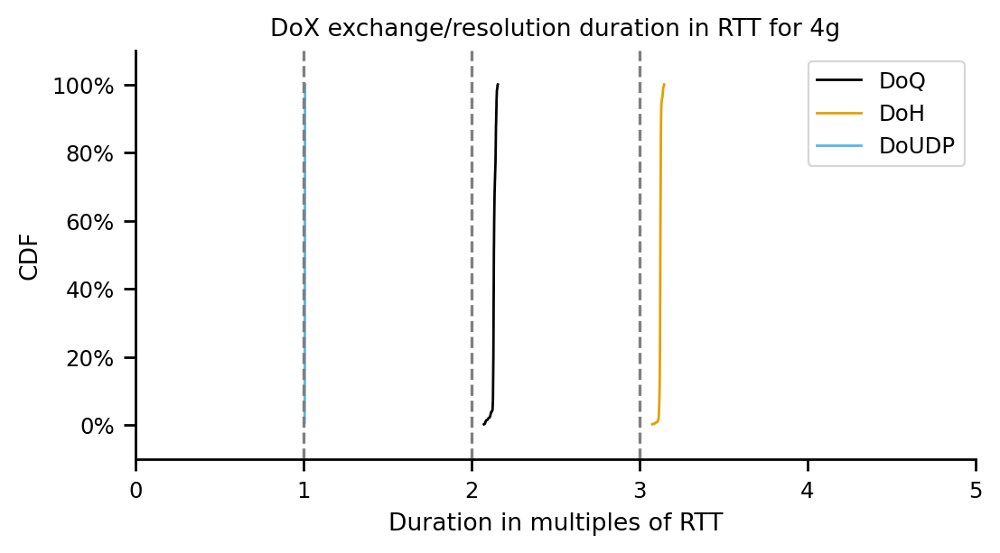

DoQ
count    527.000000
mean       2.157569
std        0.006967
min        2.109338
10%        2.152949
20%        2.154054
25%        2.154447
30%        2.154769
40%        2.155423
50%        2.156202
60%        2.157091
70%        2.158272
75%        2.159863
80%        2.163397
90%        2.167956
100%       2.174308
max        2.174308
Name: duration_in_rtt, dtype: float64
DoH
count    527.000000
mean       3.125191
std        0.004665
min        3.091272
10%        3.120669
20%        3.122668
25%        3.123148
30%        3.123440
40%        3.124193
50%        3.124794
60%        3.125395
70%        3.125907
75%        3.126546
80%        3.127022
90%        3.129038
100%       3.141614
max        3.141614
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.009034
std        0.000461
min        1.007305
10%        1.008318
20%        1.008753
25%        1.008831
30%        1.008879
40%        1.008987
50%        1.009077
60%        1.009177
70%       

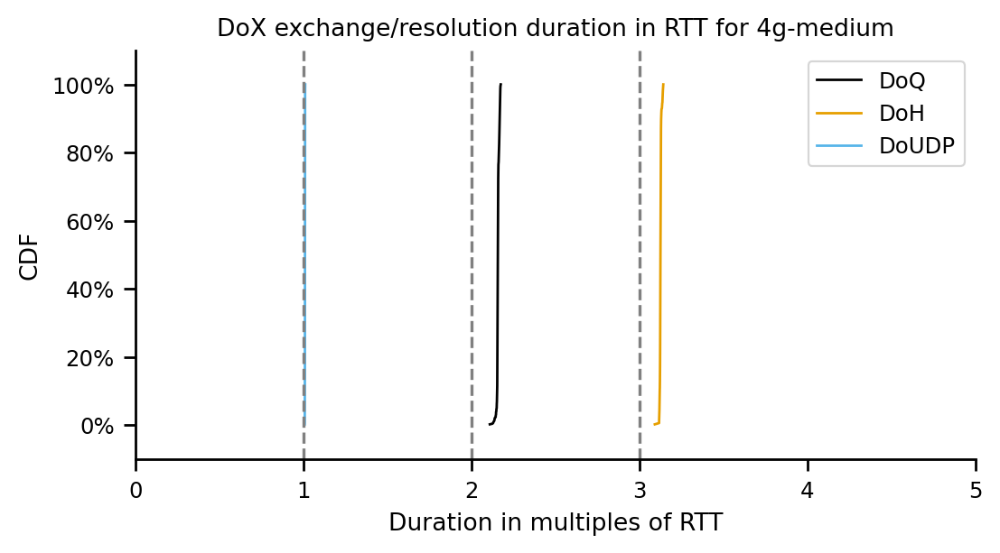

In [909]:
df_tmp = df_exchange_durations
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoH', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    plt.axvline(x=1, color='gray', linestyle='--')
    plt.axvline(x=2, color='gray', linestyle='--')
    plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoX exchange/resolution duration in RTT for '+tech)

    ax.set_xlabel('Duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(0, 5)
    ax.legend()


    if log:
        fig.savefig('figures/exchange-duration-in-rtt-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/exchange-duration-in-rtt-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

DoQ
count    2637.000000
mean       74.246205
std        36.853353
min        20.126469
10%        26.237204
20%        32.403407
25%        37.497809
30%        37.727937
40%        54.889432
50%        82.012011
60%        84.165823
70%       104.104585
75%       104.853216
80%       106.223983
90%       120.827845
100%      122.720046
max       122.720046
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    2637.000000
mean       69.217892
std        36.197057
min        19.802929
10%        25.289890
20%        32.191607
25%        35.901952
30%        36.094340
40%        46.987233
50%        63.867489
60%        65.561456
70%       103.240401
75%       103.449306
80%       105.296293
90%       117.545524
100%      119.303357
max       119.303357
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    2637.000000
mean       56.709539
std        35.966550
min        15.102344
10%        15.499897
20%        25.562019
25%        25.939564
30%

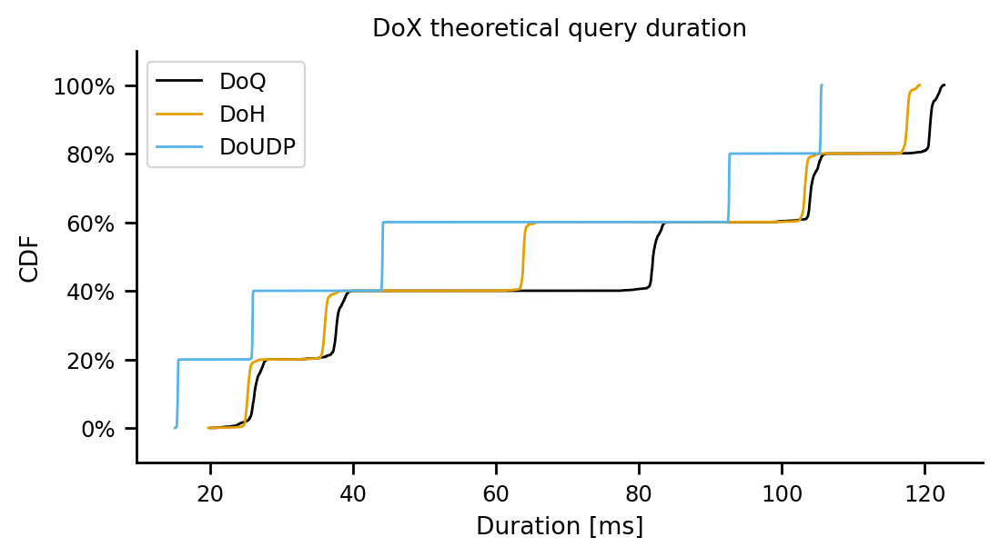

In [910]:
df_tmp = df_exchange_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_exchange_without_handshake'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_exchange_without_handshake'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

#plt.axvline(x=1, color='gray', linestyle='--')
#plt.axvline(x=2, color='gray', linestyle='--')
#plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX theoretical query duration')

ax.set_xlabel('Duration [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
#ax.set_xlim(0, 5)
ax.legend()


if log:
    fig.savefig('figures/theoretical-query-duration-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/theoretical-query-duration.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    527.000000
mean      26.161146
std        1.099327
min       20.126469
10%       25.186001
20%       25.798536
25%       25.894268
30%       25.962901
40%       26.115199
50%       26.235304
60%       26.371786
70%       26.579708
75%       26.722754
80%       26.975762
90%       27.390106
100%      28.167663
max       28.167663
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    527.000000
mean      25.300131
std        0.543556
min       19.802929
10%       24.926887
20%       25.032373
25%       25.092689
30%       25.138148
40%       25.224186
50%       25.288543
60%       25.370346
70%       25.451802
75%       25.495794
80%       25.557524
90%       25.727595
100%      27.262194
max       27.262194
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    527.000000
mean      15.487247
std        0.060221
min       15.102344
10%       15.403224
20%       15.447869
25%       15.467397
30%       15.475049
40%       15.486717
50% 

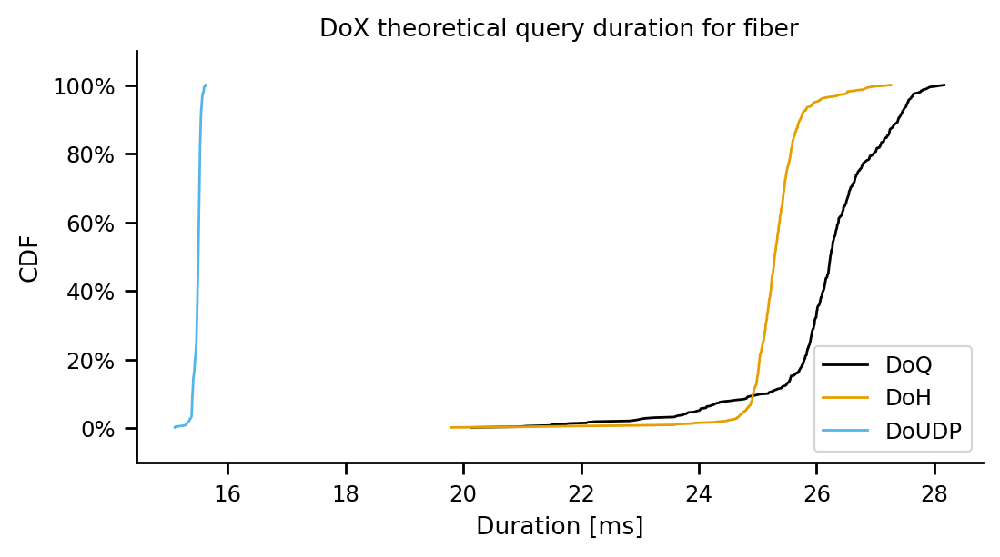

DoQ
count    528.000000
mean      37.788267
std        0.921538
min       32.319567
10%       37.126626
20%       37.415059
25%       37.497777
30%       37.546393
40%       37.647492
50%       37.727584
60%       37.847261
70%       38.023909
75%       38.170492
80%       38.452618
90%       38.928572
100%      39.924213
max       39.924213
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    528.000000
mean      36.136555
std        0.577704
min       32.078845
10%       35.718859
20%       35.844726
25%       35.901941
30%       35.943096
40%       36.021610
50%       36.093206
60%       36.164437
70%       36.255926
75%       36.305960
80%       36.361646
90%       36.563367
100%      38.394460
max       38.394460
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    528.000000
mean      25.954620
std        0.060919
min       25.555721
10%       25.874407
20%       25.925407
25%       25.939418
30%       25.947156
40%       25.958097
50% 

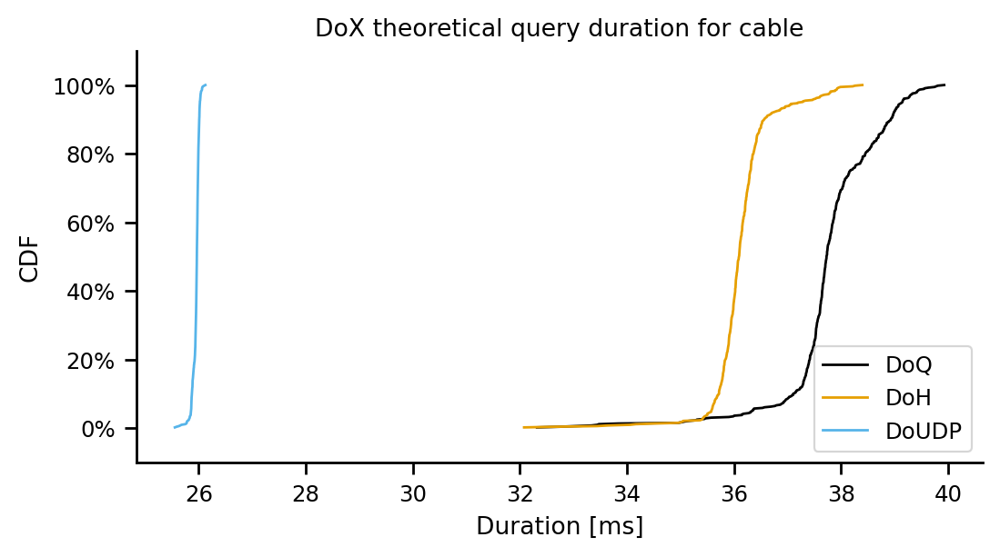

DoQ
count    528.000000
mean      82.115496
std        0.811952
min       77.337260
10%       81.601684
20%       81.750460
25%       81.786765
30%       81.842389
40%       81.932054
50%       82.013497
60%       82.143427
70%       82.348175
75%       82.484416
80%       82.674620
90%       83.180806
100%      84.293913
max       84.293913
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    528.000000
mean      63.878098
std        0.461262
min       59.876393
10%       63.554513
20%       63.714937
25%       63.754704
30%       63.785908
40%       63.825323
50%       63.867685
60%       63.912870
70%       63.960998
75%       63.992760
80%       64.041350
90%       64.185106
100%      65.563098
max       65.563098
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    528.000000
mean      44.123522
std        0.060520
min       43.835630
10%       44.041360
20%       44.095106
25%       44.106339
30%       44.112789
40%       44.120476
50% 

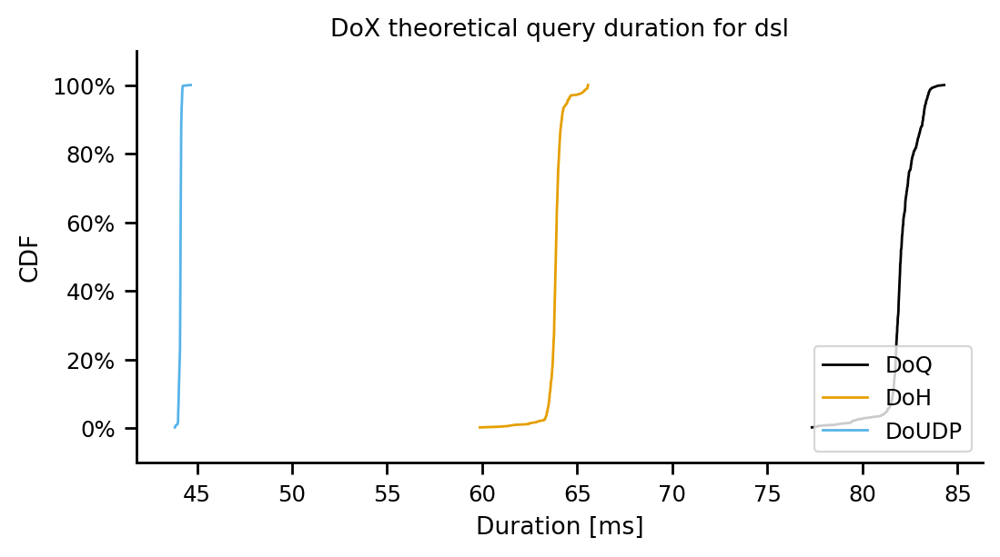

DoQ
count    527.000000
mean     104.249586
std        0.935384
min       98.657293
10%      103.687782
20%      103.835017
25%      103.874193
30%      103.921278
40%      104.007817
50%      104.106409
60%      104.287845
70%      104.581528
75%      104.864247
80%      105.075139
90%      105.333000
100%     106.255834
max      106.255834
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    527.000000
mean     103.260457
std        0.524603
min       98.819174
10%      102.799184
20%      103.036598
25%      103.081125
30%      103.121131
40%      103.187063
50%      103.241003
60%      103.315741
70%      103.404495
75%      103.450938
80%      103.491207
90%      103.651374
100%     105.299720
max      105.299720
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    527.000000
mean      92.616329
std        0.051577
min       92.224833
10%       92.540857
20%       92.585549
25%       92.599603
30%       92.606225
40%       92.618466
50% 

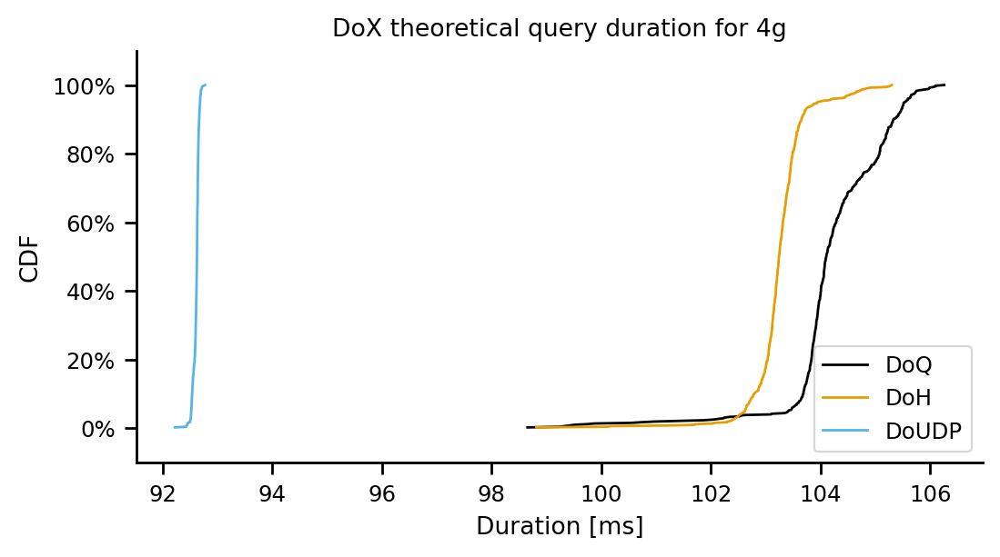

DoQ
count    527.000000
mean     120.970779
std        0.728062
min      115.930403
10%      120.487935
20%      120.603456
25%      120.644491
30%      120.678193
40%      120.746471
50%      120.827851
60%      120.920751
70%      121.044188
75%      121.210515
80%      121.579799
90%      122.056283
100%     122.720046
max      122.720046
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    527.000000
mean     117.587123
std        0.487503
min      114.042488
10%      117.114507
20%      117.323465
25%      117.373661
30%      117.404101
40%      117.482785
50%      117.545616
60%      117.608396
70%      117.661988
75%      117.728757
80%      117.778430
90%      117.989140
100%     119.303357
max      119.303357
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    527.000000
mean     105.448220
std        0.048134
min      105.267555
10%      105.373362
20%      105.418888
25%      105.427062
30%      105.432055
40%      105.443333
50% 

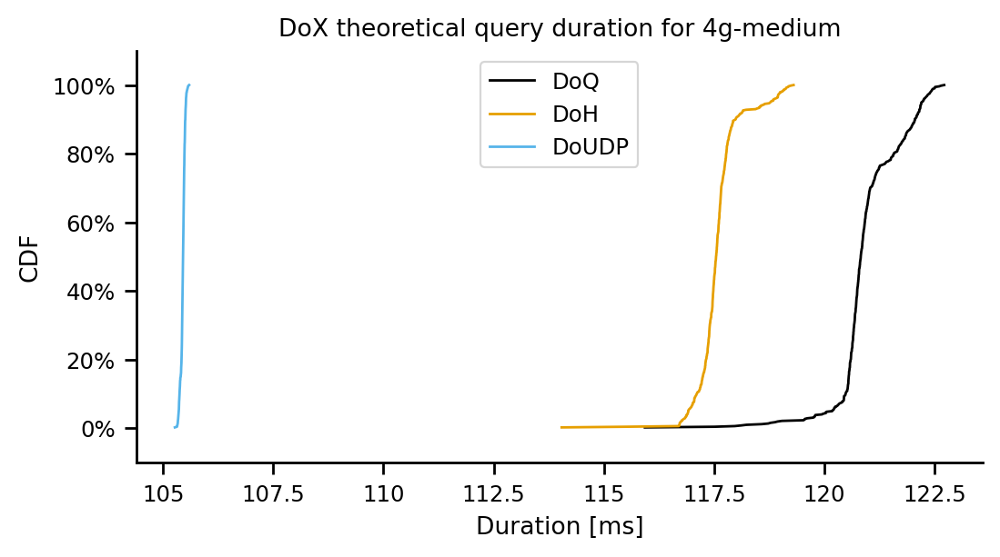

In [911]:
df_tmp = df_exchange_durations
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoH', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_exchange_without_handshake'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_exchange_without_handshake'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    #plt.axvline(x=1, color='gray', linestyle='--')
    #plt.axvline(x=2, color='gray', linestyle='--')
    #plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoX theoretical query duration for '+tech)

    ax.set_xlabel('Duration [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    #ax.set_xlim(0, 5)
    ax.legend()


    if log:
        fig.savefig('figures/theoretical-query-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/theoretical-query-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

DoQ
count    2637.000000
mean        1.500879
std         0.323765
min         1.074086
10%         1.133285
20%         1.149367
25%         1.154519
30%         1.156224
40%         1.290372
50%         1.497996
60%         1.562106
70%         1.776642
75%         1.810300
80%         1.880039
90%         1.936110
100%        1.989951
max         1.989951
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    2637.000000
mean        1.381263
std         0.229283
min         1.075849
10%         1.122683
20%         1.124495
25%         1.125362
30%         1.126363
40%         1.283108
50%         1.433373
60%         1.494317
70%         1.507754
75%         1.510691
80%         1.547144
90%         1.712455
100%        1.846138
max         1.846138
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    2637.000000
mean        1.027737
std         0.016716
min         1.004056
10%         1.008337
20%         1.008715
25%         1.008908
30%         1.009111
40%       

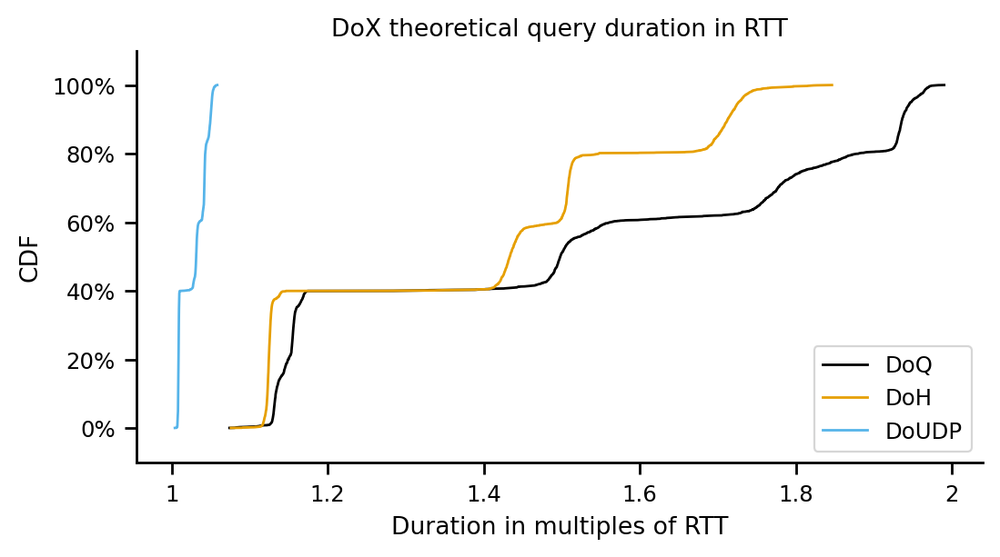

In [912]:
df_tmp = df_exchange_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_query_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_query_in_rtt'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

#plt.axvline(x=1, color='gray', linestyle='--')
#plt.axvline(x=2, color='gray', linestyle='--')
#plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX theoretical query duration in RTT')

ax.set_xlabel('Duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
#ax.set_xlim(0, 5)
ax.legend()


if log:
    fig.savefig('figures/theoretical-query-duration-in-rtt-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/theoretical-query-duration-in-rtt.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    527.000000
mean       1.771578
std        0.074444
min        1.362922
10%        1.705543
20%        1.747022
25%        1.753505
30%        1.758153
40%        1.768466
50%        1.776599
60%        1.785842
70%        1.799922
75%        1.809608
80%        1.826742
90%        1.854800
100%       1.907455
max        1.907455
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    527.000000
mean       1.713271
std        0.036808
min        1.341013
10%        1.687996
20%        1.695139
25%        1.699224
30%        1.702302
40%        1.708129
50%        1.712487
60%        1.718026
70%        1.723542
75%        1.726521
80%        1.730702
90%        1.742218
100%       1.846138
max        1.846138
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.048764
std        0.004078
min        1.022699
10%        1.043074
20%        1.046097
25%        1.047419
30%        1.047938
40%        1.048728
50%        1.049614
60%        1

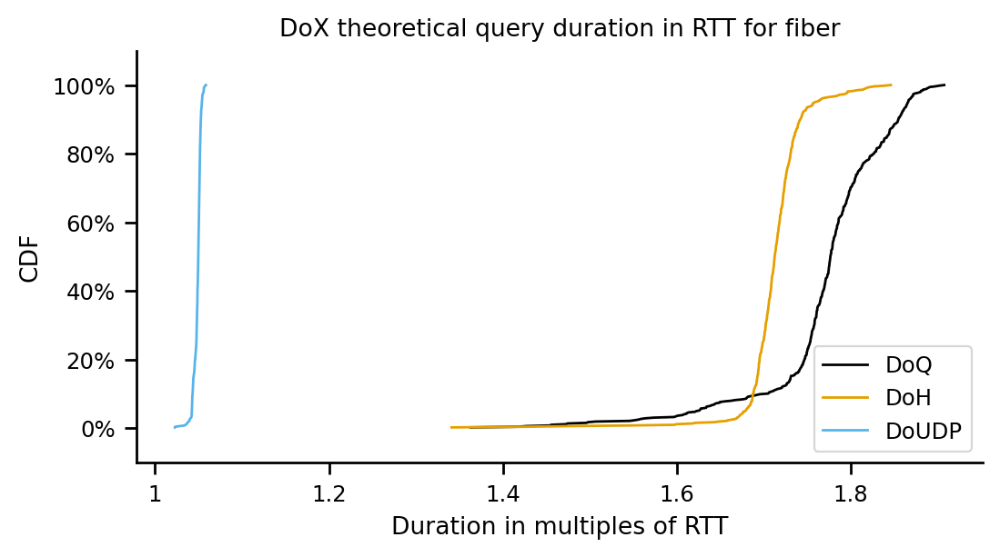

DoQ
count    528.000000
mean       1.500925
std        0.036603
min        1.283712
10%        1.474645
20%        1.486102
25%        1.489387
30%        1.491318
40%        1.495334
50%        1.498515
60%        1.503268
70%        1.510285
75%        1.516107
80%        1.527313
90%        1.546217
100%       1.585764
max        1.585764
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    528.000000
mean       1.435320
std        0.022946
min        1.274151
10%        1.418730
20%        1.423729
25%        1.426002
30%        1.427636
40%        1.430755
50%        1.433598
60%        1.436428
70%        1.440062
75%        1.442049
80%        1.444261
90%        1.452273
100%       1.525003
max        1.525003
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.030900
std        0.002420
min        1.015056
10%        1.027714
20%        1.029740
25%        1.030297
30%        1.030604
40%        1.031039
50%        1.031352
60%        1

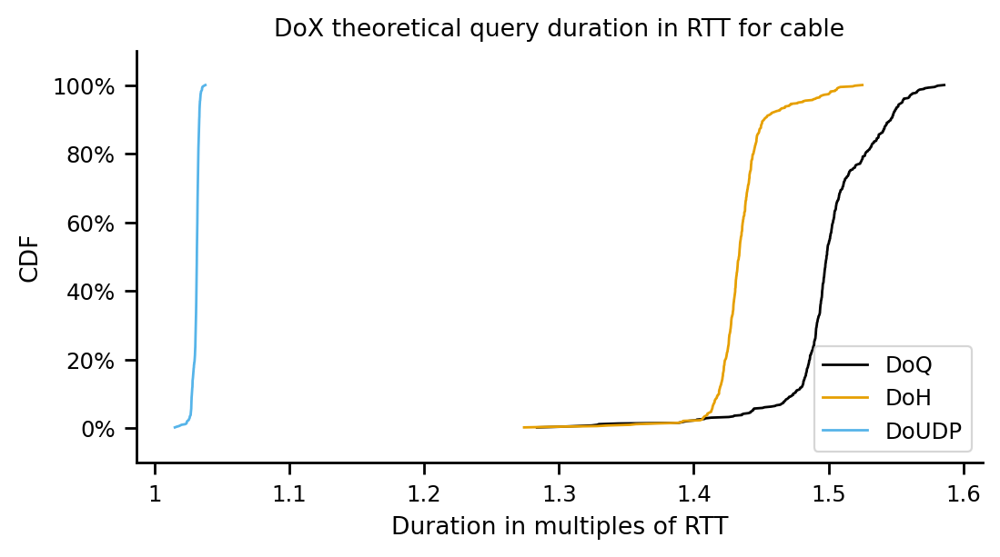

DoQ
count    528.000000
mean       1.938525
std        0.019168
min        1.825723
10%        1.926395
20%        1.929907
25%        1.930764
30%        1.932077
40%        1.934194
50%        1.936117
60%        1.939184
70%        1.944018
75%        1.947234
80%        1.951724
90%        1.963674
100%       1.989951
max        1.989951
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    528.000000
mean       1.507989
std        0.010889
min        1.413520
10%        1.500350
20%        1.504137
25%        1.505076
30%        1.505813
40%        1.506743
50%        1.507743
60%        1.508810
70%        1.509946
75%        1.510696
80%        1.511843
90%        1.515237
100%       1.547767
max        1.547767
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.041637
std        0.001429
min        1.034841
10%        1.039697
20%        1.040966
25%        1.041231
30%        1.041384
40%        1.041565
50%        1.041794
60%        1

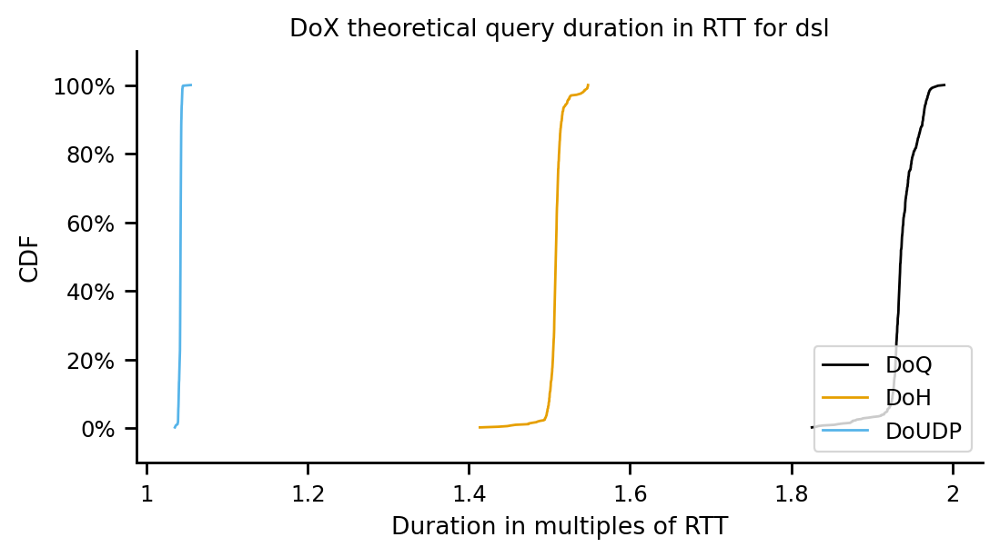

DoQ
count    527.000000
mean       1.134970
std        0.010184
min        1.074086
10%        1.128853
20%        1.130456
25%        1.130883
30%        1.131395
40%        1.132338
50%        1.133411
60%        1.135386
70%        1.138584
75%        1.141662
80%        1.143957
90%        1.146765
100%       1.156812
max        1.156812
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    527.000000
mean       1.124201
std        0.005711
min        1.075849
10%        1.119179
20%        1.121764
25%        1.122249
30%        1.122684
40%        1.123402
50%        1.123989
60%        1.124803
70%        1.125769
75%        1.126275
80%        1.126713
90%        1.128457
100%       1.146403
max        1.146403
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.008318
std        0.000562
min        1.004056
10%        1.007496
20%        1.007983
25%        1.008136
30%        1.008208
40%        1.008341
50%        1.008440
60%        1

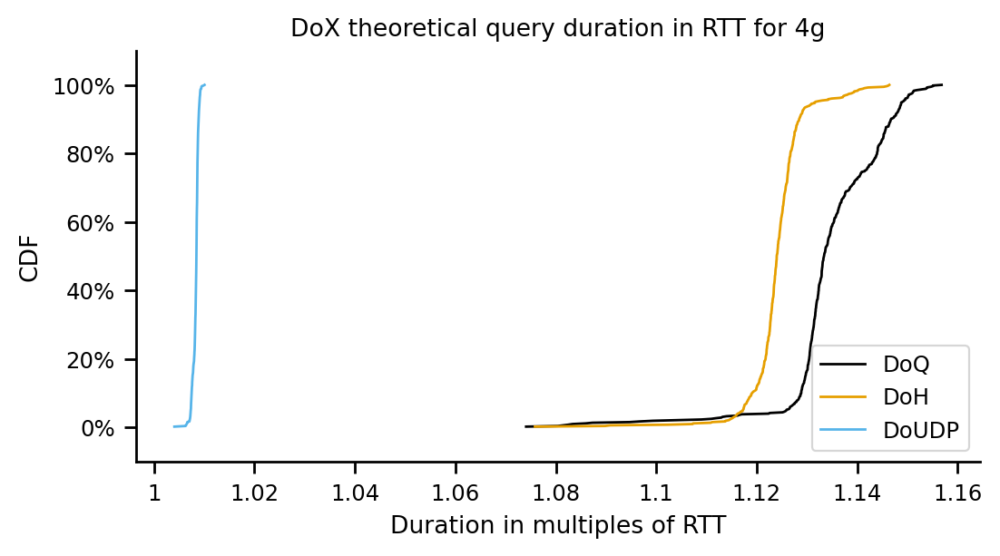

DoQ
count    527.000000
mean       1.157569
std        0.006967
min        1.109338
10%        1.152949
20%        1.154054
25%        1.154447
30%        1.154769
40%        1.155423
50%        1.156202
60%        1.157091
70%        1.158272
75%        1.159863
80%        1.163397
90%        1.167956
100%       1.174308
max        1.174308
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    527.000000
mean       1.125191
std        0.004665
min        1.091272
10%        1.120669
20%        1.122668
25%        1.123148
30%        1.123440
40%        1.124193
50%        1.124794
60%        1.125395
70%        1.125907
75%        1.126546
80%        1.127022
90%        1.129038
100%       1.141614
max        1.141614
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.009034
std        0.000461
min        1.007305
10%        1.008318
20%        1.008753
25%        1.008831
30%        1.008879
40%        1.008987
50%        1.009077
60%        1

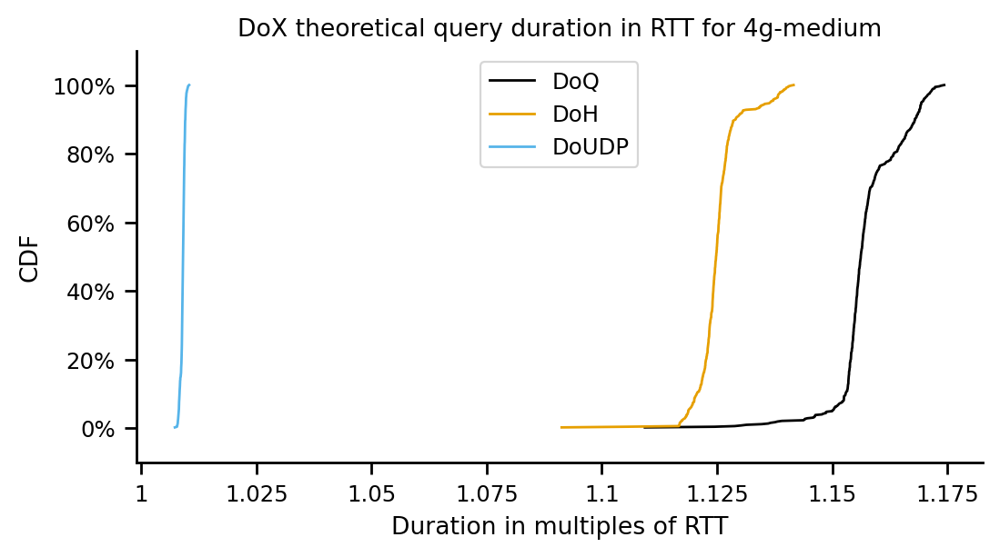

In [913]:
df_tmp = df_exchange_durations
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoH', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_query_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_query_in_rtt'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    #plt.axvline(x=1, color='gray', linestyle='--')
    #plt.axvline(x=2, color='gray', linestyle='--')
    #plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoX theoretical query duration in RTT for '+tech)

    ax.set_xlabel('Duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    #ax.set_xlim(0, 5)
    ax.legend()


    if log:
        fig.savefig('figures/theoretical-query-duration-in-rtt-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/theoretical-query-duration-in-rtt-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

DoQ
count    2637.000000
mean       18.530855
std        10.799678
min         5.359322
10%        11.354937
20%        11.927517
25%        12.104646
30%        12.242040
40%        12.530789
50%        13.044499
60%        14.339074
70%        16.323804
75%        16.712897
80%        31.625157
90%        39.653410
100%       41.934123
max        41.934123
Name: theoretical_processing_delay, dtype: float64
DoH
count    2637.000000
mean       13.502542
std         4.136504
min         5.035782
10%        10.459973
20%        10.707580
25%        10.817557
30%        10.922836
40%        11.209335
50%        11.480346
60%        12.509193
70%        13.052874
75%        13.232838
80%        16.973125
90%        21.507856
100%       23.203308
max        23.203308
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    2637.000000
mean        0.994190
std         0.396595
min         0.335197
10%         0.700701
20%         0.741806
25%         0.754479
30%         0.765579
40

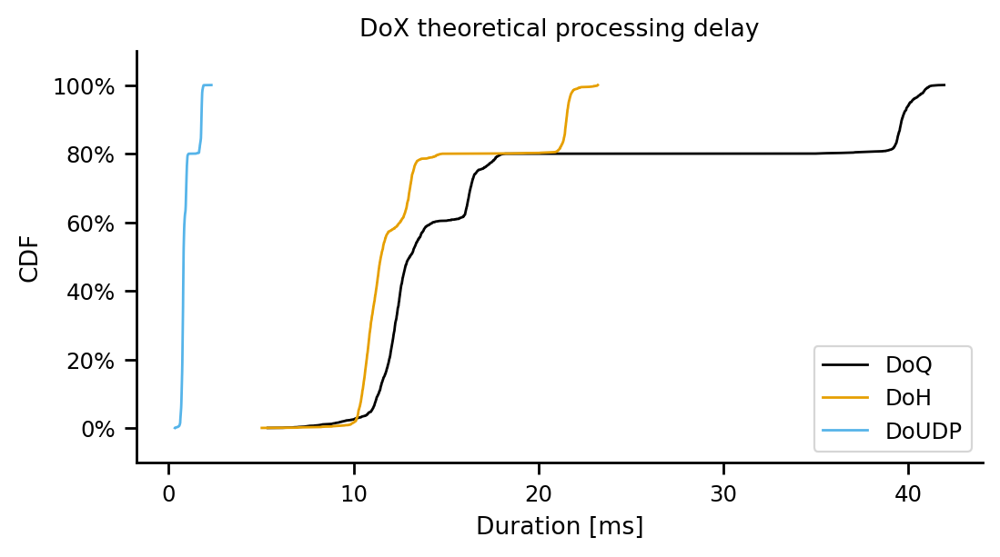

In [914]:
df_tmp = df_exchange_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_processing_delay'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_processing_delay'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)



ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX theoretical processing delay')

ax.set_xlabel('Duration [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
#ax.set_xlim(0, 5)
ax.legend()


if log:
    fig.savefig('figures/processing-delay-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/processing-delay.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    527.000000
mean      11.393999
std        1.099327
min        5.359322
10%       10.418854
20%       11.031389
25%       11.127121
30%       11.195754
40%       11.348052
50%       11.468157
60%       11.604639
70%       11.812561
75%       11.955607
80%       12.208615
90%       12.622959
100%      13.400516
max       13.400516
Name: theoretical_processing_delay, dtype: float64
DoH
count    527.000000
mean      10.532984
std        0.543556
min        5.035782
10%       10.159740
20%       10.265226
25%       10.325542
30%       10.371001
40%       10.457039
50%       10.521396
60%       10.603199
70%       10.684655
75%       10.728647
80%       10.790377
90%       10.960448
100%      12.495047
max       12.495047
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    527.000000
mean       0.720100
std        0.060221
min        0.335197
10%        0.636077
20%        0.680722
25%        0.700250
30%        0.707902
40%        0.719570
50%        0.732663
60% 

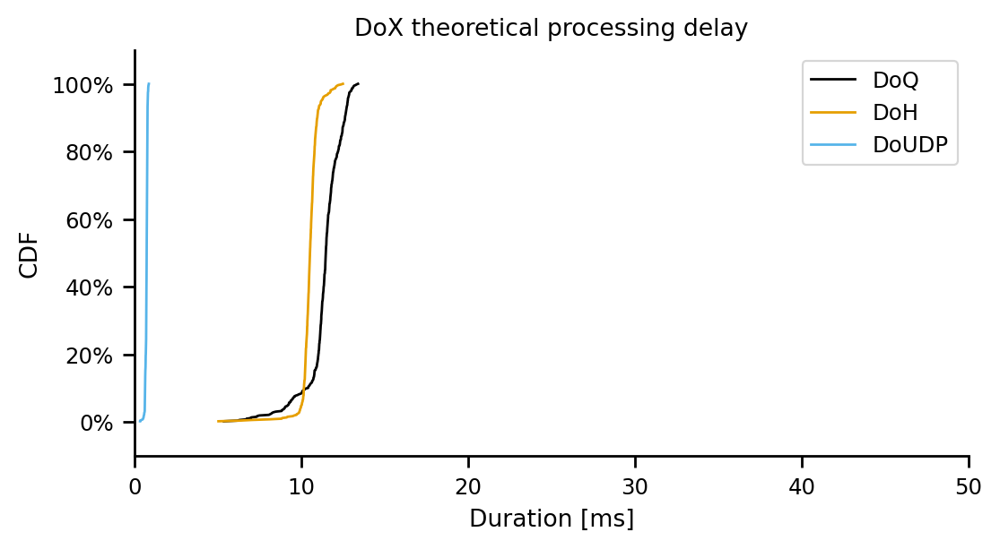

DoQ
count    528.000000
mean      12.611617
std        0.921538
min        7.142917
10%       11.949976
20%       12.238409
25%       12.321127
30%       12.369743
40%       12.470842
50%       12.550935
60%       12.670611
70%       12.847259
75%       12.993842
80%       13.275968
90%       13.751922
100%      14.747563
max       14.747563
Name: theoretical_processing_delay, dtype: float64
DoH
count    528.000000
mean      10.959905
std        0.577704
min        6.902195
10%       10.542209
20%       10.668076
25%       10.725291
30%       10.766446
40%       10.844960
50%       10.916556
60%       10.987787
70%       11.079276
75%       11.129310
80%       11.184996
90%       11.386717
100%      13.217810
max       13.217810
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    528.000000
mean       0.777970
std        0.060919
min        0.379071
10%        0.697757
20%        0.748757
25%        0.762768
30%        0.770506
40%        0.781447
50%        0.789340
60% 

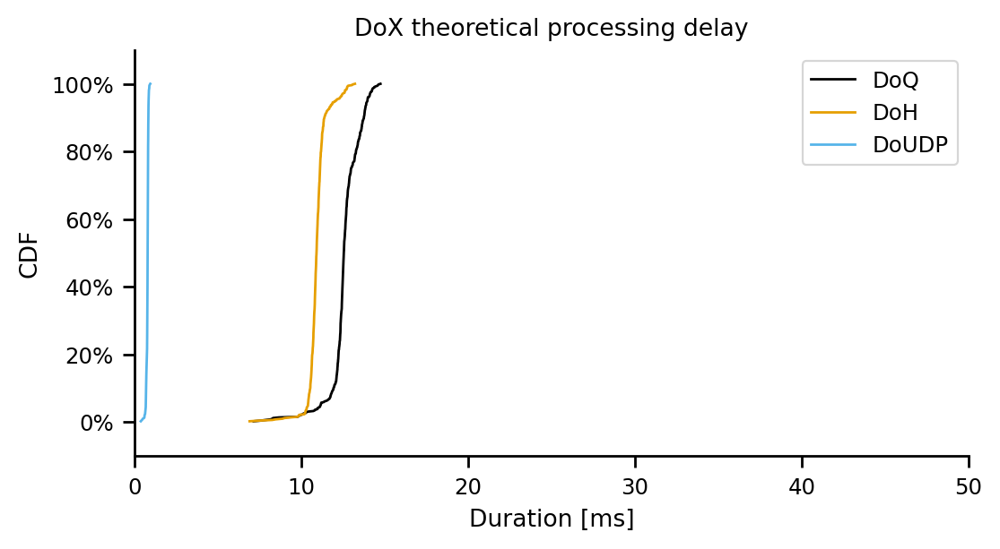

DoQ
count    528.000000
mean      39.755706
std        0.811952
min       34.977470
10%       39.241894
20%       39.390670
25%       39.426975
30%       39.482599
40%       39.572264
50%       39.653708
60%       39.783637
70%       39.988385
75%       40.124626
80%       40.314830
90%       40.821016
100%      41.934123
max       41.934123
Name: theoretical_processing_delay, dtype: float64
DoH
count    528.000000
mean      21.518308
std        0.461262
min       17.516603
10%       21.194723
20%       21.355147
25%       21.394914
30%       21.426118
40%       21.465533
50%       21.507895
60%       21.553080
70%       21.601208
75%       21.632970
80%       21.681560
90%       21.825316
100%      23.203308
max       23.203308
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    528.000000
mean       1.763732
std        0.060520
min        1.475840
10%        1.681571
20%        1.735316
25%        1.746549
30%        1.752999
40%        1.760686
50%        1.770404
60% 

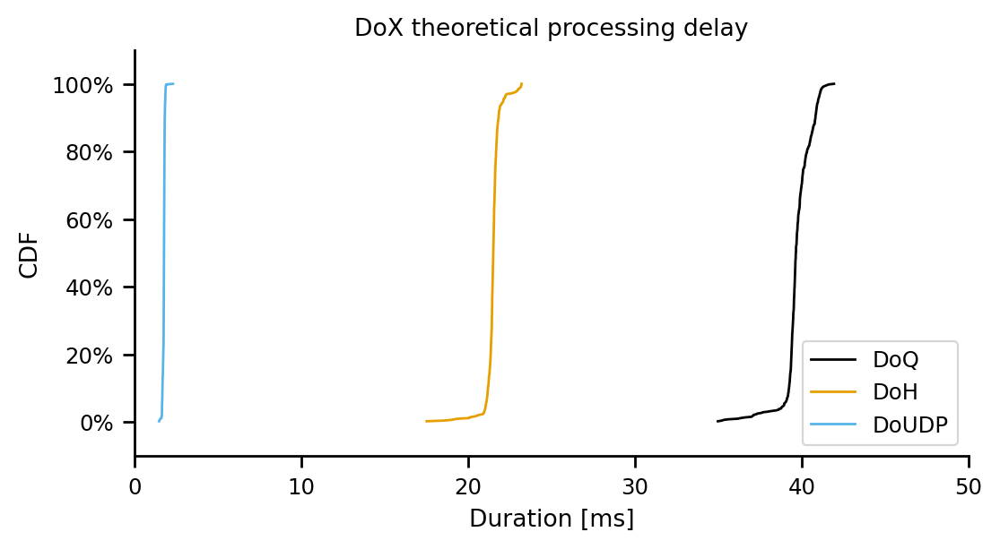

DoQ
count    527.000000
mean      12.397275
std        0.935384
min        6.804983
10%       11.835471
20%       11.982706
25%       12.021882
30%       12.068967
40%       12.155507
50%       12.254099
60%       12.435534
70%       12.729218
75%       13.011937
80%       13.222828
90%       13.480690
100%      14.403524
max       14.403524
Name: theoretical_processing_delay, dtype: float64
DoH
count    527.000000
mean      11.408146
std        0.524603
min        6.966863
10%       10.946873
20%       11.184287
25%       11.228815
30%       11.268820
40%       11.334753
50%       11.388692
60%       11.463430
70%       11.552185
75%       11.598627
80%       11.638897
90%       11.799064
100%      13.447409
max       13.447409
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    527.000000
mean       0.764019
std        0.051577
min        0.372522
10%        0.688547
20%        0.733238
25%        0.747292
30%        0.753914
40%        0.766155
50%        0.775199
60% 

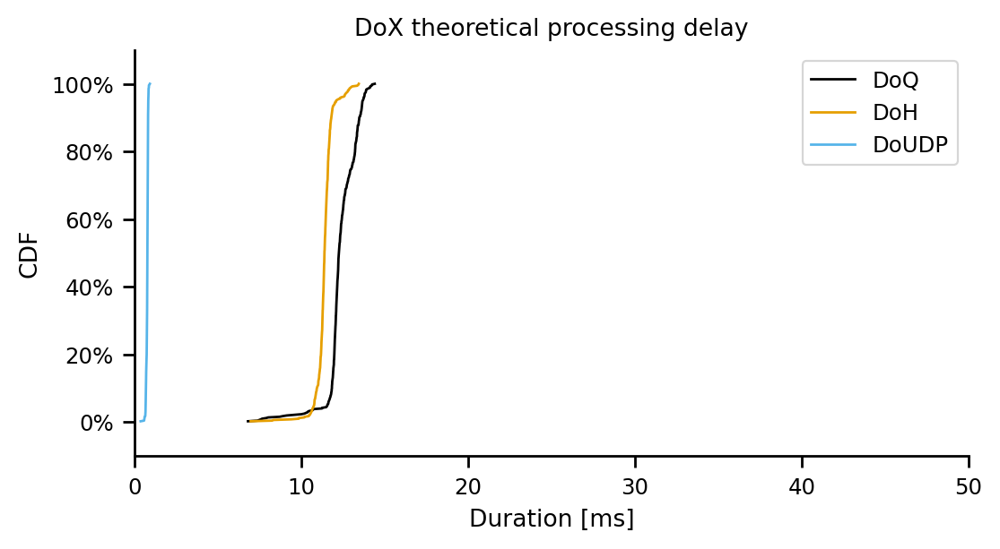

DoQ
count    527.000000
mean      16.466637
std        0.728062
min       11.426261
10%       15.983792
20%       16.099314
25%       16.140348
30%       16.174051
40%       16.242328
50%       16.323709
60%       16.416609
70%       16.540046
75%       16.706372
80%       17.075656
90%       17.552140
100%      18.215904
max       18.215904
Name: theoretical_processing_delay, dtype: float64
DoH
count    527.000000
mean      13.082980
std        0.487503
min        9.538345
10%       12.610365
20%       12.819322
25%       12.869519
30%       12.899959
40%       12.978643
50%       13.041473
60%       13.104254
70%       13.157846
75%       13.224614
80%       13.274287
90%       13.484997
100%      14.799214
max       14.799214
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    527.000000
mean       0.944077
std        0.048134
min        0.763412
10%        0.869219
20%        0.914746
25%        0.922919
30%        0.927913
40%        0.939191
50%        0.948631
60% 

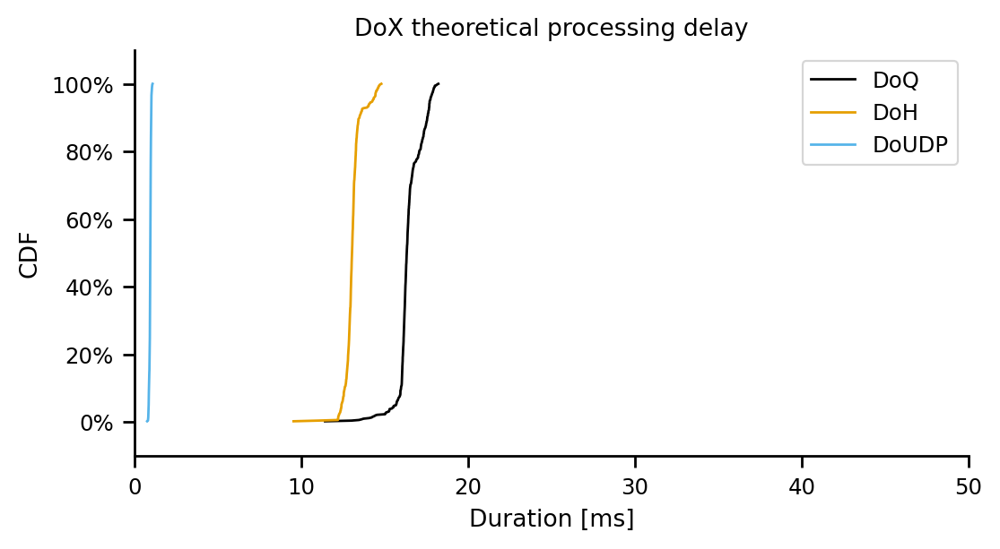

In [915]:
df_tmp = df_exchange_durations
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoH', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_processing_delay'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_processing_delay'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    #plt.axvline(x=1, color='gray', linestyle='--')
    #plt.axvline(x=2, color='gray', linestyle='--')
    #plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoX theoretical processing delay')

    ax.set_xlabel('Duration [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(0, 50)
    ax.legend()


    if log:
        fig.savefig('figures/processing-delay-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/processing-delay-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

In [916]:
median_doq_0rtt_4g = df_dns_and_h3[(df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.experiment_type == '4g')].full_plt.median()
median_doq_0rtt_4g_med = df_dns_and_h3[(df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.experiment_type == '4g-medium')].full_plt.median()
print(str((median_doq_0rtt_4g_med/(median_doq_0rtt_4g/100))-100)+"%")

6.381289564545568%


In [917]:
median_doudp_1rtt_4g = df_dns_and_h3[(df_dns_and_h3.experiment_description == 'DoUDP + H3 1-RTT') & (df_dns_and_h3.experiment_type == '4g')].full_plt.median()
median_doudp_1rtt_4g_med = df_dns_and_h3[(df_dns_and_h3.experiment_description == 'DoUDP + H3 1-RTT') & (df_dns_and_h3.experiment_type == '4g-medium')].full_plt.median()
print(str((median_doudp_1rtt_4g_med/(median_doudp_1rtt_4g/100))-100)+"%")

4.9881126359533%


In [918]:
df_handshake_durations = df_dns_perf_metrics[df_dns_perf_metrics.metric_type == 'handshake'].copy()
df_handshake_durations = pd.merge(df_handshake_durations, measurements, on='msm_id')
df_handshake_durations['rtt'] = 0
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == 'dsl', 42.35979, df_handshake_durations['rtt'])
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == 'cable', 25.17665, df_handshake_durations['rtt'])
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == 'fiber', 14.767147, df_handshake_durations['rtt'])
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == '4g', 91.85231065904635, df_handshake_durations['rtt'])
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == '4g-medium', 104.5041425140391, df_handshake_durations['rtt'])
df_handshake_durations['duration_in_rtt'] = df_handshake_durations['duration'] / df_handshake_durations['rtt']

DoQ
count    2637.000000
mean        1.376283
std         0.225765
min         1.055043
10%         1.114798
20%         1.119619
25%         1.121158
30%         1.122994
40%         1.225375
50%         1.426826
60%         1.479061
70%         1.549919
75%         1.554307
80%         1.577357
90%         1.671234
100%        1.803969
max         1.803969
Name: duration_in_rtt, dtype: float64


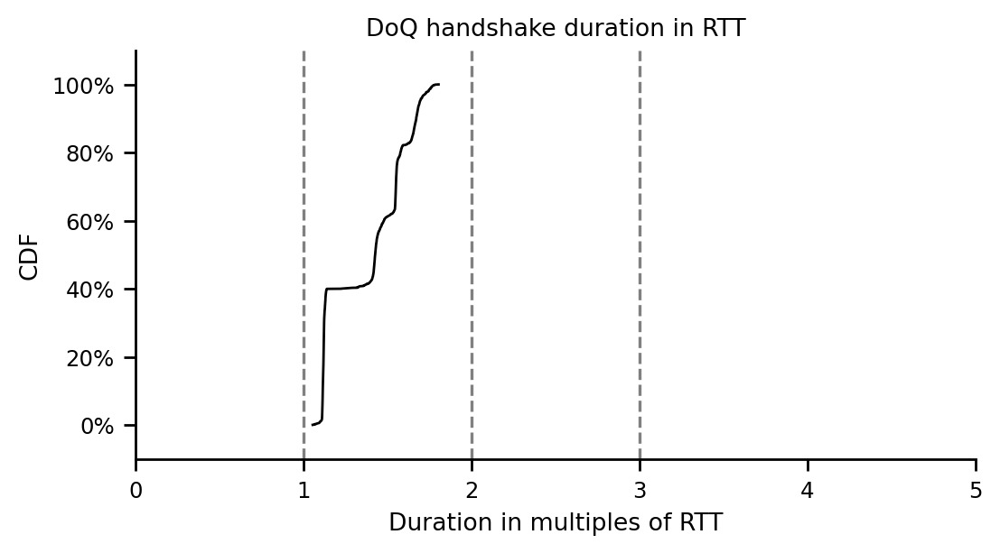

In [919]:
df_tmp = df_handshake_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=1, color='gray', linestyle='--')
plt.axvline(x=2, color='gray', linestyle='--')
plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoQ handshake duration in RTT')

ax.set_xlabel('Duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0, 5)


if log:
    fig.savefig('figures/handshake-duration-in-rtt-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/handshake-duration-in-rtt.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    527.000000
mean       1.662454
std        0.073046
min        1.288553
10%        1.589256
20%        1.644587
25%        1.650449
30%        1.655977
40%        1.662520
50%        1.671265
60%        1.678234
70%        1.687948
75%        1.692547
80%        1.705062
90%        1.744318
100%       1.803969
max        1.803969
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.048764
std        0.004078
min        1.022699
10%        1.043074
20%        1.046097
25%        1.047419
30%        1.047938
40%        1.048728
50%        1.049614
60%        1.050323
70%        1.050888
75%        1.051176
80%        1.051515
90%        1.052592
100%       1.058359
max        1.058359
Name: duration_in_rtt, dtype: float64


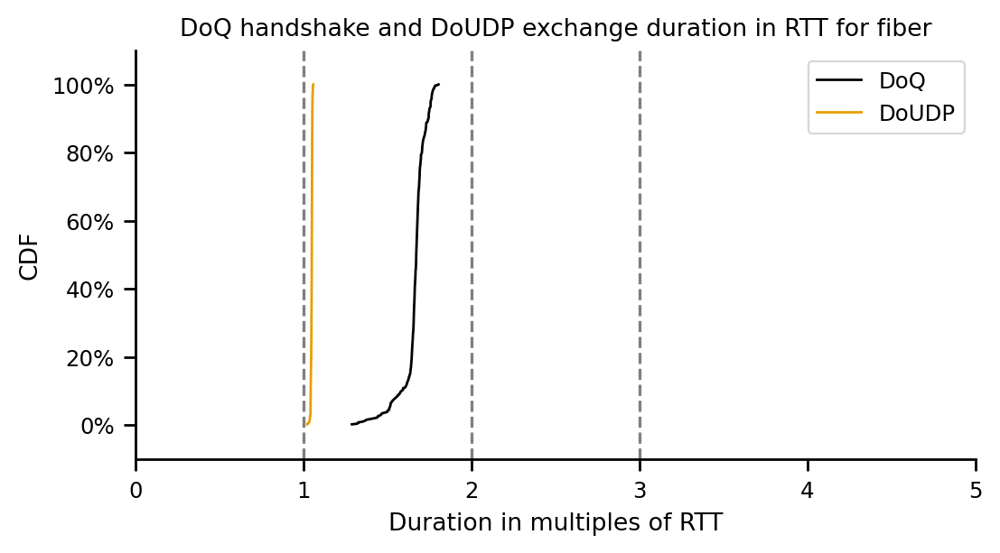

DoQ
count    528.000000
mean       1.427204
std        0.034331
min        1.223631
10%        1.403055
20%        1.415836
25%        1.418588
30%        1.420129
40%        1.423885
50%        1.427341
60%        1.431065
70%        1.436151
75%        1.439987
80%        1.445973
90%        1.465922
100%       1.505890
max        1.505890
Name: duration_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.030900
std        0.002420
min        1.015056
10%        1.027714
20%        1.029740
25%        1.030297
30%        1.030604
40%        1.031039
50%        1.031352
60%        1.031713
70%        1.032001
75%        1.032186
80%        1.032428
90%        1.033141
100%       1.037678
max        1.037678
Name: duration_in_rtt, dtype: float64


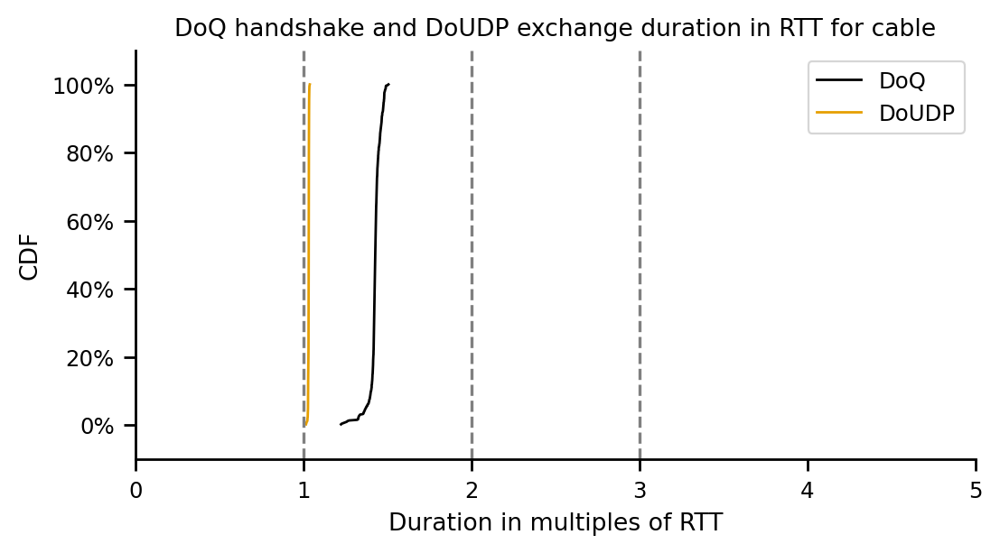

DoQ
count    528.000000
mean       1.552960
std        0.018005
min        1.444715
10%        1.544357
20%        1.546938
25%        1.547563
30%        1.548638
40%        1.549747
50%        1.551231
60%        1.553126
70%        1.554816
75%        1.557248
80%        1.560581
90%        1.577056
100%       1.590375
max        1.590375
Name: duration_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.041637
std        0.001429
min        1.034841
10%        1.039697
20%        1.040966
25%        1.041231
30%        1.041384
40%        1.041565
50%        1.041794
60%        1.042007
70%        1.042229
75%        1.042368
80%        1.042504
90%        1.042962
100%       1.054495
max        1.054495
Name: duration_in_rtt, dtype: float64


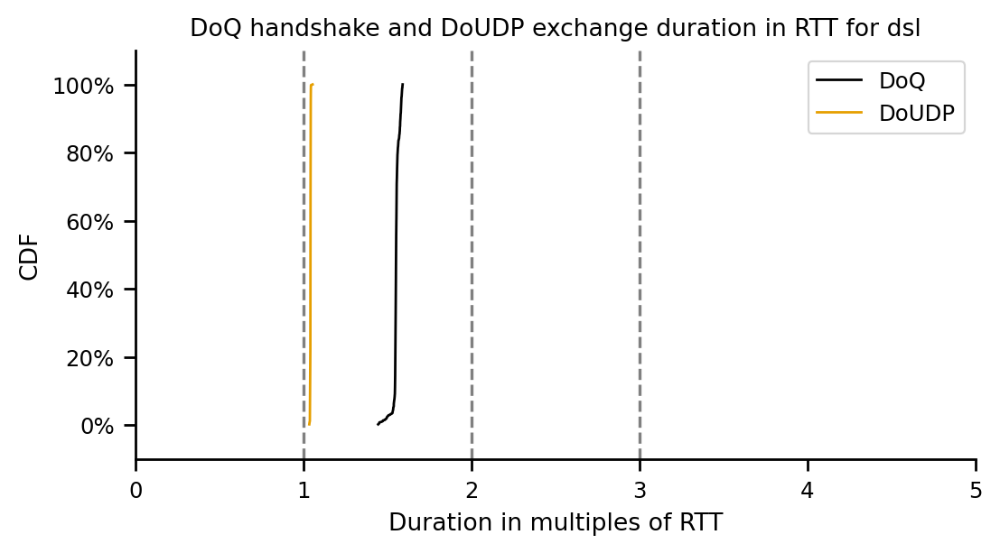

DoQ
count    527.000000
mean       1.116343
std        0.009602
min        1.055043
10%        1.111274
20%        1.112655
25%        1.113073
30%        1.113602
40%        1.114346
50%        1.115190
60%        1.116235
70%        1.117807
75%        1.119498
80%        1.123123
90%        1.128407
100%       1.136753
max        1.136753
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.008318
std        0.000562
min        1.004056
10%        1.007496
20%        1.007983
25%        1.008136
30%        1.008208
40%        1.008341
50%        1.008440
60%        1.008501
70%        1.008597
75%        1.008628
80%        1.008689
90%        1.008869
100%       1.010055
max        1.010055
Name: duration_in_rtt, dtype: float64


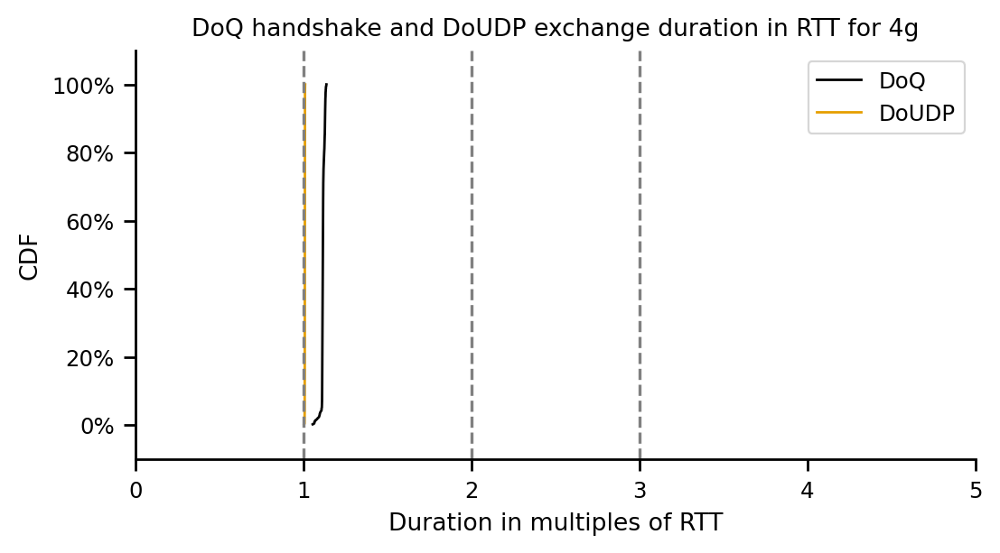

DoQ
count    527.000000
mean       1.122024
std        0.006585
min        1.076623
10%        1.117955
20%        1.119210
25%        1.119624
30%        1.119957
40%        1.120621
50%        1.121290
60%        1.122009
70%        1.122912
75%        1.123371
80%        1.124828
90%        1.131316
100%       1.139235
max        1.139235
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.009034
std        0.000461
min        1.007305
10%        1.008318
20%        1.008753
25%        1.008831
30%        1.008879
40%        1.008987
50%        1.009077
60%        1.009177
70%        1.009275
75%        1.009325
80%        1.009385
90%        1.009568
100%       1.010405
max        1.010405
Name: duration_in_rtt, dtype: float64


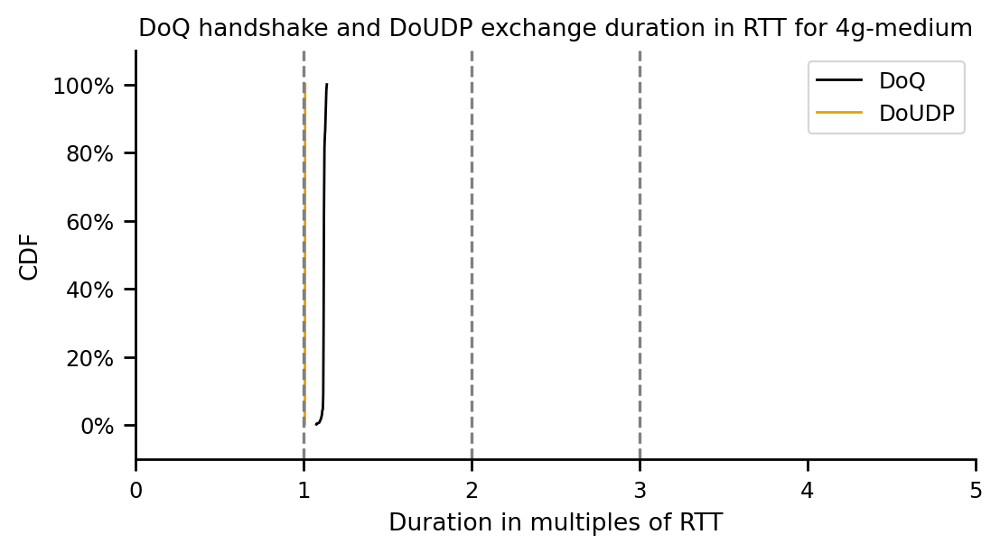

In [920]:
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        if proto == "DoQ":
            df_tmp = df_handshake_durations[df_handshake_durations.experiment_type == tech]
        if proto == "DoUDP":
            df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    plt.axvline(x=1, color='gray', linestyle='--')
    plt.axvline(x=2, color='gray', linestyle='--')
    plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoQ handshake and DoUDP exchange duration in RTT for '+tech)

    ax.set_xlabel('Duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(0, 5)
    ax.legend()


    if log:
        fig.savefig('figures/doq-handshake-doudp-exchange-duration-in-rtt-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/doq-handshake-doudp-exchange-duration-in-rtt-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

In [921]:
df_tcp_pings = pd.DataFrame(columns=['duration', 'experiment_type'], )
for access_tech in ['dsl', 'cable', 'fiber', '4g', '4g-medium']:
    df_tmp = pd.read_csv('tcp_ping_'+access_tech+'.log', sep=" ", header=None, names=['len', 'ip', 'ttl', '??', 'id', 'port', 'flags', 'seq', 'cwin', 'duration', 'unit'])
    if df_tmp['unit'].nunique() > 1:
        print('error, unit that isnt miliseconds in data')
    df_tmp['experiment_type'] = access_tech
    #df_tmp.rename(columns=lambda x: x.replace('0', 'duration'), inplace=True)
    df_tmp = df_tmp[['duration', 'experiment_type']]
    df_tmp = df_tmp.apply(lambda s: s.str.replace('rtt=', ''))
    df_tmp['duration'] = pd.to_numeric(df_tmp['duration'])
    df_tcp_pings = pd.concat([df_tcp_pings, df_tmp])
df_tcp_pings
df_tcp_pings['rtt'] = 0
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == 'dsl', 42.35979, df_tcp_pings['rtt'])
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == 'cable', 25.17665, df_tcp_pings['rtt'])
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == 'fiber', 14.767147, df_tcp_pings['rtt'])
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == '4g', 91.85231065904635, df_tcp_pings['rtt'])
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == '4g-medium', 104.5041425140391, df_tcp_pings['rtt'])
df_tcp_pings['duration_in_rtt'] = df_tcp_pings['duration'] / df_tcp_pings['rtt']
df_tcp_pings['transport_protocol'] = 'TCP ping'
df_tcp_pings

,duration,experiment_type,rtt,duration_in_rtt,transport_protocol
0,47.8,dsl,42.359790,1.128429,TCP ping
1,47.8,dsl,42.359790,1.128429,TCP ping
2,47.8,dsl,42.359790,1.128429,TCP ping
3,47.8,dsl,42.359790,1.128429,TCP ping
4,47.8,dsl,42.359790,1.128429,TCP ping
...,...,...,...,...,...
815,111.9,4g-medium,104.504143,1.070771,TCP ping
816,111.8,4g-medium,104.504143,1.069814,TCP ping
817,111.8,4g-medium,104.504143,1.069814,TCP ping
818,111.8,4g-medium,104.504143,1.069814,TCP ping


DoQ
count    527.000000
mean       1.662454
std        0.073046
min        1.288553
10%        1.589256
20%        1.644587
25%        1.650449
30%        1.655977
40%        1.662520
50%        1.671265
60%        1.678234
70%        1.687948
75%        1.692547
80%        1.705062
90%        1.744318
100%       1.803969
max        1.803969
Name: duration_in_rtt, dtype: float64
TCP ping
count    821.000000
mean       1.242471
std        3.340279
min        1.069943
10%        1.069943
20%        1.069943
25%        1.069943
30%        1.069943
40%        1.069943
50%        1.069943
60%        1.069943
70%        1.076714
75%        1.076714
80%        1.076714
90%        1.076714
100%      68.794602
max       68.794602
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.048764
std        0.004078
min        1.022699
10%        1.043074
20%        1.046097
25%        1.047419
30%        1.047938
40%        1.048728
50%        1.049614
60%        1.050323
70%  

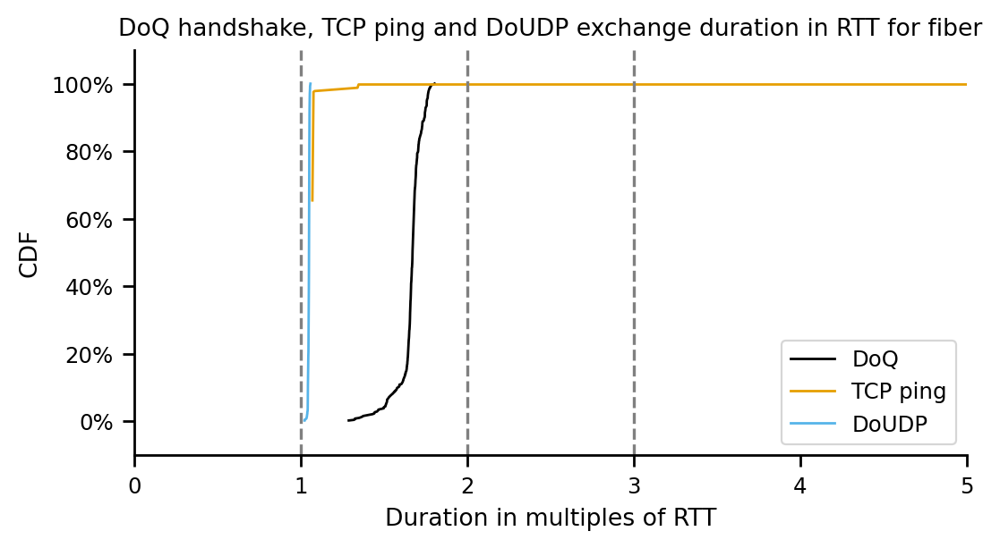

DoQ
count    528.000000
mean       1.427204
std        0.034331
min        1.223631
10%        1.403055
20%        1.415836
25%        1.418588
30%        1.420129
40%        1.423885
50%        1.427341
60%        1.431065
70%        1.436151
75%        1.439987
80%        1.445973
90%        1.465922
100%       1.505890
max        1.505890
Name: duration_in_rtt, dtype: float64
TCP ping
count    821.000000
mean       1.358406
std        1.959491
min        1.104198
10%        1.263075
20%        1.263075
25%        1.263075
30%        1.263075
40%        1.263075
50%        1.263075
60%        1.263075
70%        1.267047
75%        1.267047
80%        1.267047
90%        1.267047
100%      40.986390
max       40.986390
Name: duration_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.030900
std        0.002420
min        1.015056
10%        1.027714
20%        1.029740
25%        1.030297
30%        1.030604
40%        1.031039
50%        1.031352
60%        1.031713
70%  

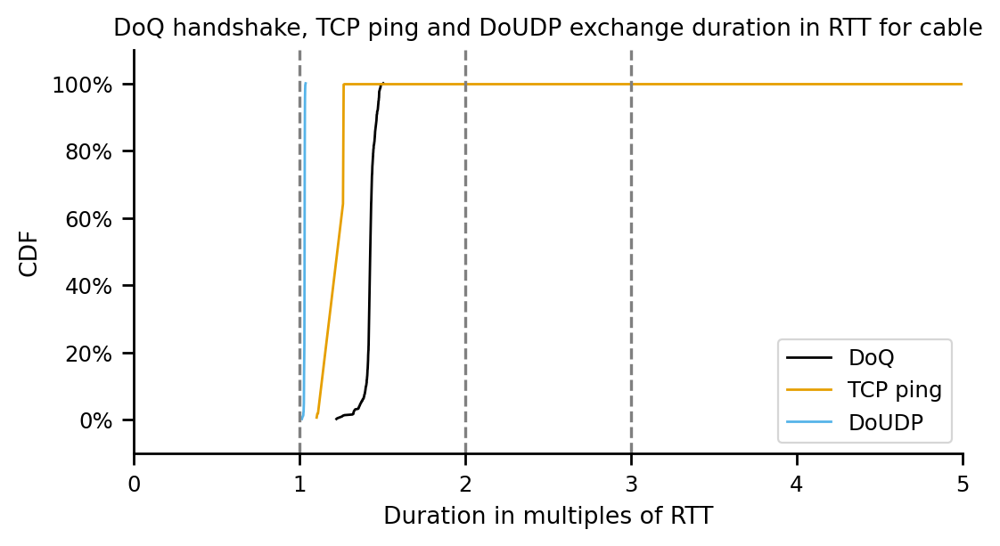

DoQ
count    528.000000
mean       1.552960
std        0.018005
min        1.444715
10%        1.544357
20%        1.546938
25%        1.547563
30%        1.548638
40%        1.549747
50%        1.551231
60%        1.553126
70%        1.554816
75%        1.557248
80%        1.560581
90%        1.577056
100%       1.590375
max        1.590375
Name: duration_in_rtt, dtype: float64
TCP ping
count    822.000000
mean       1.156456
std        0.823509
min        1.033999
10%        1.128429
20%        1.128429
25%        1.128429
30%        1.128429
40%        1.128429
50%        1.128429
60%        1.128429
70%        1.130789
75%        1.130789
80%        1.130789
90%        1.130789
100%      24.735722
max       24.735722
Name: duration_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.041637
std        0.001429
min        1.034841
10%        1.039697
20%        1.040966
25%        1.041231
30%        1.041384
40%        1.041565
50%        1.041794
60%        1.042007
70%  

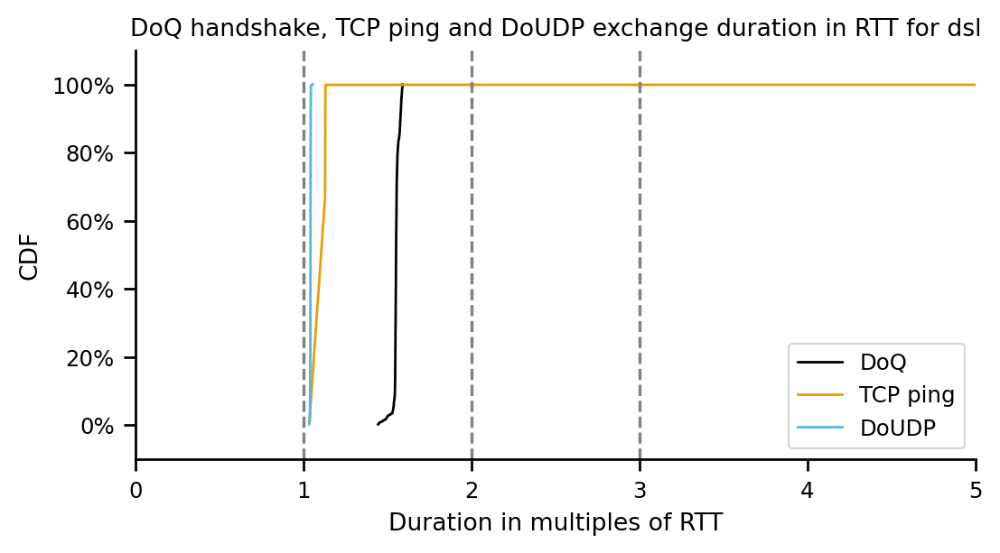

DoQ
count    527.000000
mean       1.116343
std        0.009602
min        1.055043
10%        1.111274
20%        1.112655
25%        1.113073
30%        1.113602
40%        1.114346
50%        1.115190
60%        1.116235
70%        1.117807
75%        1.119498
80%        1.123123
90%        1.128407
100%       1.136753
max        1.136753
Name: duration_in_rtt, dtype: float64
TCP ping
count    820.000000
mean       1.057367
std        0.380234
min        1.042979
10%        1.042979
20%        1.042979
25%        1.042979
30%        1.042979
40%        1.042979
50%        1.042979
60%        1.042979
70%        1.044067
75%        1.044067
80%        1.044067
90%        1.044067
100%      11.931110
max       11.931110
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.008318
std        0.000562
min        1.004056
10%        1.007496
20%        1.007983
25%        1.008136
30%        1.008208
40%        1.008341
50%        1.008440
60%        1.008501
70%  

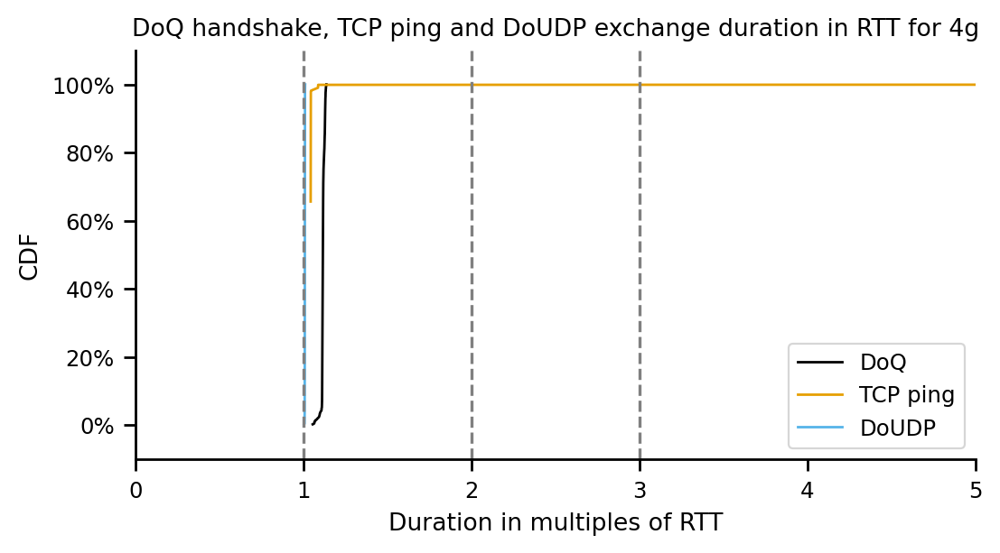

DoQ
count    527.000000
mean       1.122024
std        0.006585
min        1.076623
10%        1.117955
20%        1.119210
25%        1.119624
30%        1.119957
40%        1.120621
50%        1.121290
60%        1.122009
70%        1.122912
75%        1.123371
80%        1.124828
90%        1.131316
100%       1.139235
max        1.139235
Name: duration_in_rtt, dtype: float64
TCP ping
count    820.000000
mean       1.091992
std        0.472428
min        1.031538
10%        1.069814
20%        1.069814
25%        1.069814
30%        1.069814
40%        1.069814
50%        1.069814
60%        1.069814
70%        1.069814
75%        1.070771
80%        1.070771
90%        1.070771
100%      10.639770
max       10.639770
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.009034
std        0.000461
min        1.007305
10%        1.008318
20%        1.008753
25%        1.008831
30%        1.008879
40%        1.008987
50%        1.009077
60%        1.009177
70%  

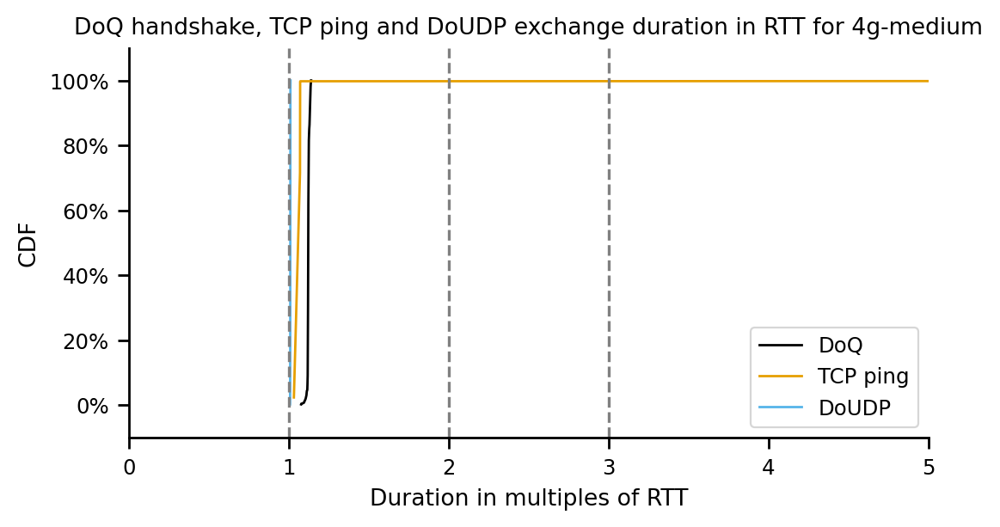

In [922]:
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'TCP ping', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        if proto == "DoQ":
            df_tmp = df_handshake_durations[df_handshake_durations.experiment_type == tech]
        if proto == "DoUDP":
            df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
        if proto == "TCP ping":
            df_tmp = df_tcp_pings[df_tcp_pings.experiment_type == tech]
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    plt.axvline(x=1, color='gray', linestyle='--')
    plt.axvline(x=2, color='gray', linestyle='--')
    plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoQ handshake, TCP ping and DoUDP exchange duration in RTT for '+tech)

    ax.set_xlabel('Duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(0, 5)
    ax.legend()


    if log:
        fig.savefig('figures/doq-handshake-tcp-ping-doudp-exchange-duration-in-rtt-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/doq-handshake-tcp-ping-doudp-exchange-duration-in-rtt-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

DoQ
count    2637.000000
mean        1.376283
std         0.225765
min         1.055043
10%         1.114798
20%         1.119619
25%         1.121158
30%         1.122994
40%         1.225375
50%         1.426826
60%         1.479061
70%         1.549919
75%         1.554307
80%         1.577357
90%         1.671234
100%        1.803969
max         1.803969
Name: duration_in_rtt, dtype: float64
TCP ping
count    4104.000000
mean        1.181384
std         1.793918
min         1.031538
10%         1.042979
20%         1.044067
25%         1.069814
30%         1.069814
40%         1.069943
50%         1.070771
60%         1.108170
70%         1.128429
75%         1.130789
80%         1.263075
90%         1.263075
100%       68.794602
max        68.794602
Name: duration_in_rtt, dtype: float64
DoUDP
count    2637.000000
mean        1.027737
std         0.016716
min         1.004056
10%         1.008337
20%         1.008715
25%         1.008908
30%         1.009111
40%         1.015557
50

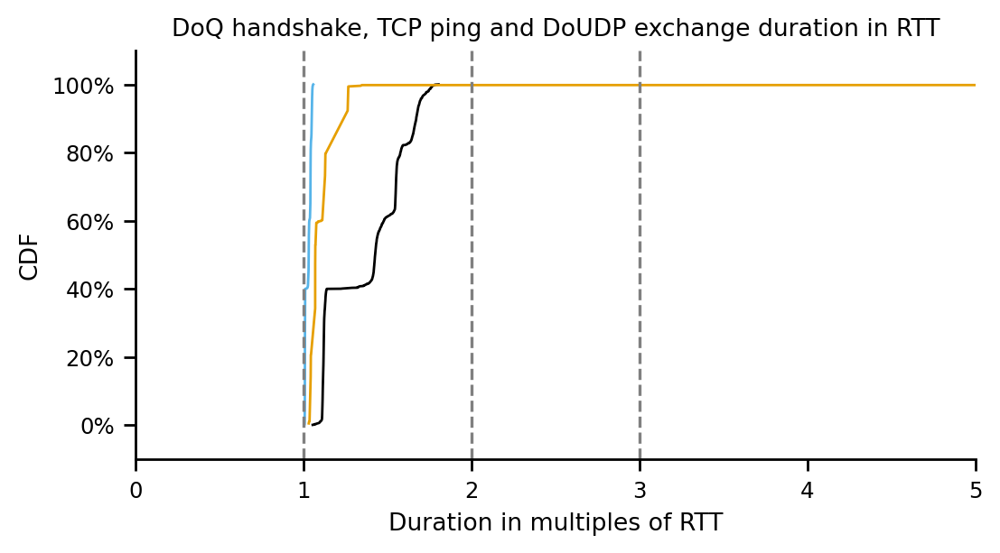

In [923]:
#df_tmp = df_handshake_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'TCP ping', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    if proto == "DoQ":
        df_tmp = df_handshake_durations
    if proto == "DoUDP":
        df_tmp = df_exchange_durations
    if proto == "TCP ping":
        df_tmp = df_tcp_pings
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=1, color='gray', linestyle='--')
plt.axvline(x=2, color='gray', linestyle='--')
plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoQ handshake, TCP ping and DoUDP exchange duration in RTT')

ax.set_xlabel('Duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0, 5)


if log:
    fig.savefig('figures/doq-handshake-tcp-ping-doudp-exchange-duration-in-rtt-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/doq-handshake-tcp-ping-doudp-exchange-duration-in-rtt.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [924]:
df_dns_and_h3['connect_duration'] = df_dns_and_h3['connectEnd'] - df_dns_and_h3['connectStart']
df_dns_and_h3['secure_connect_duration'] = df_dns_and_h3['connectEnd'] - df_dns_and_h3['secureConnectionStart']

In [925]:
df_h3_connect_times = df_dns_and_h3[['experiment_type', 'h3_description', 'connect_duration', 'secure_connect_duration']].copy()
df_h3_connect_times['rtt'] = 0
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == 'dsl', 42.35979, df_h3_connect_times['rtt'])
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == 'cable', 25.17665, df_h3_connect_times['rtt'])
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == 'fiber', 14.767147, df_h3_connect_times['rtt'])
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == '4g', 91.85231065904635, df_h3_connect_times['rtt'])
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == '4g-medium', 104.5041425140391, df_h3_connect_times['rtt'])
df_h3_connect_times['connect_in_rtt'] = df_h3_connect_times['connect_duration'] / df_h3_connect_times['rtt']
df_h3_connect_times['secure_connect_in_rtt'] = df_h3_connect_times['secure_connect_duration'] / df_h3_connect_times['rtt']

count    7911.000000
mean       68.333826
std        36.234192
min        18.700000
10%        23.700000
20%        29.800000
25%        34.900000
30%        35.300000
40%        36.900000
50%        65.500000
60%        67.100000
70%       101.900000
75%       102.000000
80%       103.600000
90%       116.700000
100%      118.300000
max       118.300000
Name: connect_duration, dtype: float64
count    7911.000000
mean       62.526887
std        36.039764
min        16.500000
10%        18.300000
20%        28.200000
25%        29.200000
30%        29.400000
40%        31.300000
50%        58.900000
60%        60.800000
70%        95.800000
75%        95.900000
80%        97.600000
90%       110.600000
100%      112.500000
max       112.500000
Name: connect_duration, dtype: float64


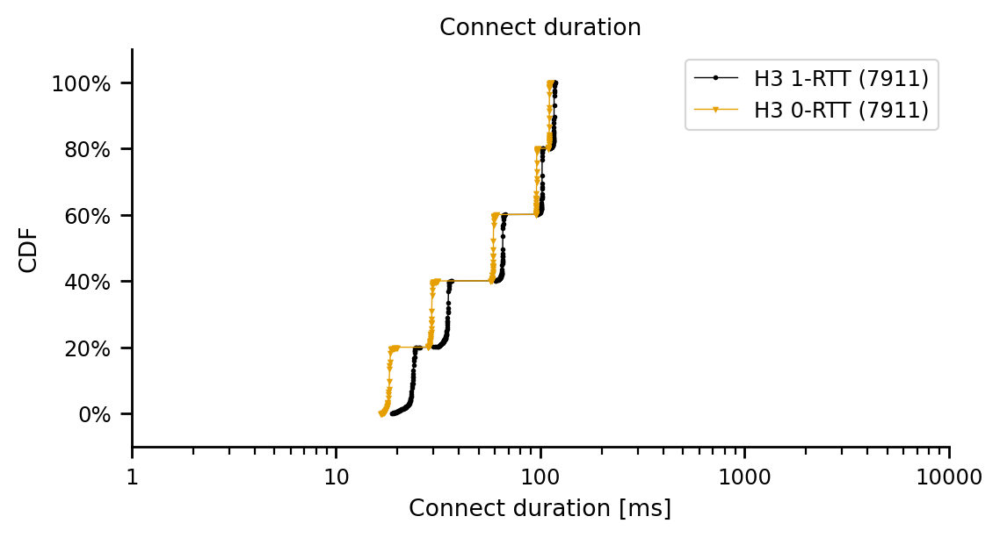

In [926]:
df_plt = df_h3_connect_times
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['H3 1-RTT', 'H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=True
for experiment in line_order:
        df_tmp = df_plt[(df_plt.h3_description == experiment)]
        if len(df_tmp['connect_duration']) == 0:
            continue
        print(df_tmp['connect_duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['connect_duration'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Connect duration')

ax.set_xlabel('Connect duration [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,10000)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    7911.000000
mean        1.347464
std         0.207535
min         1.050600
10%         1.108301
20%         1.111567
25%         1.114788
30%         1.116702
40%         1.183636
50%         1.402093
60%         1.417981
70%         1.541556
75%         1.546278
80%         1.550740
90%         1.604914
100%        1.747121
max         1.747121
Name: connect_in_rtt, dtype: float64
count    7911.000000
mean        1.177316
std         0.127276
min         1.032092
10%         1.042979
20%         1.050676
25%         1.057374
30%         1.058331
40%         1.117345
50%         1.167749
60%         1.179664
70%         1.239237
75%         1.246009
80%         1.354358
90%         1.390470
100%        1.435323
max         1.435323
Name: connect_in_rtt, dtype: float64


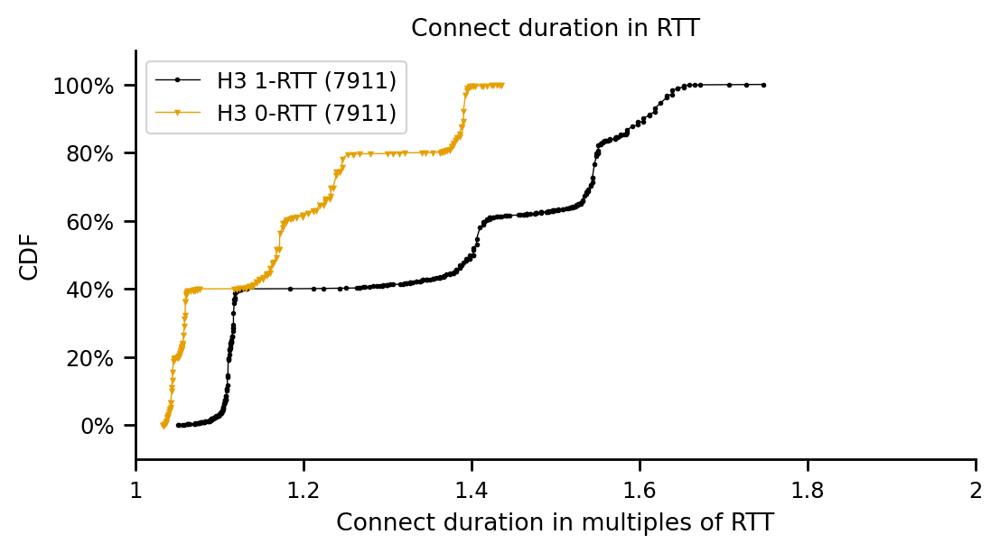

In [927]:
df_plt = df_h3_connect_times
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['H3 1-RTT', 'H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=False
for experiment in line_order:
        df_tmp = df_plt[(df_plt.h3_description == experiment)]
        if len(df_tmp['connect_in_rtt']) == 0:
            continue
        print(df_tmp['connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['connect_in_rtt'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Connect duration in RTT')

ax.set_xlabel('Connect duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,2)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    1584.000000
mean        1.539795
std         0.018321
min         1.421159
10%         1.525031
20%         1.534474
25%         1.536835
30%         1.539196
40%         1.543917
50%         1.546278
60%         1.546278
70%         1.548638
75%         1.548638
80%         1.548638
90%         1.550999
100%        1.584049
max         1.584049
Name: connect_in_rtt, dtype: float64
count    1584.000000
mean        1.388784
std         0.008791
min         1.345616
10%         1.378666
20%         1.383387
25%         1.385748
30%         1.388109
40%         1.390470
50%         1.390470
60%         1.390470
70%         1.392830
75%         1.392830
80%         1.392830
90%         1.395191
100%        1.435323
max         1.435323
Name: connect_in_rtt, dtype: float64


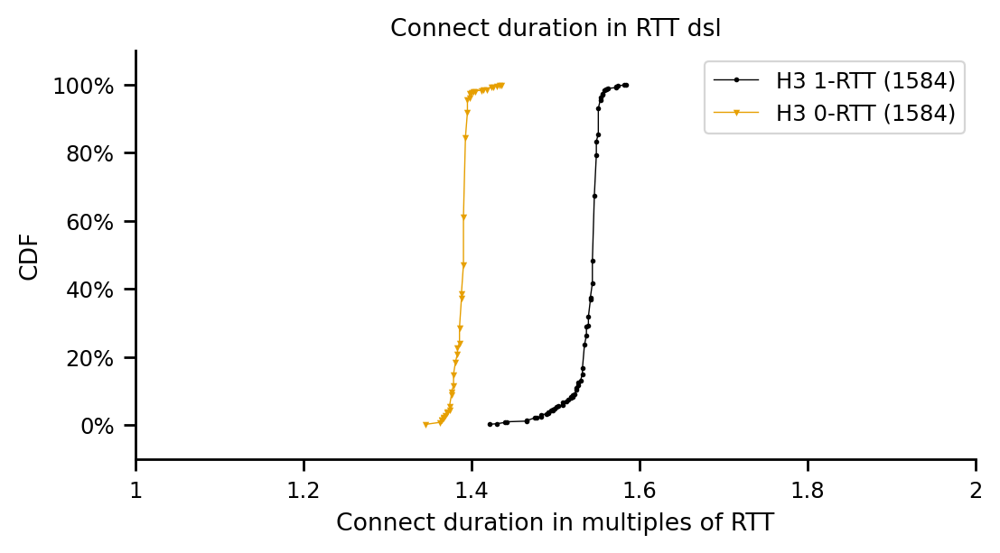

count    1584.000000
mean        1.389936
std         0.035858
min         1.183636
10%         1.342514
20%         1.378261
25%         1.386205
30%         1.390177
40%         1.398121
50%         1.402093
60%         1.406065
70%         1.410037
75%         1.410037
80%         1.410037
90%         1.414009
100%        1.465644
max         1.465644
Name: connect_in_rtt, dtype: float64
count    1584.000000
mean        1.165695
std         0.014216
min         1.120085
10%         1.145109
20%         1.155833
25%         1.159805
30%         1.163777
40%         1.167749
50%         1.167749
60%         1.171721
70%         1.171721
75%         1.171721
80%         1.175693
90%         1.175693
100%        1.243215
max         1.243215
Name: connect_in_rtt, dtype: float64


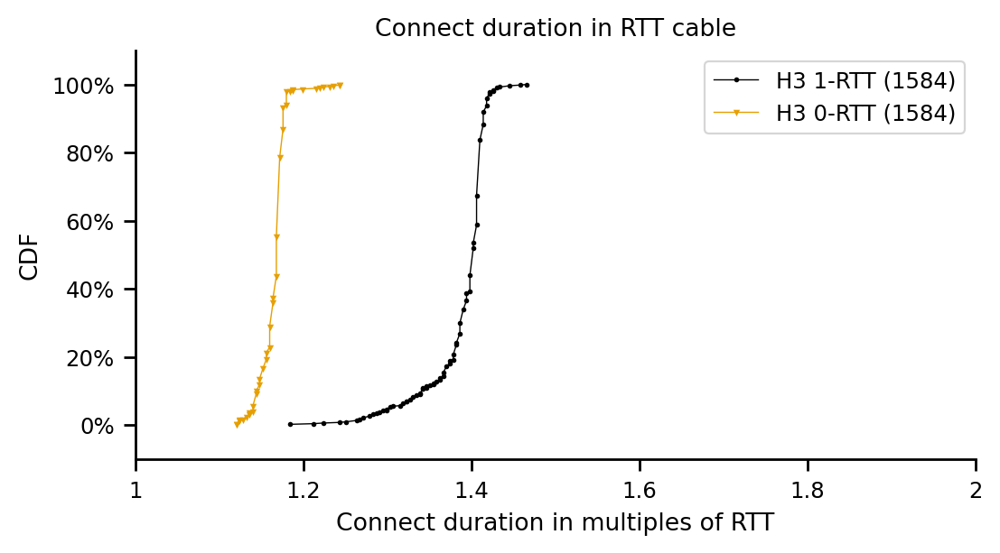

count    1581.000000
mean        1.586205
std         0.074203
min         1.266325
10%         1.496565
20%         1.564283
25%         1.577827
30%         1.584599
40%         1.598142
50%         1.604914
60%         1.618458
70%         1.625229
75%         1.632001
80%         1.632001
90%         1.638773
100%        1.747121
max         1.747121
Name: connect_in_rtt, dtype: float64
count    1581.000000
mean        1.230936
std         0.024333
min         1.117345
10%         1.198607
20%         1.218922
25%         1.225694
30%         1.225694
40%         1.232466
50%         1.239237
60%         1.239237
70%         1.239237
75%         1.246009
80%         1.246009
90%         1.246009
100%        1.354358
max         1.354358
Name: connect_in_rtt, dtype: float64


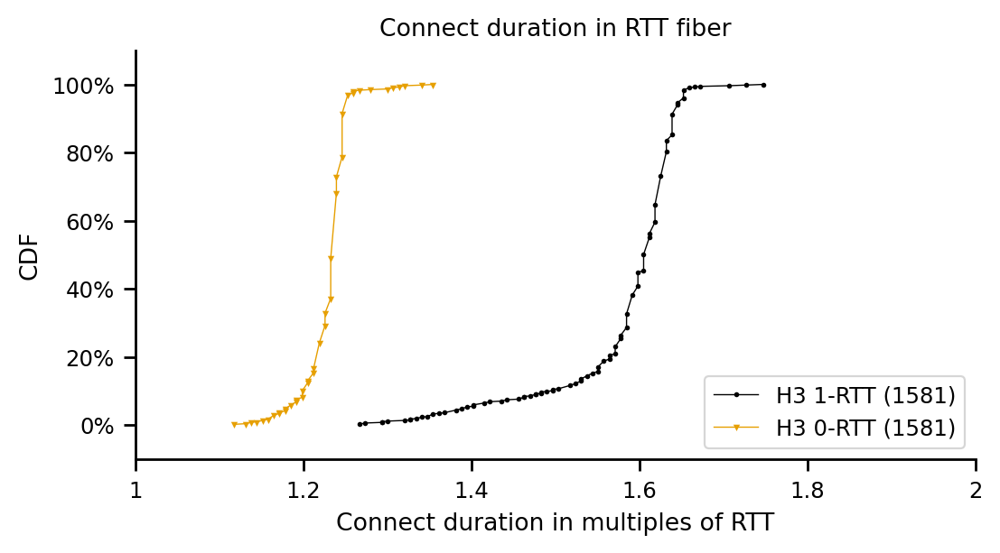

count    1581.000000
mean        1.106708
std         0.008823
min         1.050600
10%         1.100680
20%         1.105035
25%         1.106124
30%         1.107212
40%         1.108301
50%         1.109390
60%         1.110478
70%         1.110478
75%         1.110478
80%         1.110478
90%         1.111567
100%        1.127898
max         1.127898
Name: connect_in_rtt, dtype: float64
count    1581.000000
mean        1.042605
std         0.003260
min         1.032092
10%         1.037535
20%         1.040801
25%         1.041890
30%         1.041890
40%         1.042979
50%         1.042979
60%         1.044067
70%         1.044067
75%         1.044067
80%         1.045156
90%         1.045156
100%        1.062575
max         1.062575
Name: connect_in_rtt, dtype: float64


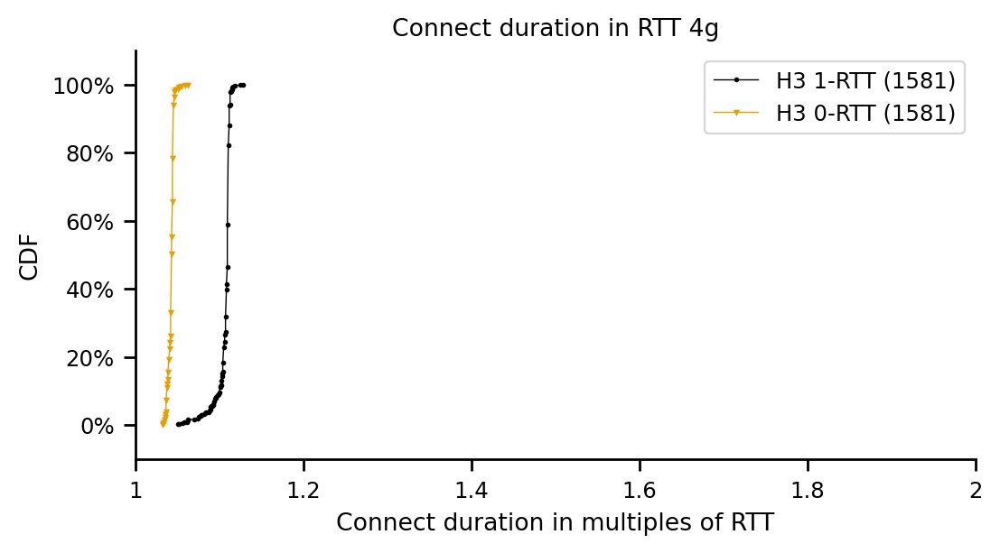

count    1581.000000
mean        1.114229
std         0.007637
min         1.064073
10%         1.106176
20%         1.112875
25%         1.113831
30%         1.114788
40%         1.115745
50%         1.116702
60%         1.116702
70%         1.117659
75%         1.117659
80%         1.117659
90%         1.118616
100%        1.132013
max         1.132013
Name: connect_in_rtt, dtype: float64
count    1581.000000
mean        1.058182
std         0.003237
min         1.042064
10%         1.053547
20%         1.056417
25%         1.057374
30%         1.057374
40%         1.058331
50%         1.058331
60%         1.059288
70%         1.059288
75%         1.059288
80%         1.059288
90%         1.060245
100%        1.076512
max         1.076512
Name: connect_in_rtt, dtype: float64


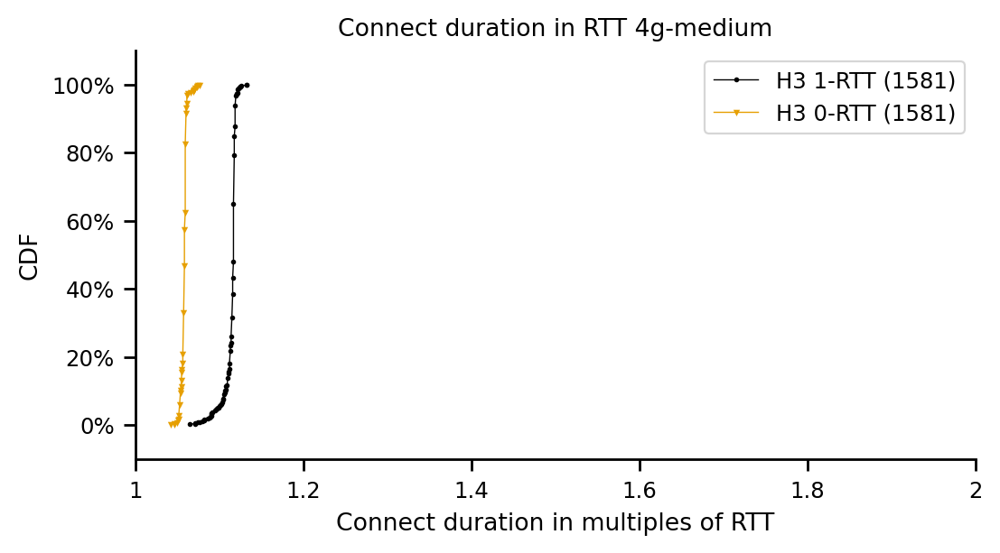

In [928]:
for experiment_type in df_h3_connect_times.experiment_type.unique():
    df_plt = df_h3_connect_times[df_h3_connect_times.experiment_type == experiment_type]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['H3 1-RTT', 'H3 0-RTT']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

    lnwidth = 0.5
    mrksize = 1
    log=False
    for experiment in line_order:
            df_tmp = df_plt[(df_plt.h3_description == experiment)]
            if len(df_tmp['connect_in_rtt']) == 0:
                continue
            print(df_tmp['connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

            dfplt = make_cdf(df_tmp['connect_in_rtt'])
            dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Connect duration in RTT '+experiment_type)

    ax.set_xlabel('Connect duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(1,2)


    ax.legend()

    #if log:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
    #else:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
    plt.show()

H3 1-RTT
count    1584.000000
mean        1.539795
std         0.018321
min         1.421159
10%         1.525031
20%         1.534474
25%         1.536835
30%         1.539196
40%         1.543917
50%         1.546278
60%         1.546278
70%         1.548638
75%         1.548638
80%         1.548638
90%         1.550999
100%        1.584049
max         1.584049
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    1584.000000
mean        1.388784
std         0.008791
min         1.345616
10%         1.378666
20%         1.383387
25%         1.385748
30%         1.388109
40%         1.390470
50%         1.390470
60%         1.390470
70%         1.392830
75%         1.392830
80%         1.392830
90%         1.395191
100%        1.435323
max         1.435323
Name: connect_in_rtt, dtype: float64
DoQ
count    528.000000
mean       1.552960
std        0.018005
min        1.444715
10%        1.544357
20%        1.546938
25%        1.547563
30%        1.548638
40%        1.549747
50%       

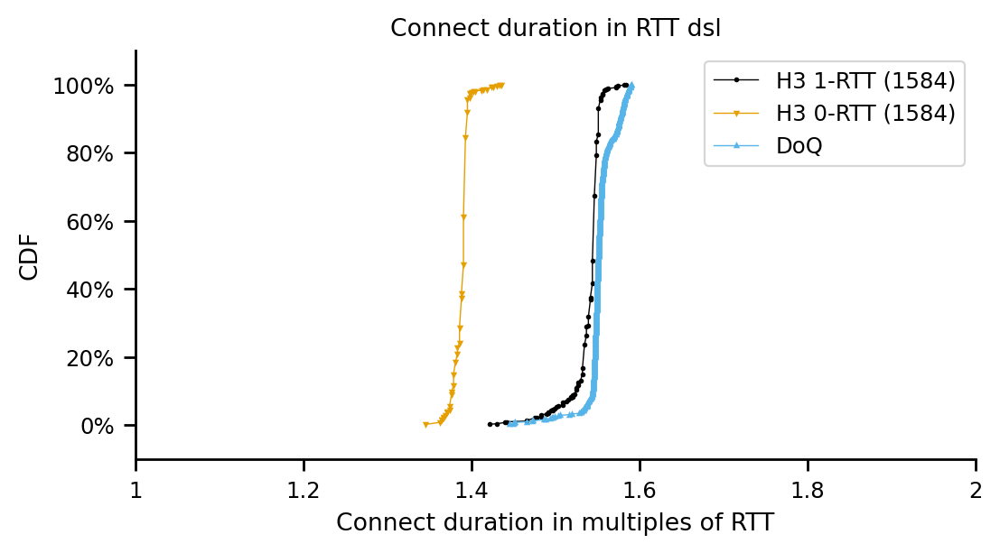

H3 1-RTT
count    1584.000000
mean        1.389936
std         0.035858
min         1.183636
10%         1.342514
20%         1.378261
25%         1.386205
30%         1.390177
40%         1.398121
50%         1.402093
60%         1.406065
70%         1.410037
75%         1.410037
80%         1.410037
90%         1.414009
100%        1.465644
max         1.465644
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    1584.000000
mean        1.165695
std         0.014216
min         1.120085
10%         1.145109
20%         1.155833
25%         1.159805
30%         1.163777
40%         1.167749
50%         1.167749
60%         1.171721
70%         1.171721
75%         1.171721
80%         1.175693
90%         1.175693
100%        1.243215
max         1.243215
Name: connect_in_rtt, dtype: float64
DoQ
count    528.000000
mean       1.427204
std        0.034331
min        1.223631
10%        1.403055
20%        1.415836
25%        1.418588
30%        1.420129
40%        1.423885
50%       

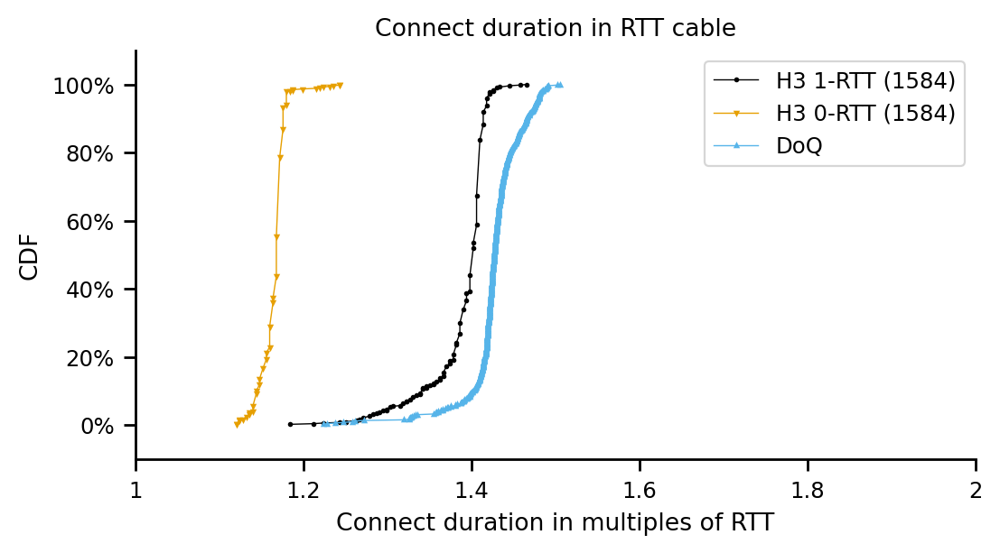

H3 1-RTT
count    1581.000000
mean        1.586205
std         0.074203
min         1.266325
10%         1.496565
20%         1.564283
25%         1.577827
30%         1.584599
40%         1.598142
50%         1.604914
60%         1.618458
70%         1.625229
75%         1.632001
80%         1.632001
90%         1.638773
100%        1.747121
max         1.747121
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    1581.000000
mean        1.230936
std         0.024333
min         1.117345
10%         1.198607
20%         1.218922
25%         1.225694
30%         1.225694
40%         1.232466
50%         1.239237
60%         1.239237
70%         1.239237
75%         1.246009
80%         1.246009
90%         1.246009
100%        1.354358
max         1.354358
Name: connect_in_rtt, dtype: float64
DoQ
count    527.000000
mean       1.662454
std        0.073046
min        1.288553
10%        1.589256
20%        1.644587
25%        1.650449
30%        1.655977
40%        1.662520
50%       

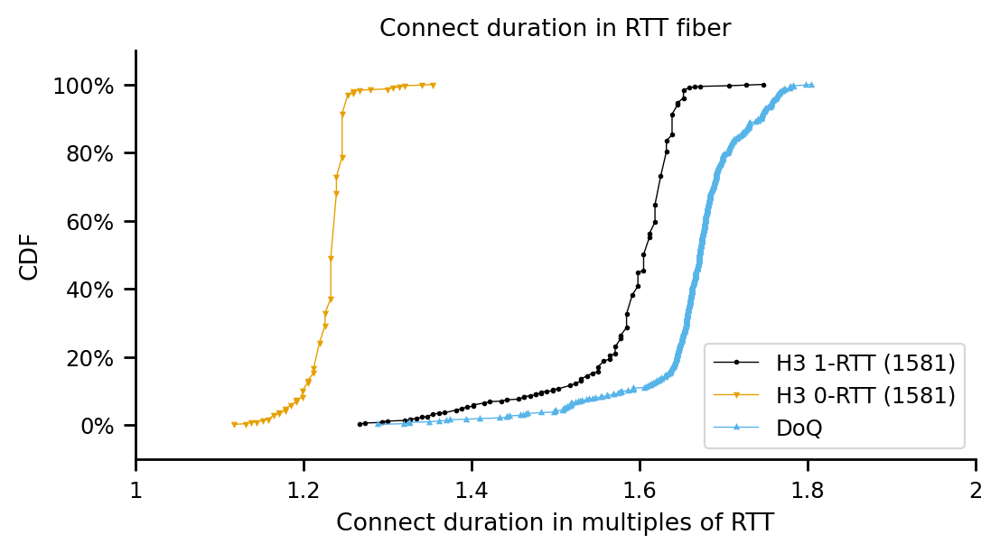

H3 1-RTT
count    1581.000000
mean        1.106708
std         0.008823
min         1.050600
10%         1.100680
20%         1.105035
25%         1.106124
30%         1.107212
40%         1.108301
50%         1.109390
60%         1.110478
70%         1.110478
75%         1.110478
80%         1.110478
90%         1.111567
100%        1.127898
max         1.127898
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    1581.000000
mean        1.042605
std         0.003260
min         1.032092
10%         1.037535
20%         1.040801
25%         1.041890
30%         1.041890
40%         1.042979
50%         1.042979
60%         1.044067
70%         1.044067
75%         1.044067
80%         1.045156
90%         1.045156
100%        1.062575
max         1.062575
Name: connect_in_rtt, dtype: float64
DoQ
count    527.000000
mean       1.116343
std        0.009602
min        1.055043
10%        1.111274
20%        1.112655
25%        1.113073
30%        1.113602
40%        1.114346
50%       

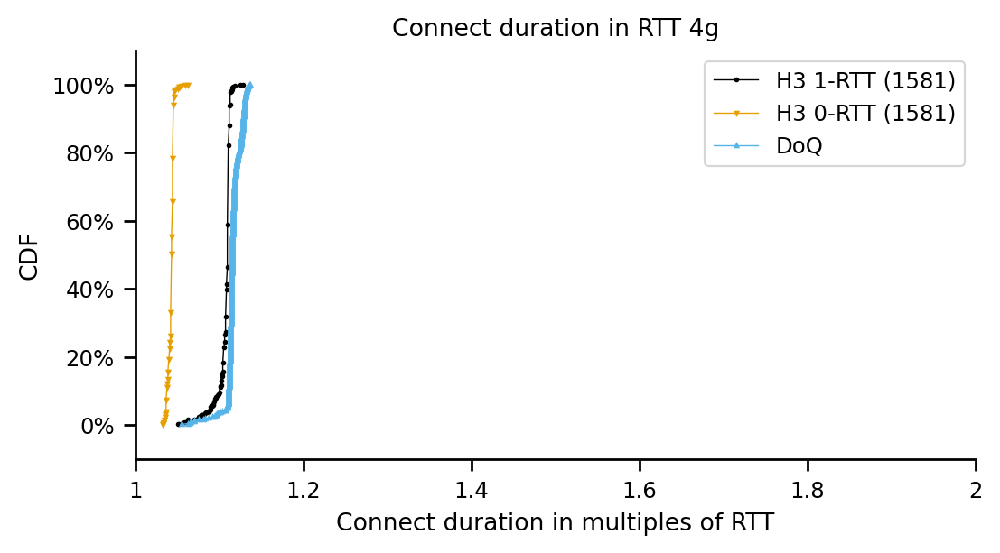

H3 1-RTT
count    1581.000000
mean        1.114229
std         0.007637
min         1.064073
10%         1.106176
20%         1.112875
25%         1.113831
30%         1.114788
40%         1.115745
50%         1.116702
60%         1.116702
70%         1.117659
75%         1.117659
80%         1.117659
90%         1.118616
100%        1.132013
max         1.132013
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    1581.000000
mean        1.058182
std         0.003237
min         1.042064
10%         1.053547
20%         1.056417
25%         1.057374
30%         1.057374
40%         1.058331
50%         1.058331
60%         1.059288
70%         1.059288
75%         1.059288
80%         1.059288
90%         1.060245
100%        1.076512
max         1.076512
Name: connect_in_rtt, dtype: float64
DoQ
count    527.000000
mean       1.122024
std        0.006585
min        1.076623
10%        1.117955
20%        1.119210
25%        1.119624
30%        1.119957
40%        1.120621
50%       

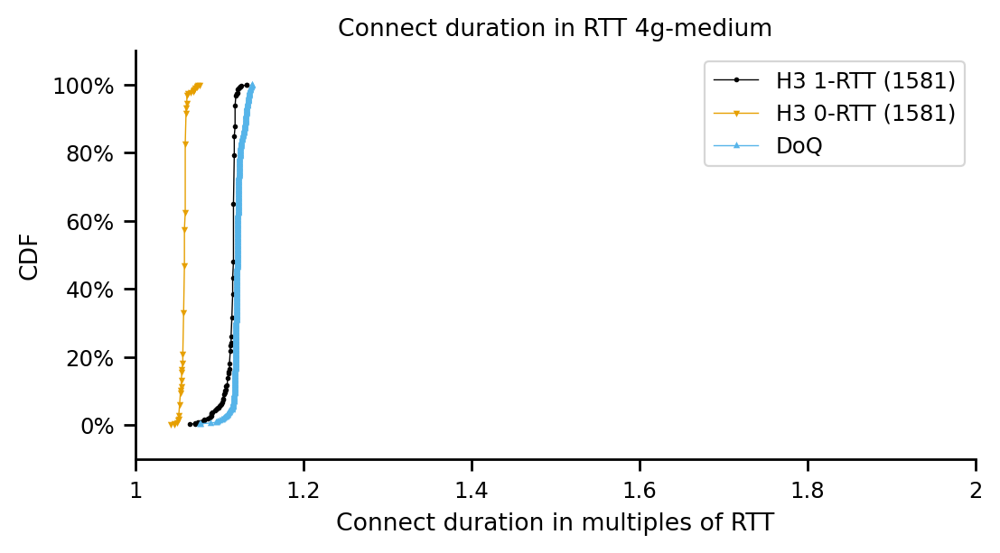

In [929]:
for experiment_type in df_h3_connect_times.experiment_type.unique():
    df_plt = df_h3_connect_times[df_h3_connect_times.experiment_type == experiment_type]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['H3 1-RTT', 'H3 0-RTT', 'DoQ']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

    lnwidth = 0.5
    mrksize = 1
    log=False
    for experiment in line_order:
            if 'H3' in experiment:
                df_tmp = df_plt[(df_plt.h3_description == experiment)]
                if len(df_tmp['connect_in_rtt']) == 0:
                    continue
                print(experiment)
                print(df_tmp['connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['connect_in_rtt'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)
            else:
                df_tmp = df_handshake_durations[df_handshake_durations.experiment_type == experiment_type]
                print(experiment)
                print(df_tmp[df_tmp.transport_protocol == experiment]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
                dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == experiment]['duration_in_rtt'])
                dfplt.plot(ax=ax, label=experiment, marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)
            

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Connect duration in RTT '+experiment_type)

    ax.set_xlabel('Connect duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(1,2)


    ax.legend()

    #if log:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
    #else:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
    plt.show()

count    7911.000000
mean       67.920743
std        36.229730
min        18.400000
10%        23.400000
20%        29.600000
25%        34.500000
30%        34.900000
40%        36.700000
50%        65.000000
60%        66.700000
70%       101.500000
75%       101.600000
80%       103.100000
90%       116.200000
100%      117.900000
max       117.900000
Name: secure_connect_duration, dtype: float64
count    7911.000000
mean       62.112476
std        36.040311
min        16.200000
10%        17.800000
20%        28.000000
25%        28.800000
30%        29.000000
40%        30.900000
50%        58.500000
60%        60.300000
70%        95.400000
75%        95.500000
80%        97.300000
90%       110.200000
100%      112.000000
max       112.000000
Name: secure_connect_duration, dtype: float64


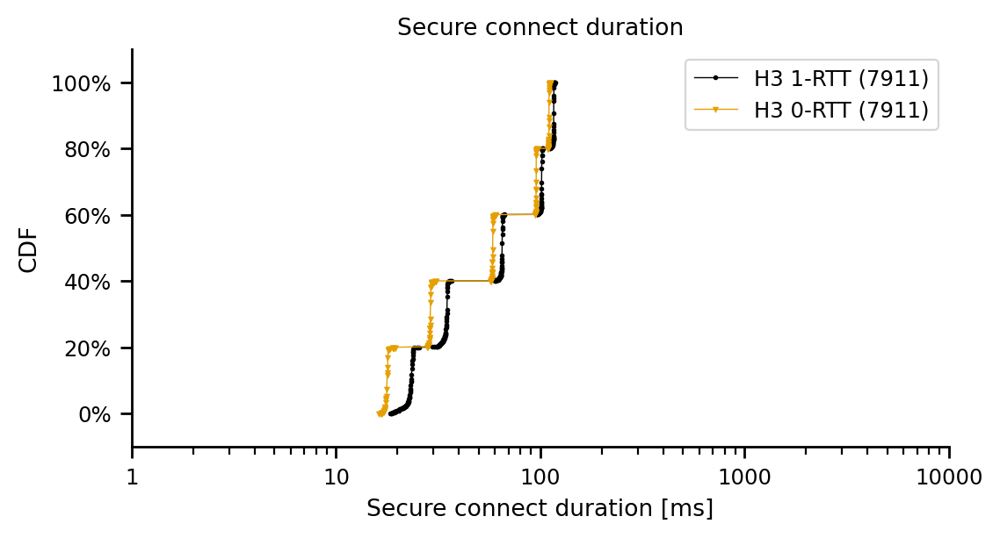

In [930]:
df_plt = df_dns_and_h3
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['H3 1-RTT', 'H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=True
for experiment in line_order:
        df_tmp = df_plt[(df_plt.h3_description == experiment)]
        if len(df_tmp['secure_connect_duration']) == 0:
            continue
        print(df_tmp['secure_connect_duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['secure_connect_duration'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Secure connect duration')

ax.set_xlabel('Secure connect duration [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,10000)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    7911.000000
mean        1.335006
std         0.200489
min         1.048422
10%         1.103946
20%         1.106124
25%         1.110961
30%         1.111918
40%         1.175693
50%         1.382233
60%         1.398121
70%         1.532113
75%         1.534474
80%         1.537196
90%         1.584599
100%        1.720034
max         1.720034
Name: secure_connect_in_rtt, dtype: float64
count    7911.000000
mean        1.164716
std         0.123755
min         1.028826
10%         1.038624
20%         1.047805
25%         1.053547
30%         1.054504
40%         1.097030
50%         1.151861
60%         1.159805
70%         1.205378
75%         1.212150
80%         1.340894
90%         1.381027
100%        1.423520
max         1.423520
Name: secure_connect_in_rtt, dtype: float64


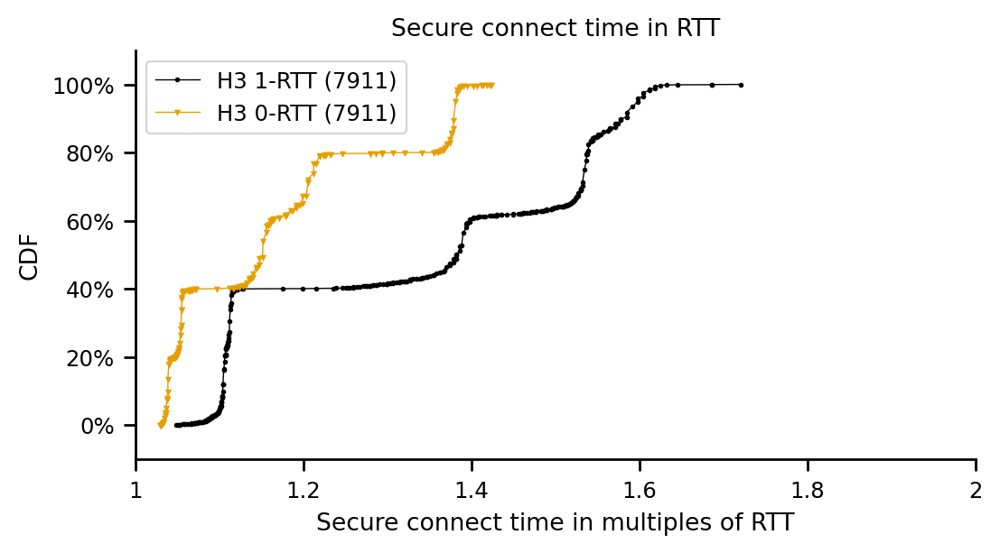

In [931]:
df_plt = df_h3_connect_times
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['H3 1-RTT', 'H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=False
for experiment in line_order:
        df_tmp = df_plt[(df_plt.h3_description == experiment)]
        if len(df_tmp['secure_connect_in_rtt']) == 0:
            continue
        print(df_tmp['secure_connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['secure_connect_in_rtt'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Secure connect time in RTT')

ax.set_xlabel('Secure connect time in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,2)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    1584.000000
mean        1.530097
std         0.017697
min         1.416438
10%         1.515588
20%         1.527392
25%         1.529753
30%         1.532113
40%         1.534474
50%         1.534474
60%         1.536835
70%         1.536835
75%         1.536835
80%         1.539196
90%         1.540848
100%        1.574606
max         1.574606
Name: secure_connect_in_rtt, dtype: float64
count    1584.000000
mean        1.379104
std         0.007468
min         1.340894
10%         1.371584
20%         1.373944
25%         1.376305
30%         1.378666
40%         1.378666
50%         1.381027
60%         1.381027
70%         1.381027
75%         1.381027
80%         1.383387
90%         1.383387
100%        1.423520
max         1.423520
Name: secure_connect_in_rtt, dtype: float64


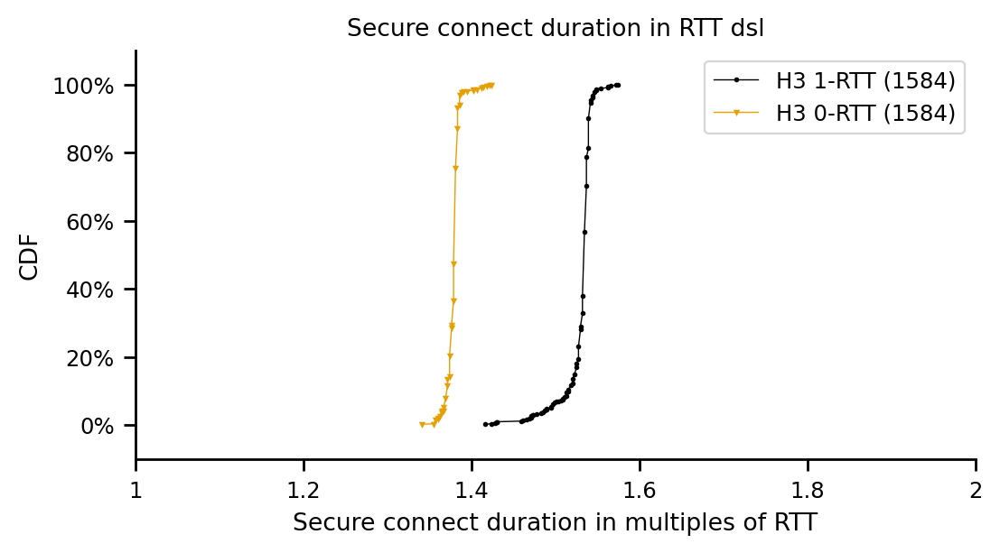

count    1584.000000
mean        1.373748
std         0.034318
min         1.175693
10%         1.326626
20%         1.362373
25%         1.370317
30%         1.374289
40%         1.382233
50%         1.386205
60%         1.390177
70%         1.390177
75%         1.390177
80%         1.394149
90%         1.398121
100%        1.457700
max         1.457700
Name: secure_connect_in_rtt, dtype: float64
count    1584.000000
mean        1.149258
std         0.012236
min         1.112142
10%         1.135973
20%         1.139945
25%         1.143917
30%         1.147889
40%         1.147889
50%         1.151861
60%         1.151861
70%         1.155833
75%         1.155833
80%         1.155833
90%         1.155833
100%        1.227328
max         1.227328
Name: secure_connect_in_rtt, dtype: float64


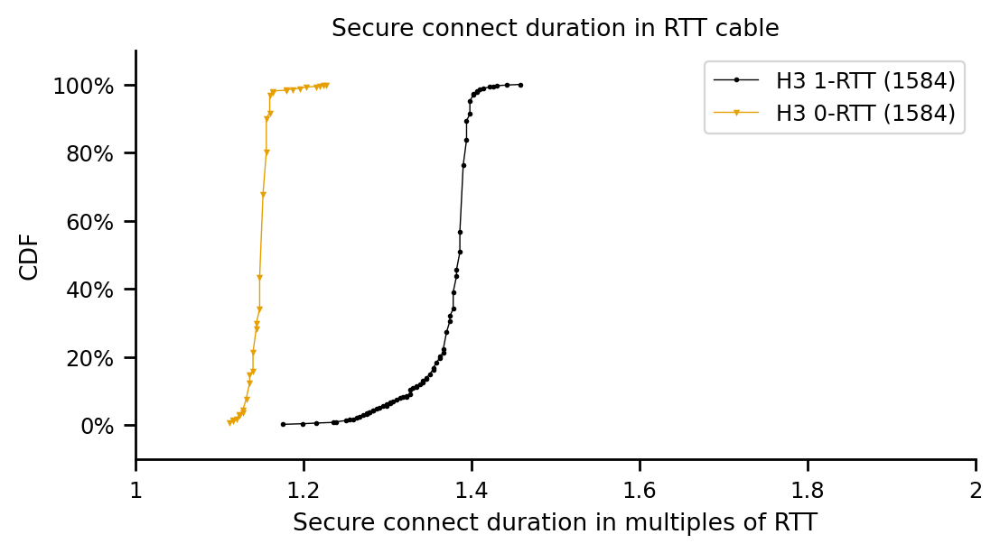

count    1581.000000
mean        1.558347
std         0.072323
min         1.246009
10%         1.476250
20%         1.537196
25%         1.550740
30%         1.557511
40%         1.571055
50%         1.584599
60%         1.591370
70%         1.598142
75%         1.598142
80%         1.604914
90%         1.611686
100%        1.720034
max         1.720034
Name: secure_connect_in_rtt, dtype: float64
count    1581.000000
mean        1.202526
std         0.021061
min         1.097030
10%         1.178291
20%         1.191835
25%         1.198607
30%         1.198607
40%         1.205378
50%         1.205378
60%         1.205378
70%         1.212150
75%         1.212150
80%         1.212150
90%         1.218922
100%        1.320499
max         1.320499
Name: secure_connect_in_rtt, dtype: float64


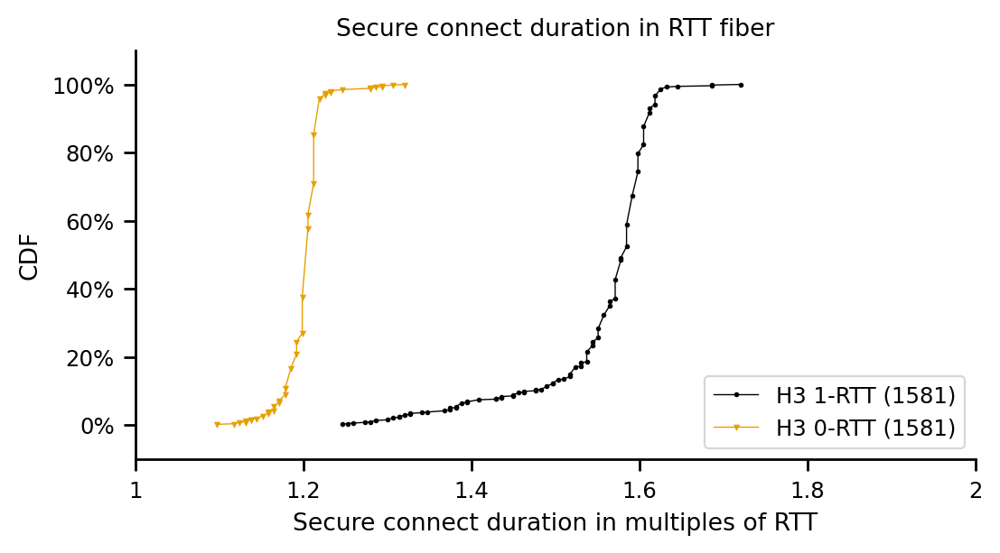

count    1581.000000
mean        1.102184
std         0.008547
min         1.048422
10%         1.096325
20%         1.101769
25%         1.102857
30%         1.102857
40%         1.103946
50%         1.105035
60%         1.105035
70%         1.106124
75%         1.106124
80%         1.106124
90%         1.107212
100%        1.122454
max         1.122454
Name: secure_connect_in_rtt, dtype: float64
count    1581.000000
mean        1.038109
std         0.002746
min         1.028826
10%         1.034269
20%         1.036446
25%         1.036446
30%         1.037535
40%         1.038624
50%         1.038624
60%         1.038624
70%         1.039713
75%         1.039713
80%         1.039713
90%         1.040801
100%        1.059309
max         1.059309
Name: secure_connect_in_rtt, dtype: float64


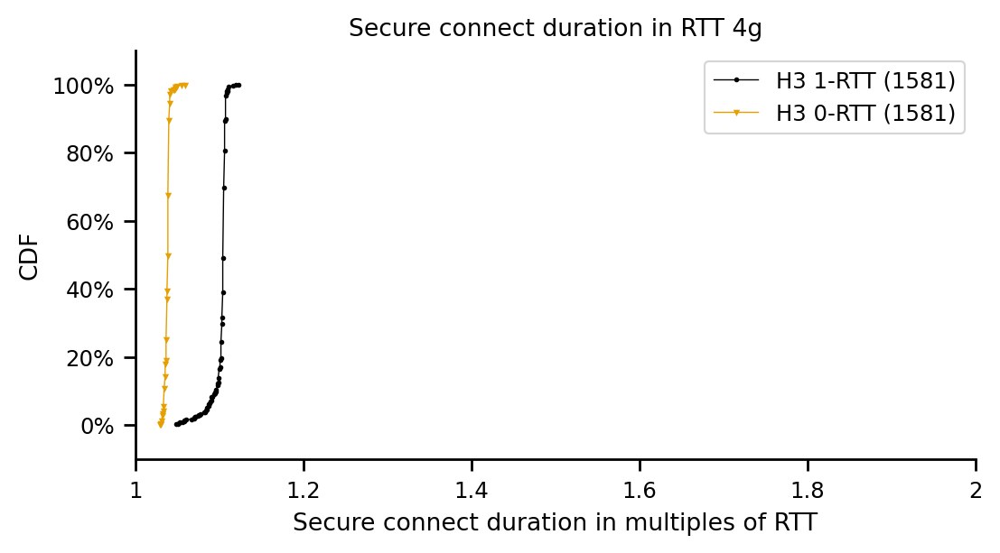

count    1581.000000
mean        1.110209
std         0.007443
min         1.062159
10%         1.103306
20%         1.110004
25%         1.110961
30%         1.110961
40%         1.111918
50%         1.111918
60%         1.112875
70%         1.112875
75%         1.112875
80%         1.113831
90%         1.113831
100%        1.128185
max         1.128185
Name: secure_connect_in_rtt, dtype: float64
count    1581.000000
mean        1.054204
std         0.002814
min         1.040150
10%         1.051633
20%         1.052590
25%         1.053547
30%         1.053547
40%         1.053547
50%         1.054504
60%         1.054504
70%         1.054504
75%         1.055461
80%         1.055461
90%         1.056417
100%        1.071728
max         1.071728
Name: secure_connect_in_rtt, dtype: float64


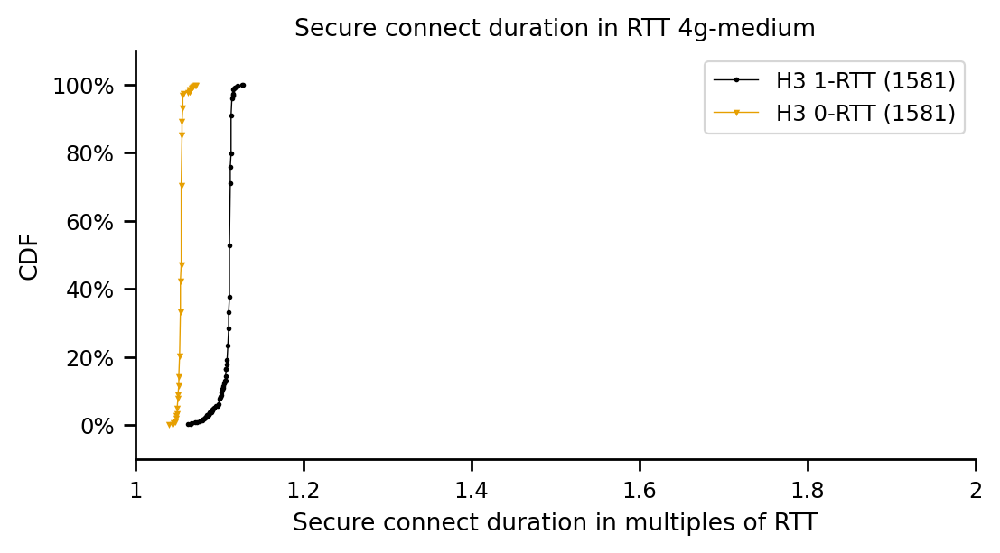

In [932]:
for experiment_type in df_h3_connect_times.experiment_type.unique():
    df_plt = df_h3_connect_times[df_h3_connect_times.experiment_type == experiment_type]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['H3 1-RTT', 'H3 0-RTT']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

    lnwidth = 0.5
    mrksize = 1
    log=False
    for experiment in line_order:
            df_tmp = df_plt[(df_plt.h3_description == experiment)]
            if len(df_tmp['secure_connect_in_rtt']) == 0:
                continue
            print(df_tmp['secure_connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

            dfplt = make_cdf(df_tmp['secure_connect_in_rtt'])
            dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Secure connect duration in RTT '+experiment_type)

    ax.set_xlabel('Secure connect duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(1,2)


    ax.legend()

    #if log:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
    #else:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
    plt.show()